In [2]:
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

In [3]:
sc.__version__

'1.11.0'

In [4]:
# plt.style.use("seaborn-v0_8-colorblind")

In [5]:
sc.settings.set_figure_params(dpi=50, facecolor="white")
plt.rcParams["axes.grid"] = False
%matplotlib inline

In [6]:
import cospar as cs
import pandas as pd
cs.logging.print_version()
cs.settings.verbosity = 2  # range: 0 (error),1 (warning),2 (info),3 (hint).
cs.settings.set_figure_params(
    format="png", figsize=[4, 3.5], dpi=75, fontsize=14, pointsize=3
)

Running cospar 0.3.3 (python 3.12.2) on 2025-12-01 23:01.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


In [8]:
# sc alignment dir, from preprocess 1_run_aln.sh
# filedir =  "/autofs/bal31/jhsu/home/projects/sc/data/hemo_paper_larry/larry-maester-d4/sc/2_bam/outs/"
filedir =   "/home/jhsu/projects/sc/all_backup/hemo_paper_larry/d8/"
filename =  filedir + "/filtered_feature_bc_matrix.h5"
adata = sc.read_10x_h5(filename)
adata.var_names_make_unique()

adata

/home/jhsu/miniconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/jhsu/miniconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 4636 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

In [6]:
# QC

# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

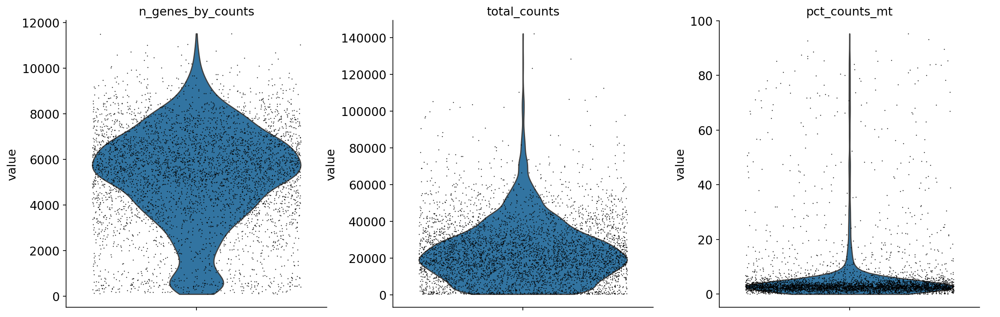

ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


In [7]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

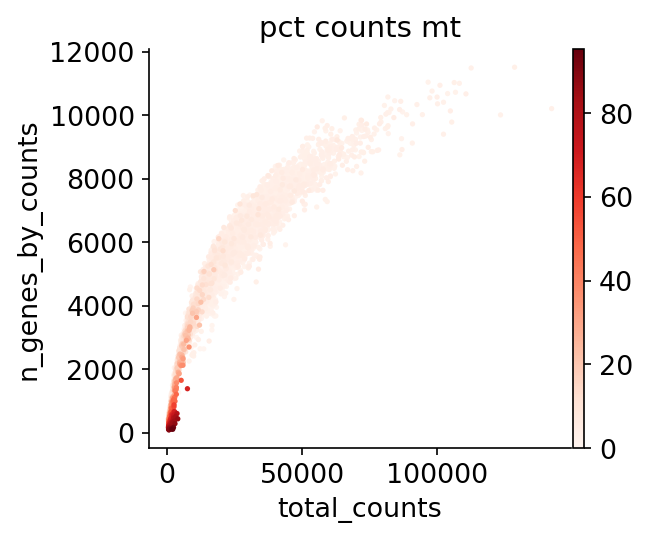

In [19]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")


In [20]:
_adata = adata[adata.obs['pct_counts_mt'] < 10]
adata = _adata

_adata = adata[adata.obs['total_counts'] < 100000]
adata = _adata

_adata = adata[adata.obs['n_genes_by_counts'] > 1000]
adata = _adata

sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

/autofs/bal31/jhsu/home/_env/anaconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


In [21]:
# find and drop doublet
sc.pp.scrublet(adata)

In [22]:
# adata.obs['predicted_doublet']
_adata = adata[adata.obs['predicted_doublet'] == False]
adata = _adata

In [23]:
# Saving count data
adata.layers["counts"] = adata.X.copy()

/tmp/ipykernel_1153755/2262359327.py:2: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata.layers["counts"] = adata.X.copy()


In [24]:
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

In [25]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000)

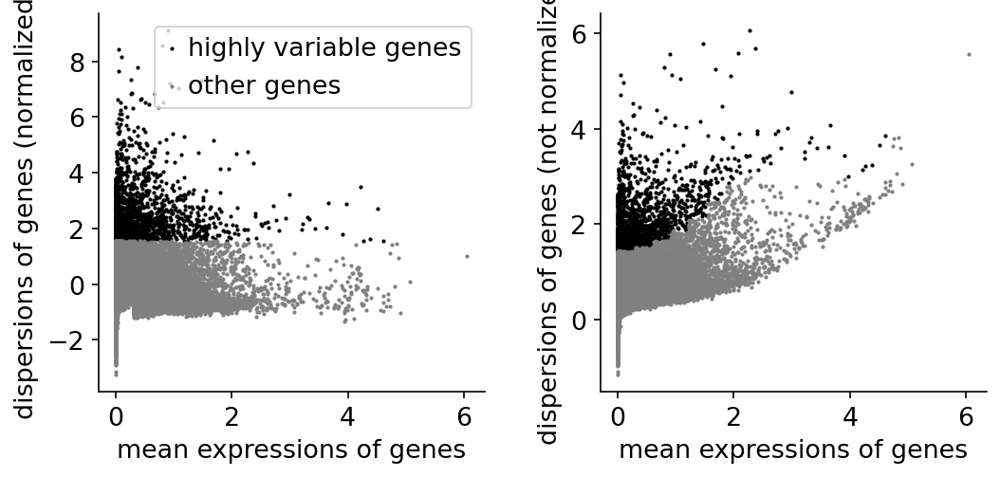

In [26]:
sc.pl.highly_variable_genes(adata)

In [27]:
sc.tl.pca(adata)

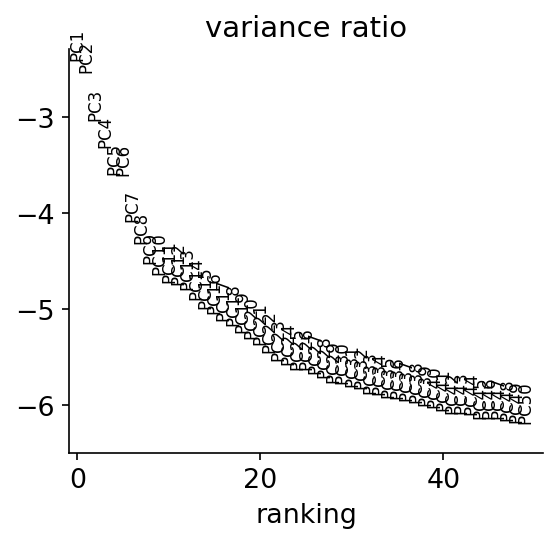

In [28]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

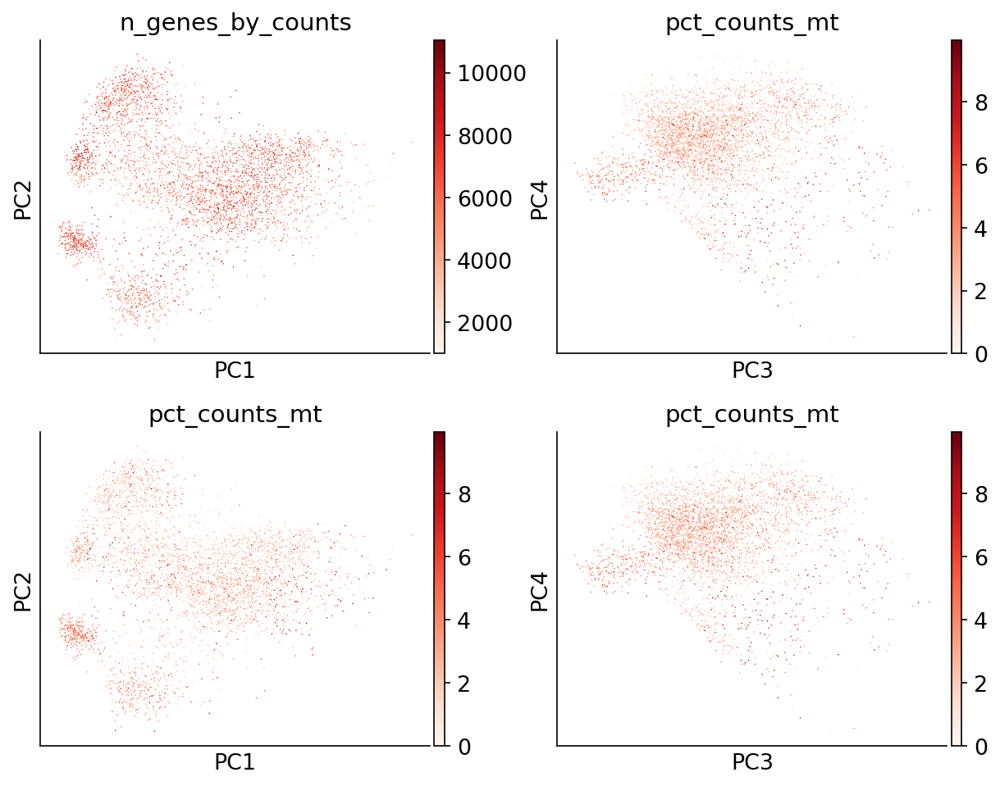

In [29]:
sc.pl.pca(
    adata,
    color=["n_genes_by_counts", "pct_counts_mt", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

In [30]:
# adata.obs.head()

In [31]:
sc.pp.neighbors(adata, random_state=42)

In [32]:
sc.tl.umap(adata)

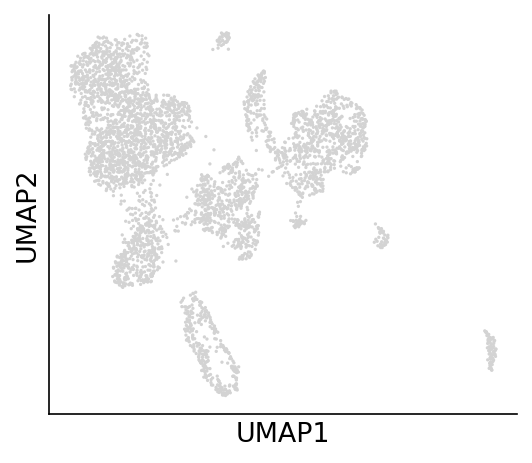

In [33]:
sc.pl.umap(
    adata,
    # Setting a smaller point size to get prevent overlap
    size=10,
)

In [34]:
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)

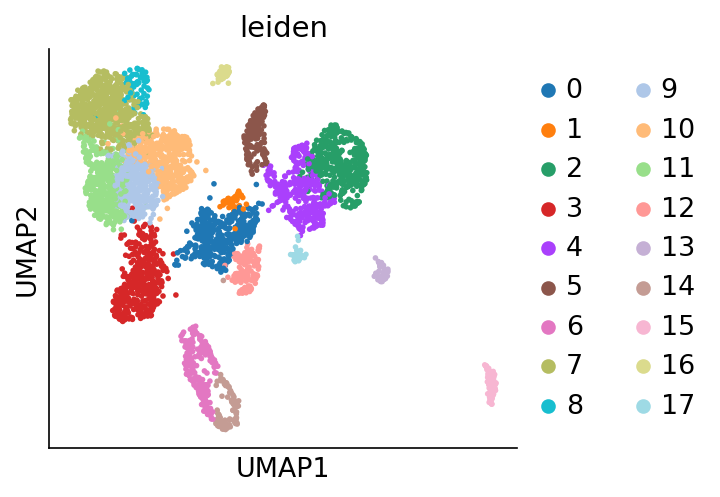

In [35]:
sc.pl.umap(adata, color=["leiden"])

In [36]:
sc.tl.draw_graph(adata)

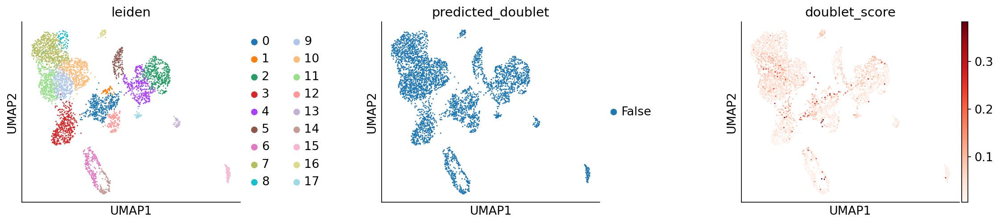

In [37]:
sc.pl.umap(
    adata,
    color=["leiden", "predicted_doublet", "doublet_score"],
    # increase horizontal space between panels
    wspace=0.5,
    size=8,
)

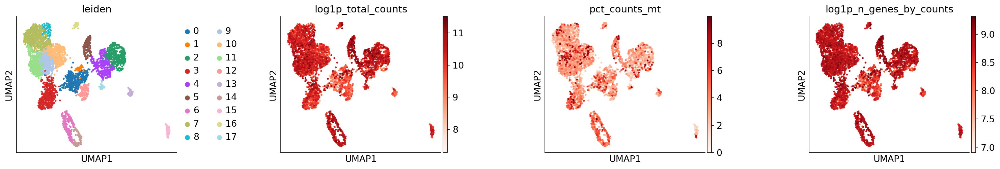

In [38]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=8,
)

In [39]:
for res in [0.1, 0.5, 1.0, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

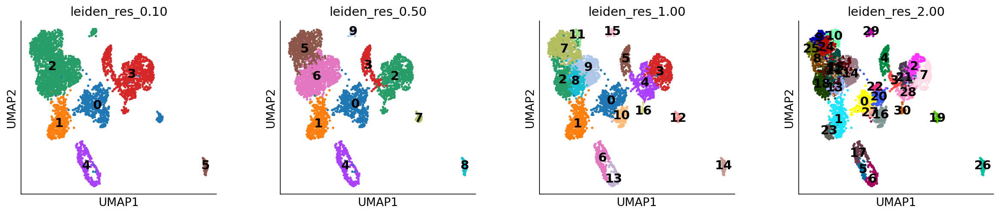

In [40]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.10", "leiden_res_0.50", "leiden_res_1.00", "leiden_res_2.00"],
    legend_loc="on data",
)

In [41]:
# check marker expression for each cluster
marker_genes = {'AM': ['VTCN1', 'ISL1'],
 'Endoderm': ['FOXA2', 'GATA6', 'SOX17'],
 'PSC-like': ['POU5F1', 'SOX17', 'NANOG', 'NANOS3', 'TFAP2C'],
 'PSC-Ect': ['L1TD1', 'TERF1', 'DNMT3B', 'SEMA6A', 'NES'],
 'TB-like': ['KRT8', 'KRT18', 'CDH1', 'TFAP2A', 'PTN', 'GATA3'],
 'YSE': ['APOA1', 'APOA2', 'APOE', 'AFP', 'KRT19'],
 'Ect-like': ['KCNQ1OT1', 'SNHG14', 'DST', 'PRTG', 'TBX3'],
 'NE-like': ['SFRP2', 'GPC3', 'PAX6', 'FZD3', 'SOX2'],
 'NC': ['PLP1', 'FOXD3', 'PAX3', 'SOX10', 'SOX11'],
 'Mes-like': ['PITX1', 'TMEM88', 'HAND1', 'BMP4', 'ACTC1', 'ISL1'],
 'Mes-PS': ['TBXT', 'MESP1', 'EOMES', 'PDGFRA'],
 'CM-like': ['NKX2-5', 'MSX1', 'MSX2', 'MDK', 'ID3'],
 'Fibro': ['ANGPT1', 'HGF', 'FBN1', 'ITGA1', 'MME', 'PDGFRA', 'ACTA2'],
 'EC': ['KDR', 'CDH5', 'PECAM1', 'VWF', 'CD34'],
 'HPC': ['RUNX1', 'IL5RA', 'ITGB2', 'CEBPB', 'IFI6'],
 'Ery': ['HBZ', 'HBA1', 'HBA2', 'GYPA', 'TFRC'],
 'Mk': ['PF4', 'PPBP', 'GP9', 'PLEK', 'THBS1'],
 'EMP': ['GYPB', 'GIHCG', 'HDC', 'ARHGDIB', 'GMFG'],
 'MP-1': ['PRG2', 'EPX', 'PRSS57', 'MS4A3'],
 'MP-2': ['LMO4', 'GATA2', 'PTPRC', 'KCNK17', 'FCER1G'],
 'Mono': ['CD14', 'S100A9', 'S100B']}

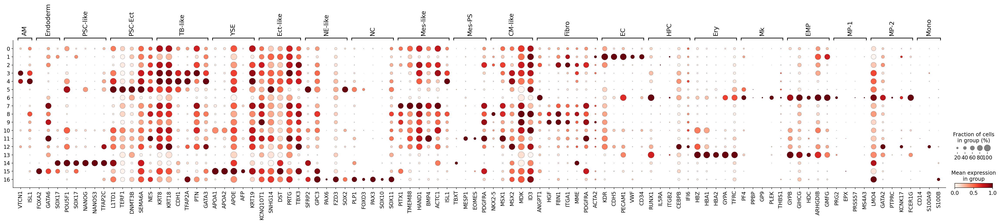

In [42]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_1.00", standard_scale="var")

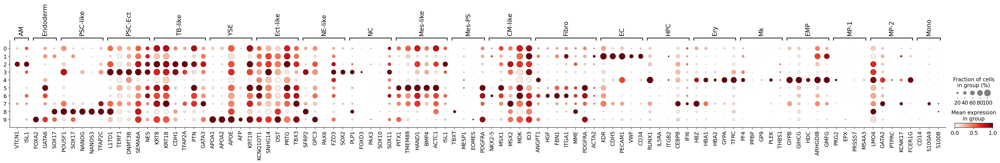

In [43]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.50", standard_scale="var")

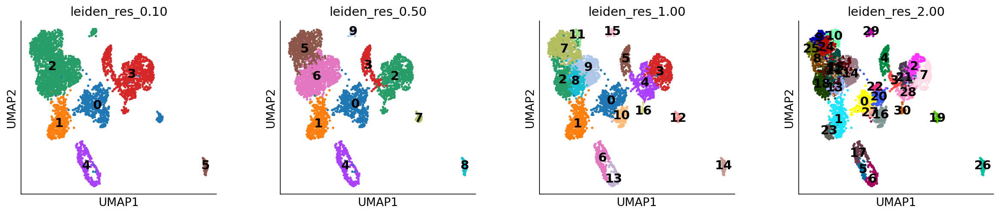

In [44]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.10", "leiden_res_0.50", "leiden_res_1.00", "leiden_res_2.00"],
    legend_loc="on data",
)

In [45]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.50", method="wilcoxon")

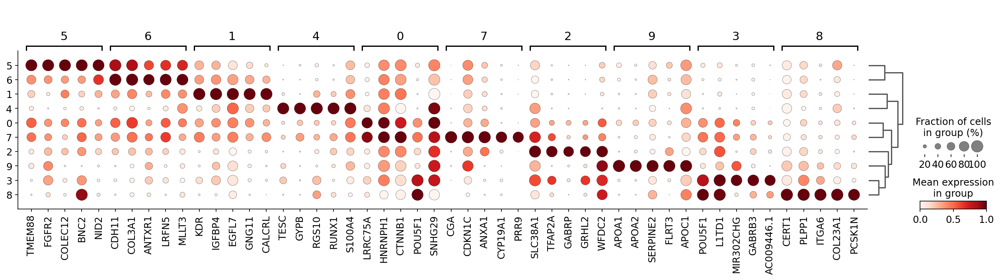

In [46]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res_0.50", standard_scale="var", n_genes=5
)

In [47]:
# sc.get.rank_genes_groups_df(adata, group="7").head(5)


In [48]:
# Using following query to comfirm cell type with chatGPT-4o
print("I am analysising late stage of human embryonic organoids hematopoiesis single cell data.")
gn = 8
print("based on the gene expression umap, there are %s groups in my data" % (gn))
print("i want to find the group like 'Ectoderm', 'Mesoderm', 'PSC-like', 'TB-like', 'Endoderm', 'Ect-like', 'Fibro', 'PSC-Ect', 'Mes-like', 'PSC-like', 'TB-like', 'CM-like', 'YSE', 'Endo', 'NC', 'NE-like', etc.")
print("please help me identify or find the cell types based on the following group id and its most differed expressed gene (rank by rank genes scores):")      
for i in range(gn):
    print("group %s: %s" % (i, ','.join(sc.get.rank_genes_groups_df(adata, group=str(i)).head(15)['names'].values.tolist())))

I am analysising late stage of human embryonic organoids hematopoiesis single cell data.
based on the gene expression umap, there are 8 groups in my data
i want to find the group like 'Ectoderm', 'Mesoderm', 'PSC-like', 'TB-like', 'Endoderm', 'Ect-like', 'Fibro', 'PSC-Ect', 'Mes-like', 'PSC-like', 'TB-like', 'CM-like', 'YSE', 'Endo', 'NC', 'NE-like', etc.
please help me identify or find the cell types based on the following group id and its most differed expressed gene (rank by rank genes scores):
group 0: LRRC75A,HNRNPH1,CTNNB1,POU5F1,SNHG29,XACT,GAPDH,EIF5A,C1orf56,EEF1G,L1TD1,TUBB2B,CALR,HBG2,CKS2
group 1: KDR,IGFBP4,EGFL7,GNG11,CALCRL,PLVAP,JAM3,ERG,PECAM1,LIMCH1,FLI1,ECSCR,FLT1,CDH5,RAMP2
group 2: SLC38A1,TFAP2A,GABRP,GRHL2,WFDC2,CDH1,CCBE1,KIAA1217,SPINT2,PATJ,TPM1,IGFBP7,TANC2,EPCAM,PRSS12
group 3: POU5F1,L1TD1,MIR302CHG,GABRB3,AC009446.1,PLAAT3,NMRK2,GRID2,AL591742.2,SLC7A3,AL138720.1,ESRG,UGP2,PODXL,AC007326.5
group 4: TESC,GYPB,RGS10,RUNX1,S100A4,GYPE,SPN,ITGA2B,LYL1,MYL4,PRK

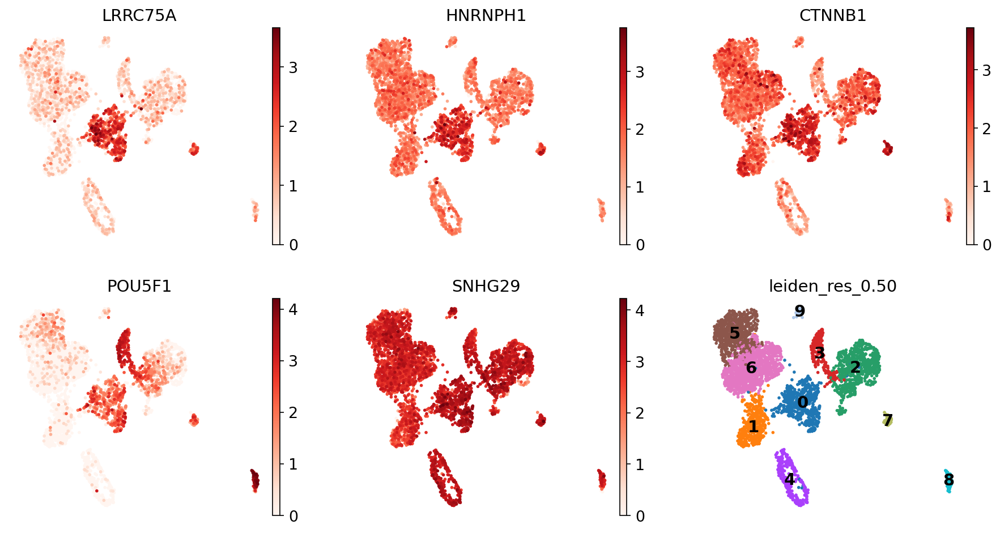

In [49]:
dc_cluster_genes = sc.get.rank_genes_groups_df(adata, group="0").head(5)["names"]
sc.pl.umap(
    adata,
    color=[*dc_cluster_genes, "leiden_res_0.50"],
    legend_loc="on data",
    frameon=False,
    ncols=3,
)

In [50]:
# check marker expression for each cluster
marker_genes = {'AM': ['VTCN1', 'ISL1'],
 'Endoderm': ['FOXA2', 'GATA6', 'SOX17'],
 'PSC-like': ['POU5F1', 'SOX17', 'NANOG', 'NANOS3', 'TFAP2C'],
 'PSC-Ect': ['L1TD1', 'TERF1', 'DNMT3B', 'SEMA6A', 'NES'],
 'TB-like': ['KRT8', 'KRT18', 'CDH1', 'TFAP2A', 'PTN', 'GATA3'],
 'YSE': ['APOA1', 'APOA2', 'APOE', 'AFP', 'KRT19'],
 'Ect-like': ['KCNQ1OT1', 'SNHG14', 'DST', 'PRTG', 'TBX3'],
 'NE-like': ['SFRP2', 'GPC3', 'PAX6', 'FZD3', 'SOX2'],
 'NC': ['PLP1', 'FOXD3', 'PAX3', 'SOX10', 'SOX11'],
 'Mes-like': ['PITX1', 'TMEM88', 'HAND1', 'BMP4', 'ACTC1', 'ISL1'],
 'Mes-PS': ['TBXT', 'MESP1', 'EOMES', 'PDGFRA'],
 'CM-like': ['NKX2-5', 'MSX1', 'MSX2', 'MDK', 'ID3'],
 'Fibro': ['ANGPT1', 'HGF', 'FBN1', 'ITGA1', 'MME', 'PDGFRA', 'ACTA2'],
 'EC': ['KDR', 'CDH5', 'PECAM1', 'VWF', 'CD34'],
 'HPC': ['RUNX1', 'IL5RA', 'ITGB2', 'CEBPB', 'IFI6'],
 'Ery': ['HBZ', 'HBA1', 'HBA2', 'GYPA', 'TFRC'],
 'Mk': ['PF4', 'PPBP', 'GP9', 'PLEK', 'THBS1'],
 'EMP': ['GYPB', 'GIHCG', 'HDC', 'ARHGDIB', 'GMFG'],
 'MP-1': ['PRG2', 'EPX', 'PRSS57', 'MS4A3'],
 'MP-2': ['LMO4', 'GATA2', 'PTPRC', 'KCNK17', 'FCER1G'],
 'Mono': ['CD14', 'S100A9', 'S100B']}

In [51]:
adata.obs["cell_type"] = adata.obs["leiden_res_0.50"].map(
    {
        "0": "CM-like",
        "1": "EC",
        "2": "Ect-like",
        "3": "PSC-Ect",
        "4": "EMP",
        "5": "Mes-like",
        "6": "Fibro",
        "7": "TB-like",
        "8": "PSC-like",
        "9": "Endoderm",
    }
)
# Mesoderm (Primitive Streak/Cardiac)

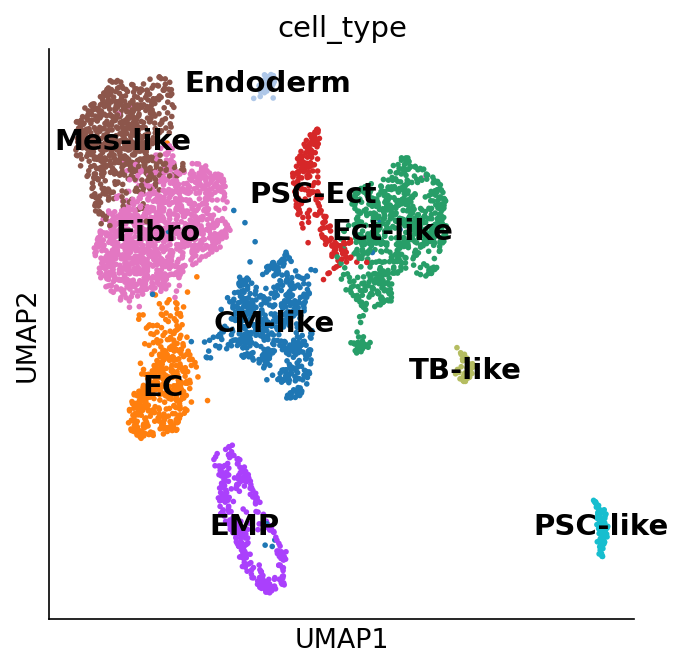

In [52]:
fig, ax = plt.subplots(figsize=(5, 5))
sc.pl.umap(adata, color=["cell_type"], legend_loc="on data", ax=ax)

Text(0.5, 1.0, 'D8 dataset')

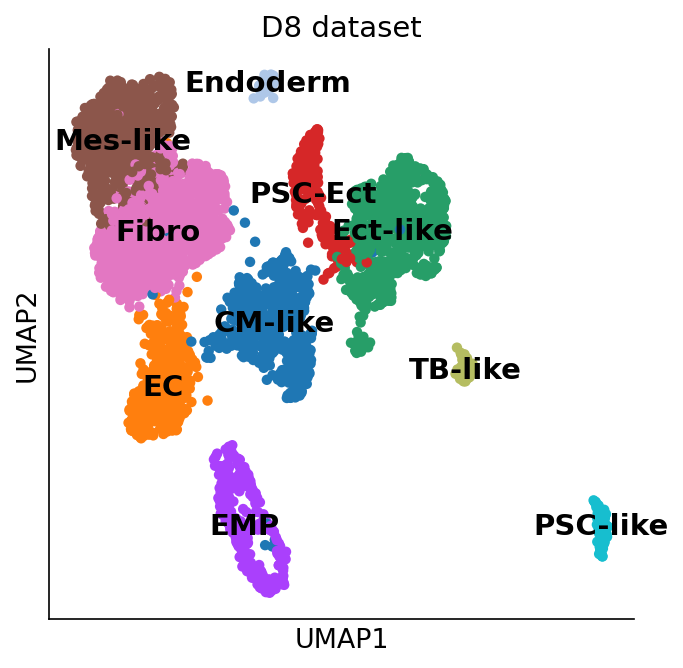

In [53]:
fig, ax = plt.subplots(figsize=(5, 5))
ax = sc.pl.umap(adata, color=["cell_type"], legend_loc="on data", show=False, ax=ax, size=100)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title('D8 dataset')

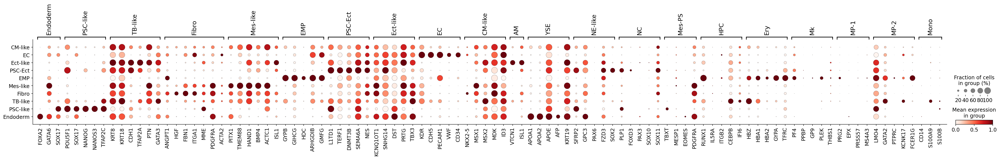

In [54]:
n_marker_genes = {i: marker_genes[i] for i in ["CM-like", "EC", "Ect-like", "PSC-Ect", "EMP", "Mes-like", "Fibro", "TB-like", "PSC-like",  "Endoderm"][::-1]}
n_marker_genes = n_marker_genes | {i: marker_genes[i] for i in marker_genes}

sc.pl.dotplot(adata, n_marker_genes, groupby="cell_type", standard_scale="var")

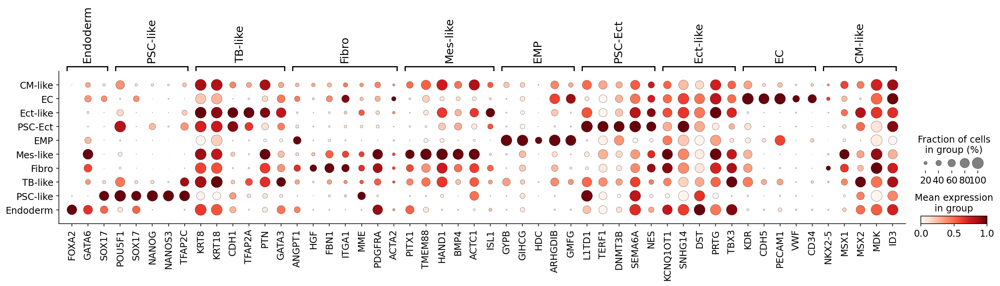

In [55]:
# n_marker_genes = {i: marker_genes[i] for i in ['Mes-like', 'TB-like', 'Fibro', 'PSC-Ect', 'PSC-like', 'EC', 'Mes-PS', 'Endoderm'][::-1]}
n_marker_genes = {i: marker_genes[i] for i in ["CM-like", "EC", "Ect-like", "PSC-Ect", "EMP", "Mes-like", "Fibro", "TB-like", "PSC-like",  "Endoderm"][::-1]}
# n_marker_genes = n_marker_genes | {i: marker_genes[i] for i in marker_genes}

sc.pl.dotplot(adata, n_marker_genes, groupby="cell_type", standard_scale="var")

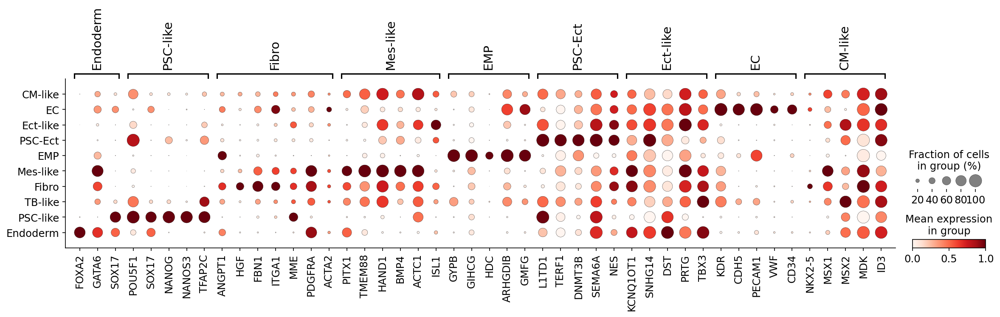

In [56]:
# n_marker_genes = {i: marker_genes[i] for i in ['Mes-like', 'TB-like', 'Fibro', 'PSC-Ect', 'PSC-like', 'EC', 'Mes-PS', 'Endoderm'][::-1]}
n_marker_genes = {i: marker_genes[i] for i in ["CM-like", "EC", "Ect-like", "PSC-Ect", "EMP", "Mes-like", "Fibro", "PSC-like",  "Endoderm"][::-1]}
# n_marker_genes = n_marker_genes | {i: marker_genes[i] for i in marker_genes}

sc.pl.dotplot(adata, n_marker_genes, groupby="cell_type", standard_scale="var")

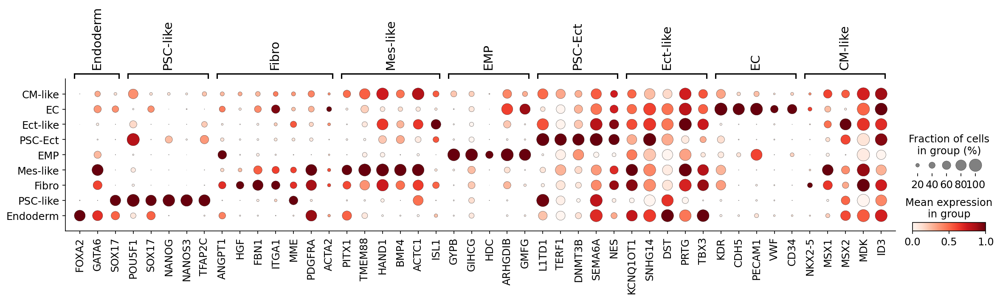

In [57]:
adata[adata.obs['cell_type'] != 'TB-like']

# n_marker_genes = {i: marker_genes[i] for i in ['Mes-like', 'TB-like', 'Fibro', 'PSC-Ect', 'PSC-like', 'EC', 'Mes-PS', 'Endoderm'][::-1]}
n_marker_genes = {i: marker_genes[i] for i in ["CM-like", "EC", "Ect-like", "PSC-Ect", "EMP", "Mes-like", "Fibro", "PSC-like",  "Endoderm"][::-1]}
# n_marker_genes = n_marker_genes | {i: marker_genes[i] for i in marker_genes}

sc.pl.dotplot(adata[adata.obs['cell_type'] != 'TB-like'], n_marker_genes, groupby="cell_type", standard_scale="var")

In [58]:
marker_genes

{'AM': ['VTCN1', 'ISL1'],
 'Endoderm': ['FOXA2', 'GATA6', 'SOX17'],
 'PSC-like': ['POU5F1', 'SOX17', 'NANOG', 'NANOS3', 'TFAP2C'],
 'PSC-Ect': ['L1TD1', 'TERF1', 'DNMT3B', 'SEMA6A', 'NES'],
 'TB-like': ['KRT8', 'KRT18', 'CDH1', 'TFAP2A', 'PTN', 'GATA3'],
 'YSE': ['APOA1', 'APOA2', 'APOE', 'AFP', 'KRT19'],
 'Ect-like': ['KCNQ1OT1', 'SNHG14', 'DST', 'PRTG', 'TBX3'],
 'NE-like': ['SFRP2', 'GPC3', 'PAX6', 'FZD3', 'SOX2'],
 'NC': ['PLP1', 'FOXD3', 'PAX3', 'SOX10', 'SOX11'],
 'Mes-like': ['PITX1', 'TMEM88', 'HAND1', 'BMP4', 'ACTC1', 'ISL1'],
 'Mes-PS': ['TBXT', 'MESP1', 'EOMES', 'PDGFRA'],
 'CM-like': ['NKX2-5', 'MSX1', 'MSX2', 'MDK', 'ID3'],
 'Fibro': ['ANGPT1', 'HGF', 'FBN1', 'ITGA1', 'MME', 'PDGFRA', 'ACTA2'],
 'EC': ['KDR', 'CDH5', 'PECAM1', 'VWF', 'CD34'],
 'HPC': ['RUNX1', 'IL5RA', 'ITGB2', 'CEBPB', 'IFI6'],
 'Ery': ['HBZ', 'HBA1', 'HBA2', 'GYPA', 'TFRC'],
 'Mk': ['PF4', 'PPBP', 'GP9', 'PLEK', 'THBS1'],
 'EMP': ['GYPB', 'GIHCG', 'HDC', 'ARHGDIB', 'GMFG'],
 'MP-1': ['PRG2', 'EPX', 'PRSS

In [59]:
# save result
results_file = filedir + "/rst_d8.h5ad"
adata.write(results_file, compression="gzip")

In [60]:
adata.obs['cell_type'].to_csv(filedir + "/cell_type_0310.csv")

In [9]:
# reload data
results_file = filedir + "/rst_d8.h5ad"
adata = ad.read_h5ad(results_file)

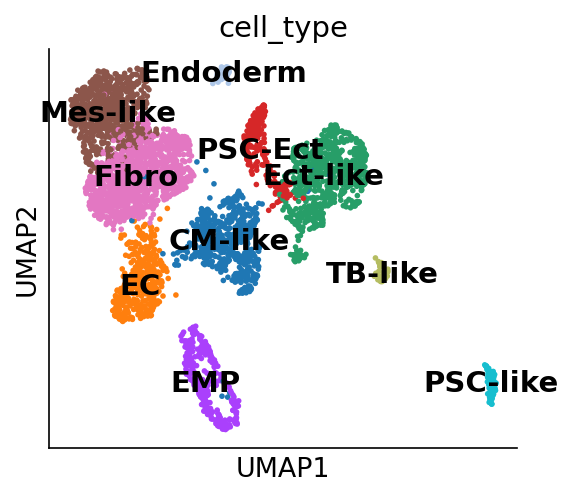

In [10]:
sc.pl.umap(adata, color=["cell_type"], legend_loc="on data")

In [11]:
# import scvelo as scv
# _loom_f = "/autofs/bal31/jhsu/home/projects/sc/data/hemo_paper_larry/larry-maester-d7/larry_barcode/sc/2_bam/velocyto/2_bam.loom"
# ldata = sc.read(_loom_f, cache=True)
# # adata = scv.utils.merge(_adata, ldata)

In [12]:
# load MAESTER data
# run preprocess/2_run_snp.sh and preprocess/3_run_mquad.sh to get informative snp
# run MAESTER_get_clone_D4 to further filter snp and get clone information
maester_p = "/autofs/bal31/jhsu/home/projects/sc/data/hemo_paper_larry/larry-maester-d4/maester/tree_out/"
maester_p = "/home/jhsu/project/sc/hemo_paper_larry/d8/maester/tree_out/"
maester_p = "/home/jhsu/projects/sc/all_backup/hemo_paper_larry/d8/maester/tree_out/"

maester_c_f = maester_p + "clone.csv"
maester_clone_df = pd.read_csv(maester_c_f, header=0)
maester_clone_df.barcode = maester_clone_df.barcode.apply(lambda x: x+"-1")
print(maester_clone_df.head())
maester_clone_df.clone.value_counts()

af_o_df = pd.read_csv(maester_p + "clone_af.csv", sep="\t", header=0,  index_col=0)
af_m = af_o_df.to_numpy(dtype=np.float64)

snp_id = ["%s%s>%s" % (tuple(i.split("_")[1:])) for i in af_o_df.index]
print(len(snp_id))

af_df = pd.DataFrame(af_m.T, columns=snp_id, dtype=np.float64)
af_columns = af_df.columns
print(len(af_columns))

af_columns_o = sorted(af_columns, key=lambda x:int(x[:-3]))
af_df = af_df[af_columns_o]
af_df['barcode'] = af_o_df.columns + "-1"
af_df.head(3)

              barcode     clone
0  AAACCCACAAGACAAT-1  clone_B0
1  AAACCCAGTACAGTTC-1  clone_B2
2  AAACGAACAAGTCCCG-1  clone_B0
3  AAACGAACAATTCGTG-1  clone_B1
4  AAACGCTCAGCTGAGA-1  clone_B1
29
29


,1123C>A,1352C>T,1380G>A,1389G>A,1525C>A,1526T>A,1868G>A,2349G>A,2502C>A,2571G>A,...,7635T>C,8177G>A,8628C>T,8829C>T,12090T>G,12115C>T,15016C>A,15070C>A,15374G>A,barcode
0,0.091371,0.0,0.032258,0.0,0.007092,0.014184,0.020436,0.004577,0.023622,0.000000,...,0.0,0.00000,0.000000,0.0,0.003717,0.0,0.081545,0.013825,0.0,AAACCCACAAGACAAT-1
1,0.058824,0.0,0.101796,0.0,0.034783,0.034783,0.001511,0.004525,0.043902,0.045455,...,0.0,0.00216,0.000000,0.0,0.000000,0.0,0.035398,0.000000,0.0,AAACCCAGTACAGTTC-1
2,0.054545,0.0,0.051282,0.0,0.035714,0.035714,0.005277,0.000000,0.031008,0.000000,...,0.0,0.00000,0.004608,0.0,0.000000,0.0,0.000000,0.000000,0.0,AAACGAACAAGTCCCG-1


In [13]:
c_o = sorted(maester_clone_df['clone'].unique(), key=lambda x:int(x[7:]))
print(c_o)
maester_clone_df.head()

['clone_B0', 'clone_B1', 'clone_B2', 'clone_B3']


,barcode,clone
0,AAACCCACAAGACAAT-1,clone_B0
1,AAACCCAGTACAGTTC-1,clone_B2
2,AAACGAACAAGTCCCG-1,clone_B0
3,AAACGAACAATTCGTG-1,clone_B1
4,AAACGCTCAGCTGAGA-1,clone_B1


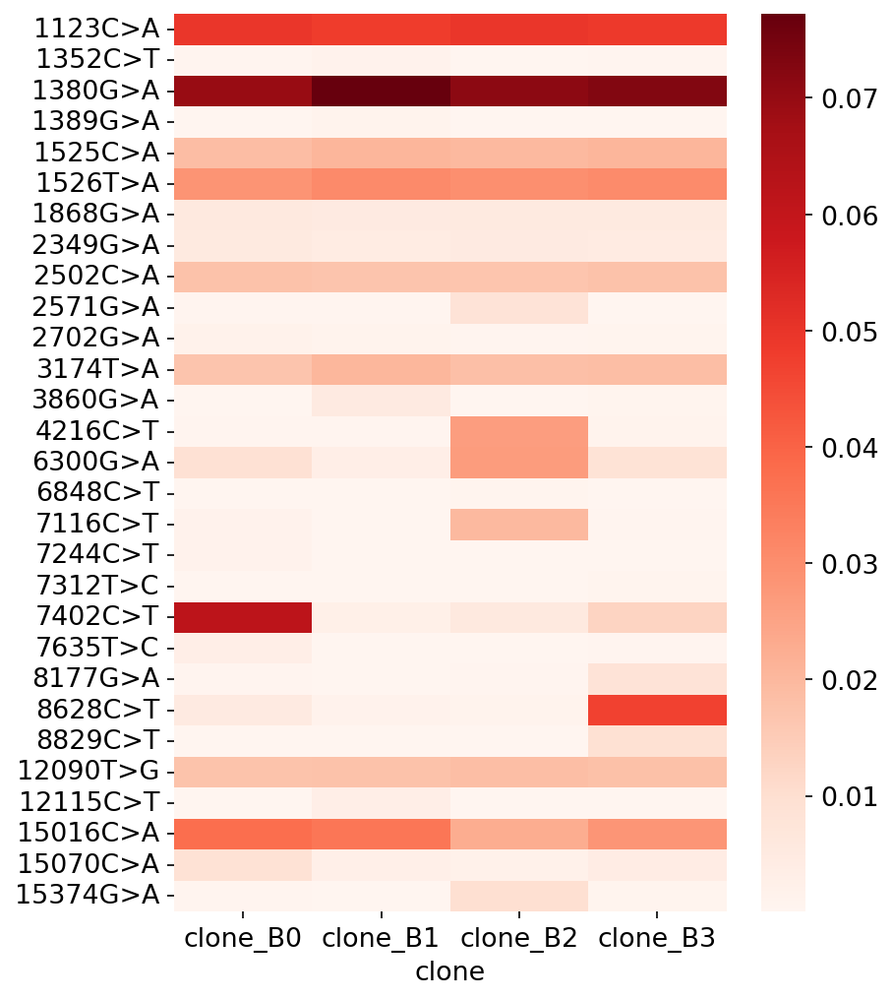

In [14]:
tmp_merge_o = pd.merge(af_df, maester_clone_df, how='inner')
tar_merge = tmp_merge_o.groupby('clone').agg({i: 'mean' for i in af_columns})
tar_merge = tar_merge[af_columns_o]
tar_merge = tar_merge.reindex(c_o)

import seaborn as sns
plt.figure(figsize = (6,8))
ax = sns.heatmap(tar_merge.T, cmap="Reds", xticklabels=True, yticklabels=True)

In [15]:
tmp_merge_o.head()

,1123C>A,1352C>T,1380G>A,1389G>A,1525C>A,1526T>A,1868G>A,2349G>A,2502C>A,2571G>A,...,8177G>A,8628C>T,8829C>T,12090T>G,12115C>T,15016C>A,15070C>A,15374G>A,barcode,clone
0,0.091371,0.0,0.032258,0.0,0.007092,0.014184,0.020436,0.004577,0.023622,0.000000,...,0.00000,0.000000,0.0,0.003717,0.0,0.081545,0.013825,0.0,AAACCCACAAGACAAT-1,clone_B0
1,0.058824,0.0,0.101796,0.0,0.034783,0.034783,0.001511,0.004525,0.043902,0.045455,...,0.00216,0.000000,0.0,0.000000,0.0,0.035398,0.000000,0.0,AAACCCAGTACAGTTC-1,clone_B2
2,0.054545,0.0,0.051282,0.0,0.035714,0.035714,0.005277,0.000000,0.031008,0.000000,...,0.00000,0.004608,0.0,0.000000,0.0,0.000000,0.000000,0.0,AAACGAACAAGTCCCG-1,clone_B0
3,0.022222,0.0,0.086207,0.0,0.045872,0.055556,0.004334,0.003352,0.002049,0.000000,...,0.00000,0.000000,0.0,0.008929,0.0,0.031250,0.000000,0.0,AAACGAACAATTCGTG-1,clone_B1
4,0.055556,0.0,0.041916,0.0,0.007692,0.007692,0.014939,0.004412,0.038168,0.000000,...,0.00000,0.000000,0.0,0.019608,0.0,0.007605,0.000000,0.0,AAACGCTCAGCTGAGA-1,clone_B1


In [16]:
mer_df = pd.merge(adata.obs, tmp_merge_o, how='left', left_index=True, right_on='barcode')
mer_df.shape

(4137, 57)

In [17]:
# filter cell without maester label
_adata = adata[mer_df.clone.notna()]
_adata.obs = pd.merge(_adata.obs, tmp_merge_o, how='left', left_index=True, right_on='barcode')
_adata

/home/jhsu/miniconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:750: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 4, 5]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


AnnData object with n_obs × n_vars = 3736 × 28254
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'leiden_res_0.10', 'leiden_res_0.50', 'leiden_res_1.00', 'leiden_res_2.00', 'cell_type', '1123C>A', '1352C>T', '1380G>A', '1389G>A', '1525C>A', '1526T>A', '1868G>A', '2349G>A', '2502C>A', '2571G>A', '2702G>A', '3174T>A', '3860G>A', '4216C>T', '6300G>A', '6848C>T', '7116C>T', '7244C>T', '7312T>C', '7402C>T', '7635T>C', '8177G>A', '8628C>T', '8829C>T', '12090T>G', '12115C>T', '15016C>A', '15070C>A', '15374G>A', 'barcode', 'clone'
    var: 'gene_ids', 'feature_types', 'genome', 'mt'

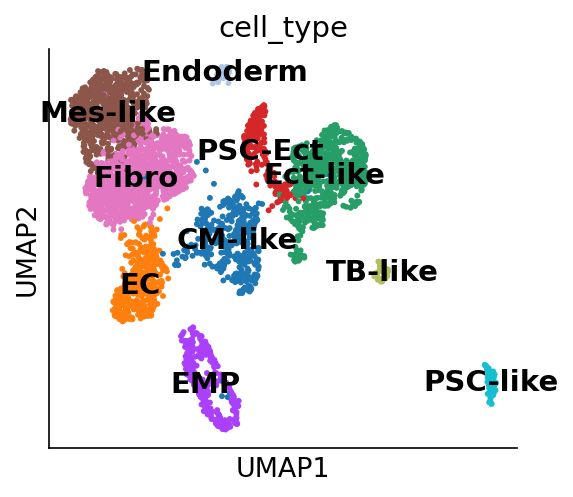

In [18]:
# sc.pl.umap(adata, color=["cell_type"])
sc.pl.umap(_adata, color=["cell_type"], legend_loc="on data")

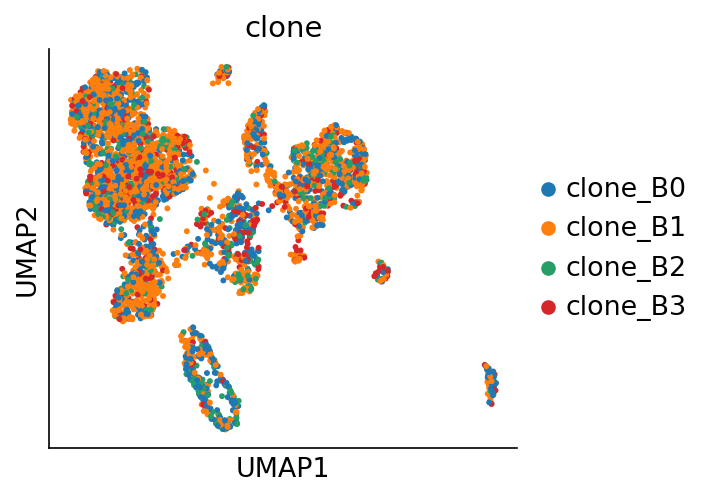

In [81]:
sc.pl.umap(_adata, color=["clone"])

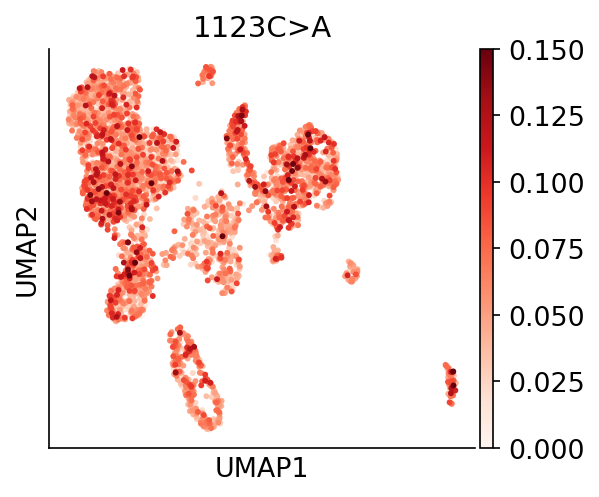

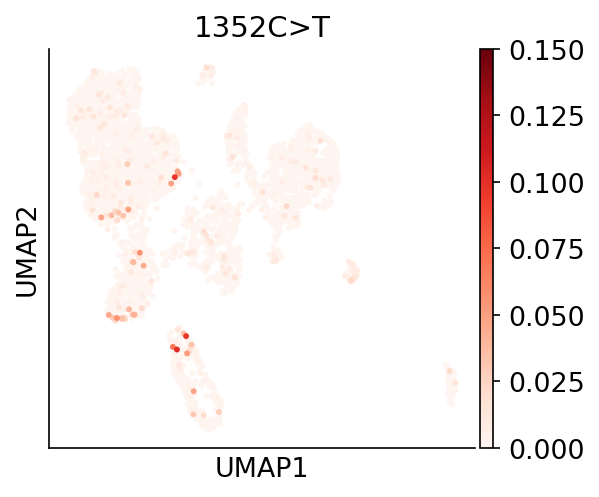

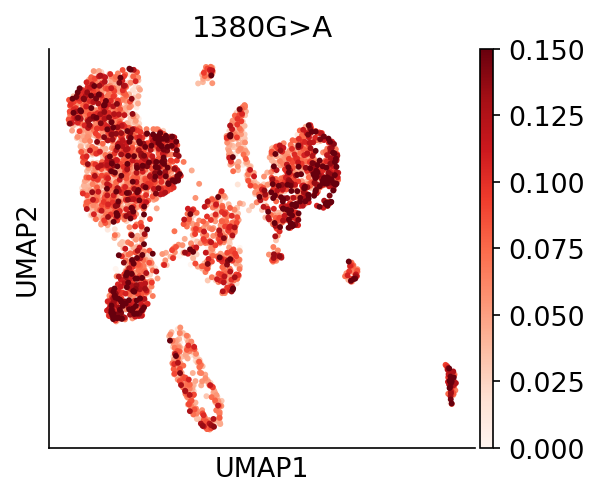

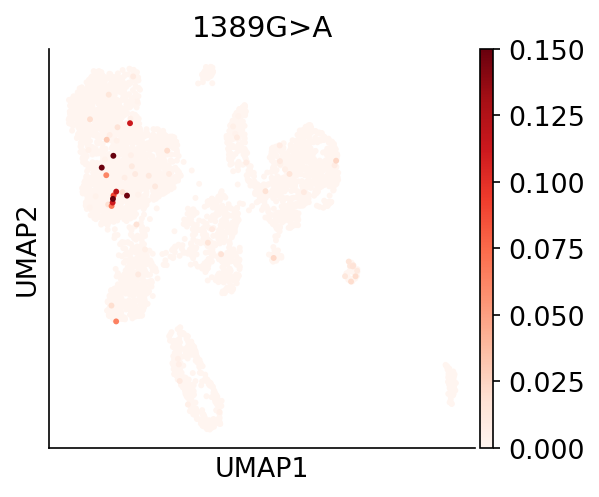

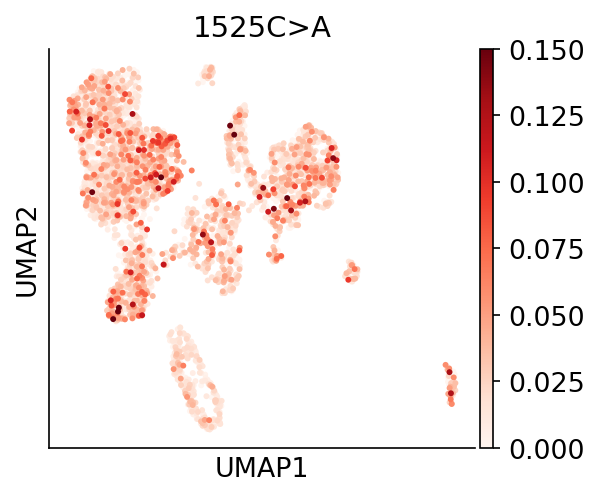

...

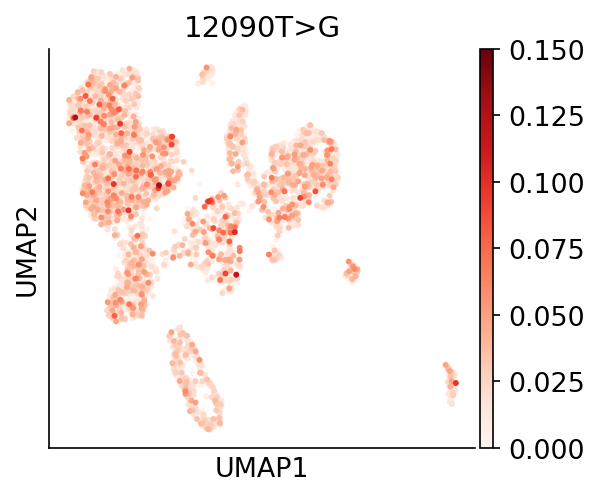

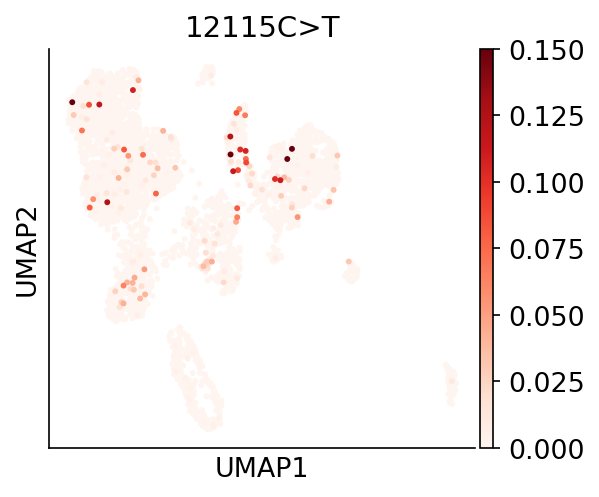

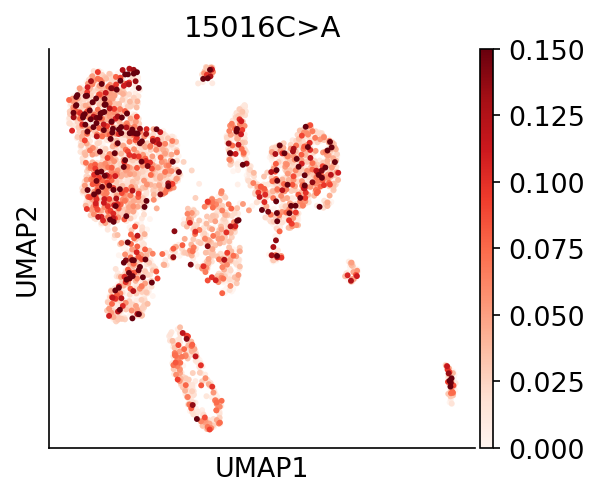

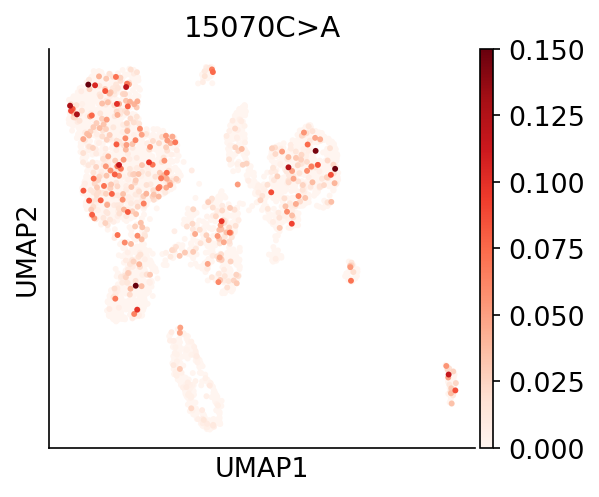

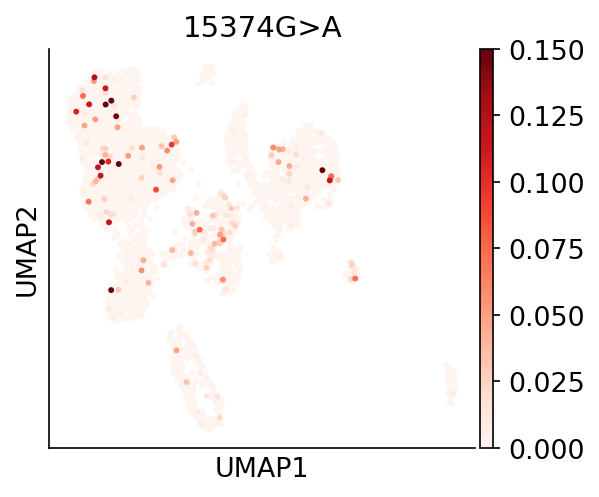

In [82]:
for snp_id in af_df.columns[:-1]:
    sc.pl.umap(_adata, color=[snp_id], vmax=0.15)

Computed cell-cell distance. (in 0:00:36.261243s)
3736


[Text(1, 0.5, 'EC'),
 Text(1, 1.5, 'Fibro'),
 Text(1, 2.5, 'Mes-like'),
 Text(1, 3.5, 'Ect-like'),
 Text(1, 4.5, 'PSC-Ect'),
 Text(1, 5.5, 'CM-like'),
 Text(1, 6.5, 'EMP'),
 Text(1, 7.5, 'TB-like'),
 Text(1, 8.5, 'Endoderm'),
 Text(1, 9.5, 'PSC-like')]

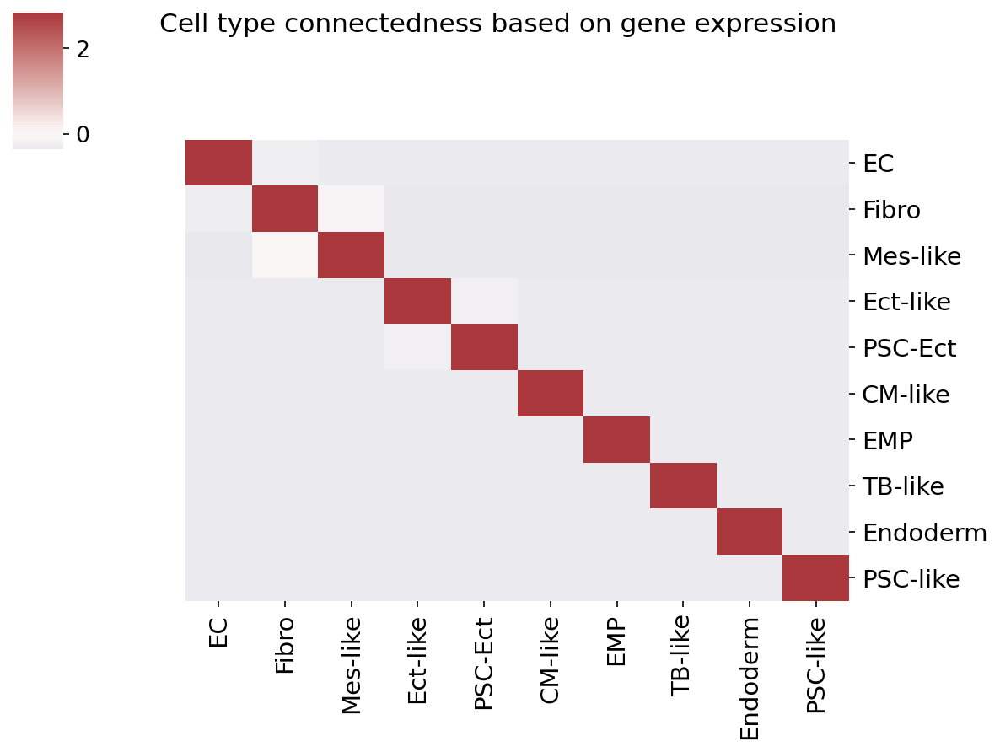

In [72]:
#cell cell distance

import multiprocessing as mp
from datetime import datetime


def get_cell_dis_dev(mat, v_prior, i, j):
    if i < j:
        # return (abs(mat[i, :] - mat[j, :]) * v_prior).sum()
        return (abs(mat[i, :] - mat[j, :]) * 1).sum()
    else:
        return 0

def get_distance(mat, n_core=64):
    cell_n, _v_n = mat.shape

    v_mean_af = mat.mean(0)
    v_prior = 1 - v_mean_af

    p = mp.Pool(n_core)
    results = p.starmap(get_cell_dis_dev, ((mat, v_prior, i, j) for i in range(cell_n) for j in range(cell_n) ))
    results = np.array(results).reshape(cell_n, cell_n)
#     # assign all element
    i_lower = np.tril_indices(cell_n, -1)
    results[i_lower] = results.T[i_lower]

    p.close()
    p.join()
    return results

# get cell-cell distance
start_time = datetime.now()
_af_df = _adata.X[:, _adata.var['highly_variable']].todense()
_tmp_tar_label = _adata.obs['cell_type']

tar_m = np.array(_af_df)
ps_map = get_distance(tar_m)
end_time = datetime.now()

print('Computed cell-cell distance. (in {}s)'.format(end_time - start_time))

import seaborn as sns
# connectness
import networkx as nx


def from_dist_to_graph(d, k_param=30, return_nx_graph=True):
    if not isinstance(d, np.ndarray):
        d = d.values

    n_cells = d.shape[0]
    knn_mat = np.zeros((n_cells, k_param), dtype=int)
    knd_mat = np.zeros((n_cells, k_param))
    print(n_cells)
    # Find k nearest neighbors for each cell
    for i in range(n_cells):
        knn_indices = np.argsort(d[i, :])[:k_param]
        knn_mat[i, :] = knn_indices
        knd_mat[i, :] = d[i, knn_indices]

    nn_dist = knn_mat[:, :k_param]
    knn = nn_dist
    
    # Compute mutual k-nearest neighbors (MNN)
    knn2 = []
    for i in range(knn.shape[0]):
        xx = np.apply_along_axis(lambda x: i in x, 1, knn[knn[i, 1:], :])
        if np.sum(xx) > 0:
            temp_knn = np.concatenate(([knn[i, 0]], knn[i, 1:][xx]))
            temp_el = [[temp_knn[0], neighbor] for neighbor in temp_knn[1:]]
        # else:
        #     temp_el = [[knn[i, 0], knn[i, 1]]]
            knn2.extend(temp_el)

    el = np.array(knn2)
    graph = nx.Graph()
    graph.add_nodes_from(range(n_cells))

    graph.add_edges_from(el)

    mutual_knn = nx.to_numpy_array(graph, nodelist=range(n_cells))
    
    # mutual_knn = nx.to_numpy_array(graph, nodelist=sorted(graph.nodes()))

    # mutual_knn = nx.to_numpy_array(graph)
    if return_nx_graph:
        return mutual_knn, graph
    else:
        return mutual_knn, _

def aggregate_distance_matrix_by_class(X, class_df, cls_n="clone"):
    # Get unique classes
    classes = class_df.iloc[:, 0].unique()
    # Initialize a dictionary to store the results
    results = {}
    # Iterate over each class as the target class
    for target_class in classes:
        # Get the nodes that belong to the target class
        # print(target_class)
        target_nodes = class_df[class_df[cls_n] == target_class].index
        # print(target_nodes)
        # Initialize a dictionary to count connections to each class
        connection_counts = {cls: 0 for cls in classes}
        total_connections = 0
        # Iterate over each node in the target class
        for node in target_nodes:
            # Get the connections of the current node
            connections = X[node, :]
            # Count connections to each class
            for connected_node in np.where(connections == 1)[0]:
                connected_class = class_df.loc[connected_node, cls_n]
                # print(target_class, connected_node, connected_class)
                connection_counts[connected_class] += 1
                total_connections += 1
        # Calculate the proportion of connections to each class
        proportions = {cls: (count / total_connections * 100 if total_connections > 0 else 0) for cls, count in connection_counts.items()}
        # Store the result for the target class
        results[target_class] = proportions
    # Convert the result dictionary to a DataFrame for a better presentation
    results_df = pd.DataFrame(results).T
    return results_df, sorted(classes)


def get_connectness(ps_map, cls_df, af_df, k_param=30, cls_n = 'cell_type'):
    knn_mat, knn_graph = from_dist_to_graph(ps_map, k_param, return_nx_graph=True)
    X = knn_mat

    class_df = cls_df[["barcode", cls_n]].set_index('barcode')
    results_df, no = aggregate_distance_matrix_by_class(X, class_df, cls_n)

    tmp_df = results_df.loc[no, no]
    tmp_df = (tmp_df + tmp_df.T ) / 2
    g = sns.clustermap(tmp_df, annot=False, xticklabels=True, yticklabels=True, row_cluster=True, col_cluster=False, figsize=(8,6), z_score=0, cmap="vlag", center=0)
    plt.close()
    row_order = g.dendrogram_row.reordered_ind
    tmp_df_reordered = tmp_df.iloc[row_order, row_order]
    g = sns.clustermap(tmp_df_reordered, annot=False, xticklabels=True, yticklabels=True, row_cluster=False, col_cluster=False, figsize=(8,6), z_score=0, cmap="vlag", center=0)
    g.fig.suptitle("Cell type in mtDNA lineage-tracing-based neighborhood", fontsize=15)
    g.ax_heatmap.set_xlabel("Cell type of clonal neighbors", fontsize=15)
    g.ax_heatmap.set_ylabel("Cell type of query cells", fontsize=15)
    g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=14)  # Set x-axis label size
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=14) 
    # _out_png_f = "%s/2_clone_connectness.png" % (out_dir)
    # plt.savefig(_out_png_f, bbox_inches='tight')



k_param=30

o_af_df = _adata.X[:, _adata.var['highly_variable']].todense()
cls_df = _adata.obs[['barcode', 'cell_type']].copy()
cls_n = 'cell_type'


knn_mat, knn_graph = from_dist_to_graph(ps_map, k_param, return_nx_graph=True)
# nx.draw(knn_graph)
X = knn_mat

class_df = cls_df[["barcode", cls_n]].set_index('barcode').reset_index()[[cls_n]]
results_df, no = aggregate_distance_matrix_by_class(X, class_df, cls_n)

tmp_df = results_df.loc[no, no]
tmp_df = (tmp_df + tmp_df.T ) / 2
g = sns.clustermap(tmp_df, annot=False, xticklabels=True, yticklabels=True, row_cluster=True, col_cluster=True, figsize=(8,6), z_score=0, cmap="vlag", center=0)
plt.close()
row_order = g.dendrogram_row.reordered_ind
tmp_df_reordered = tmp_df.iloc[row_order, row_order]
# tmp_df_reordered = (tmp_df_reordered - tmp_df_reordered.stack().std()) /  tmp_df_reordered.stack().std()
g = sns.clustermap(tmp_df_reordered, annot=False, xticklabels=True, yticklabels=True, row_cluster=False, col_cluster=False, figsize=(8,6),  z_score=0, cmap="vlag", center=0)
g.fig.suptitle("Cell type connectedness based on gene expression", fontsize=15)
# g.ax_heatmap.set_xlabel("Cell type of clonal neighbors", fontsize=15)
# g.ax_heatmap.set_ylabel("Cell type of query cells", fontsize=15)
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=14)  # Set x-axis label size
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=14) 


Computed cell-cell distance. (in 0:00:17.096824s)
3736


[Text(1, 0.5, 'EMP'),
 Text(1, 1.5, 'CM-like'),
 Text(1, 2.5, 'TB-like'),
 Text(1, 3.5, 'PSC-Ect'),
 Text(1, 4.5, 'Ect-like'),
 Text(1, 5.5, 'PSC-like'),
 Text(1, 6.5, 'Mes-like'),
 Text(1, 7.5, 'EC'),
 Text(1, 8.5, 'Endoderm'),
 Text(1, 9.5, 'Fibro')]

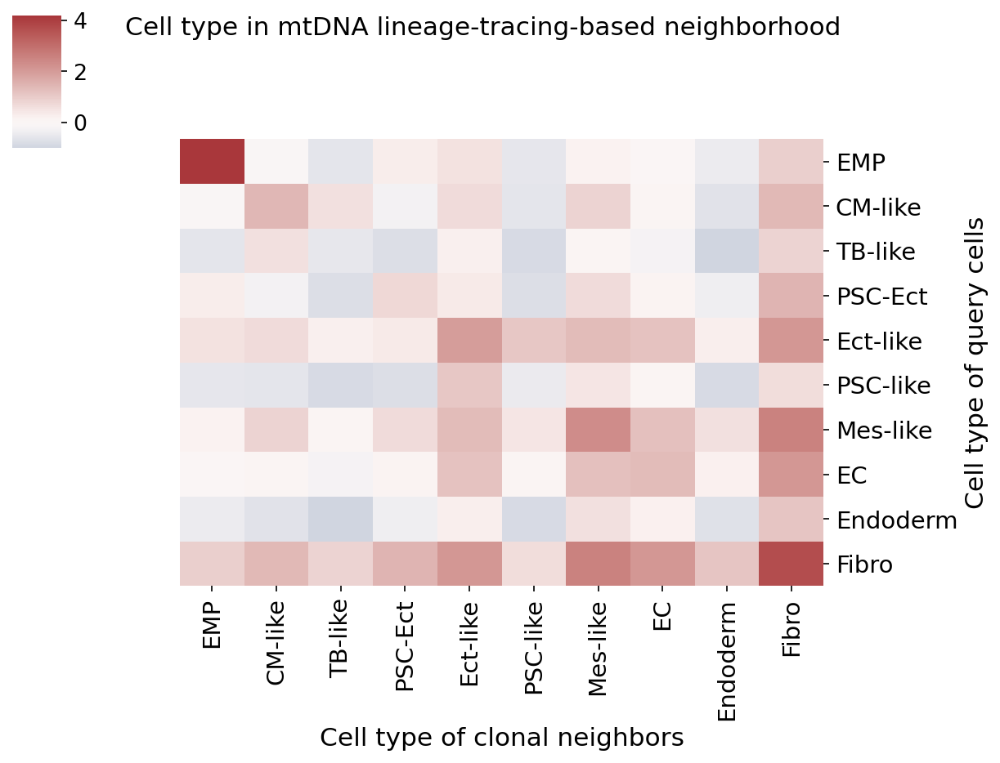

In [73]:
#cell cell distance

import multiprocessing as mp
from datetime import datetime


def get_cell_dis_dev(mat, v_prior, i, j):
    if i < j:
        # return (abs(mat[i, :] - mat[j, :]) * v_prior).sum()
        return (abs(mat[i, :] - mat[j, :]) * 1).sum()
    else:
        return 0

def get_distance(mat, n_core=64):
    cell_n, _v_n = mat.shape

    v_mean_af = mat.mean(0)
    v_prior = 1 - v_mean_af

    p = mp.Pool(n_core)
    results = p.starmap(get_cell_dis_dev, ((mat, v_prior, i, j) for i in range(cell_n) for j in range(cell_n) ))
    results = np.array(results).reshape(cell_n, cell_n)
#     # assign all element
    i_lower = np.tril_indices(cell_n, -1)
    results[i_lower] = results.T[i_lower]

    p.close()
    p.join()
    return results

# get cell-cell distance
start_time = datetime.now()
# cell * variants

_tar_df = tmp_merge_o.merge(_adata.obs[['barcode', 'cell_type']], how='left').dropna().reset_index()
_tar_col = af_columns_o
_af_df = _tar_df[_tar_col]

tar_m = np.array(_af_df)
ps_map = get_distance(tar_m)
end_time = datetime.now()

print('Computed cell-cell distance. (in {}s)'.format(end_time - start_time))

import seaborn as sns
# connectness
import networkx as nx


def from_dist_to_graph(d, k_param=30, return_nx_graph=True):
    if not isinstance(d, np.ndarray):
        d = d.values

    n_cells = d.shape[0]
    knn_mat = np.zeros((n_cells, k_param), dtype=int)
    knd_mat = np.zeros((n_cells, k_param))
    print(n_cells)
    # Find k nearest neighbors for each cell
    for i in range(n_cells):
        knn_indices = np.argsort(d[i, :])[:k_param]
        knn_mat[i, :] = knn_indices
        knd_mat[i, :] = d[i, knn_indices]

    nn_dist = knn_mat[:, :k_param]
    knn = nn_dist
    
    # Compute mutual k-nearest neighbors (MNN)
    knn2 = []
    for i in range(knn.shape[0]):
        xx = np.apply_along_axis(lambda x: i in x, 1, knn[knn[i, 1:], :])
        if np.sum(xx) > 0:
            temp_knn = np.concatenate(([knn[i, 0]], knn[i, 1:][xx]))
            temp_el = [[temp_knn[0], neighbor] for neighbor in temp_knn[1:]]
        # else:
        #     temp_el = [[knn[i, 0], knn[i, 1]]]
            knn2.extend(temp_el)

    el = np.array(knn2)
    graph = nx.Graph()
    graph.add_nodes_from(range(n_cells))

    graph.add_edges_from(el)

    mutual_knn = nx.to_numpy_array(graph, nodelist=range(n_cells))
    
    # mutual_knn = nx.to_numpy_array(graph, nodelist=sorted(graph.nodes()))

    # mutual_knn = nx.to_numpy_array(graph)
    if return_nx_graph:
        return mutual_knn, graph
    else:
        return mutual_knn, _

def aggregate_distance_matrix_by_class(X, class_df, cls_n="clone"):
    # Get unique classes
    classes = class_df.iloc[:, 0].unique()
    # Initialize a dictionary to store the results
    results = {}
    # Iterate over each class as the target class
    for target_class in classes:
        # Get the nodes that belong to the target class
        # print(target_class)
        target_nodes = class_df[class_df[cls_n] == target_class].index
        # print(target_nodes)
        # Initialize a dictionary to count connections to each class
        connection_counts = {cls: 0 for cls in classes}
        total_connections = 0
        # Iterate over each node in the target class
        for node in target_nodes:
            # Get the connections of the current node
            connections = X[node, :]
            # Count connections to each class
            for connected_node in np.where(connections == 1)[0]:
                connected_class = class_df.loc[connected_node, cls_n]
                # print(target_class, connected_node, connected_class)
                connection_counts[connected_class] += 1
                total_connections += 1
        # Calculate the proportion of connections to each class
        proportions = {cls: (count / total_connections * 100 if total_connections > 0 else 0) for cls, count in connection_counts.items()}
        # Store the result for the target class
        results[target_class] = proportions
    # Convert the result dictionary to a DataFrame for a better presentation
    results_df = pd.DataFrame(results).T
    return results_df, sorted(classes)


def get_connectness(ps_map, cls_df, af_df, k_param=30, cls_n = 'cell_type'):
    knn_mat, knn_graph = from_dist_to_graph(ps_map, k_param, return_nx_graph=True)
    X = knn_mat

    class_df = cls_df[["barcode", cls_n]].set_index('barcode')
    results_df, no = aggregate_distance_matrix_by_class(X, class_df, cls_n)

    tmp_df = results_df.loc[no, no]
    tmp_df = (tmp_df + tmp_df.T ) / 2
    g = sns.clustermap(tmp_df, annot=False, xticklabels=True, yticklabels=True, row_cluster=True, col_cluster=False, figsize=(8,6), z_score=0, cmap="vlag", center=0)
    plt.close()
    row_order = g.dendrogram_row.reordered_ind
    tmp_df_reordered = tmp_df.iloc[row_order, row_order]
    g = sns.clustermap(tmp_df_reordered, annot=False, xticklabels=True, yticklabels=True, row_cluster=False, col_cluster=False, figsize=(8,6), z_score=0, cmap="vlag", center=0)
    g.fig.suptitle("Cell type in mtDNA lineage-tracing-based neighborhood", fontsize=15)
    g.ax_heatmap.set_xlabel("Cell type of clonal neighbors", fontsize=15)
    g.ax_heatmap.set_ylabel("Cell type of query cells", fontsize=15)
    g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=14)  # Set x-axis label size
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=14) 
    # _out_png_f = "%s/2_clone_connectness.png" % (out_dir)
    # plt.savefig(_out_png_f, bbox_inches='tight')



k_param=30
o_af_df = _af_df
cls_df = _tar_df[['barcode', 'cell_type']].copy()
cls_n = 'cell_type'

knn_mat, knn_graph = from_dist_to_graph(ps_map, k_param, return_nx_graph=True)
# nx.draw(knn_graph)
X = knn_mat

class_df = cls_df[["barcode", cls_n]].set_index('barcode').reset_index()[[cls_n]]
results_df, no = aggregate_distance_matrix_by_class(X, class_df, cls_n)

tmp_df = results_df.loc[no, no]
tmp_df = (tmp_df + tmp_df.T ) / 2
g = sns.clustermap(tmp_df, annot=False, xticklabels=True, yticklabels=True, row_cluster=True, col_cluster=False, figsize=(8,6), z_score=0, cmap="vlag", center=0)
plt.close()
row_order = g.dendrogram_row.reordered_ind
tmp_df_reordered = tmp_df.iloc[row_order, row_order]
tmp_df_reordered = (tmp_df_reordered - tmp_df_reordered.stack().std()) /  tmp_df_reordered.stack().std()
g = sns.clustermap(tmp_df_reordered, annot=False, xticklabels=True, yticklabels=True, row_cluster=False, col_cluster=False, figsize=(8,6),  cmap="vlag", center=0)
g.fig.suptitle("Cell type in mtDNA lineage-tracing-based neighborhood", fontsize=15)
g.ax_heatmap.set_xlabel("Cell type of clonal neighbors", fontsize=15)
g.ax_heatmap.set_ylabel("Cell type of query cells", fontsize=15)
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=14)  # Set x-axis label size
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=14) 



# get_connectness(ps_map, cls_df, o_af_df, k_param)

In [28]:
# get from preprocess/LARRY_barcode.ipynb
_c_larry_path = "/autofs/bal31/jhsu/home/projects/sc/Larry/Larry_1.larry_clones.csv"
_c_larry_path = "/home/jhsu/projects/sc/all_backup/hemo_paper_larry/d4/larry/Larry_1.larry_clones.csv"

larry_df = pd.read_csv(_c_larry_path, header=None)
larry_df["barcode"] = larry_df[[1]]
larry_df["clone"] = larry_df[2]

larry_df = larry_df[['barcode', 'clone']]
larry_df = larry_df[larry_df['clone'] != ''].dropna()

d4_larry_df = larry_df.copy()
larry_df.shape



(4663, 2)

In [29]:
_c_larry_path = '/home/jhsu/projects/sc/all_backup/hemo_paper_larry/d8/larry/larry_barcode.csv'
larry_df = pd.read_csv(_c_larry_path,  header=0)


larry_df = larry_df[['barcode', 'clone']]
larry_df = larry_df[larry_df['clone'] != ''].dropna()

d8_larry_df = larry_df.copy()
larry_df.shape

(2702, 2)

In [32]:
d8_larry_df.barcode.isin(d4_larry_df.barcode).sum()

4

In [22]:
larry_df = d8_larry_df[~d8_larry_df.barcode.isin(d4_larry_df.barcode)]
larry_df.shape

(2698, 2)

In [83]:
# get from preprocess/LARRY_barcode.ipynb
_c_larry_path = '/home/jhsu/project/sc/hemo_paper_larry/d8/larry/larry_barcode.csv'
larry_df = pd.read_csv(_c_larry_path,  header=0)


larry_df = larry_df[['barcode', 'clone']]
larry_df = larry_df[larry_df['clone'] != ''].dropna()
larry_df.shape

(2702, 2)

In [23]:
_larry_df = pd.merge(pd.DataFrame({'barcode': adata.obs_names}), larry_df, how='left')
_larry_df.shape, _larry_df.head()

((4137, 2),
               barcode                                              clone
 0  AAACCCAAGTGCCCGT-1  AAGATGCTCACAAGTAACAATAGATCAAGTCTCGAGATAG-ACCTT...
 1  AAACCCACAAGACAAT-1                                                NaN
 2  AAACCCAGTACAGTTC-1           CGTCTGGCCACACGCGACACAGGAACCGGTGATCAGAGAC
 3  AAACGAACAAGTCCCG-1           CCGCTGACAACATTAAACGTATGACGATGTACCCAGGCAA
 4  AAACGCTCAATTGCCA-1           CCTCTGTGAGCAAGCCACAACGGAAGGGGTCCTAAGTCTA)

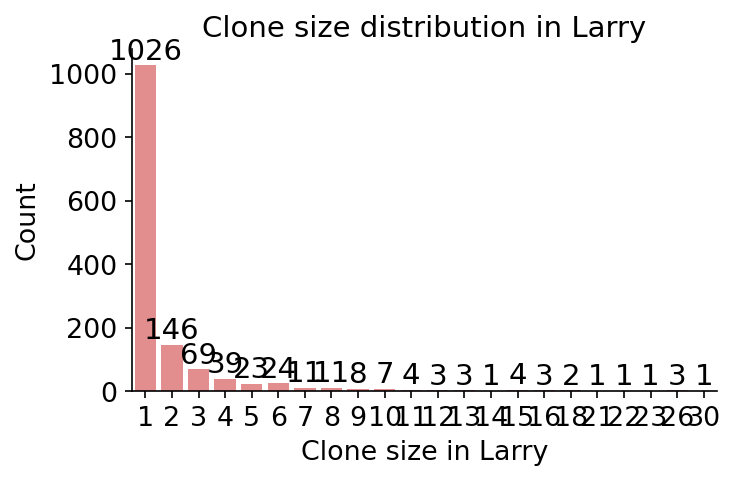

In [24]:
_l_clone_s_df = _larry_df.groupby(['clone']).size().reset_index(name='Size')
# _l_clone_s_df

tmp_df = _l_clone_s_df['Size'].value_counts().reset_index(name='Count')
tmp_df

fig, ax = plt.subplots(figsize=(5, 3))

p = sns.barplot(x='Size', y='Count', data=tmp_df, color='lightcoral', ax=ax)
p.set(title='Clone size distribution in Larry')
p.set(xlabel="Clone size in Larry")
p.set(ylabel='Count')

for i in p.containers:
    p.bar_label(i,)

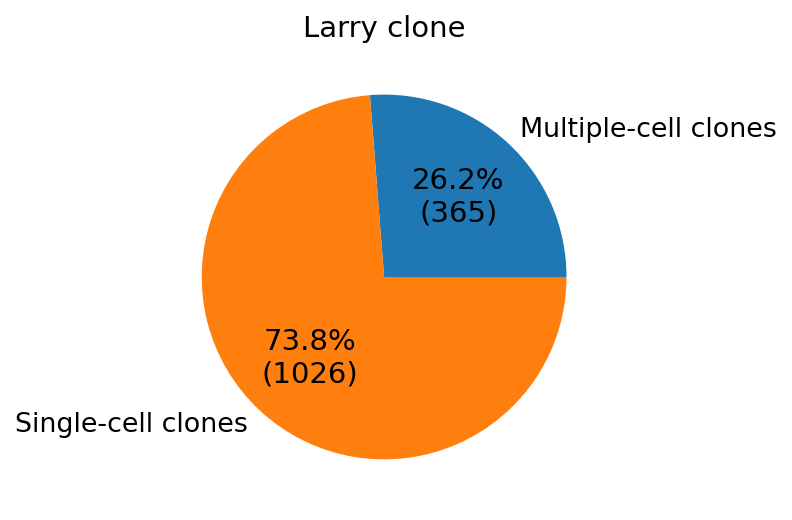

In [25]:
_t1, _t2 = tmp_df['Count'].sum() - tmp_df[tmp_df['Size'] == 1]['Count'].values[0], tmp_df[tmp_df['Size'] == 1]['Count'].values[0]
_tmp_p_tb = pd.DataFrame({'number': [_t1, _t2]},
                  index=['Multiple-cell clones', 'Single-cell clones'])

def autopct_format(values):
    def my_format(pct):
        total = values.sum().values[0]
        val = int(round(pct*total/100.0))
        return '{:.1f}%\n({v:d})'.format(pct, v=val)
    return my_format

# plt.pie(mydata,labels = mylabels, autopct=autopct_format(mydata))

fig, ax = plt.subplots( 
    nrows=1,
    ncols=1,
    figsize=(4, 4)
)
_tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
ax.set_title("Larry clone")
ax.set_ylabel('')
ax.get_legend().remove()

In [26]:
365 + 1026

1391

In [87]:
# _l_clone_s_df[_l_clone_s_df['Size'] >= 2].clone

In [88]:
t_larry_df = _larry_df[_larry_df['clone'].isin(_l_clone_s_df[_l_clone_s_df['Size'] >= 2].clone)]
t_larry_df.shape

(1674, 2)

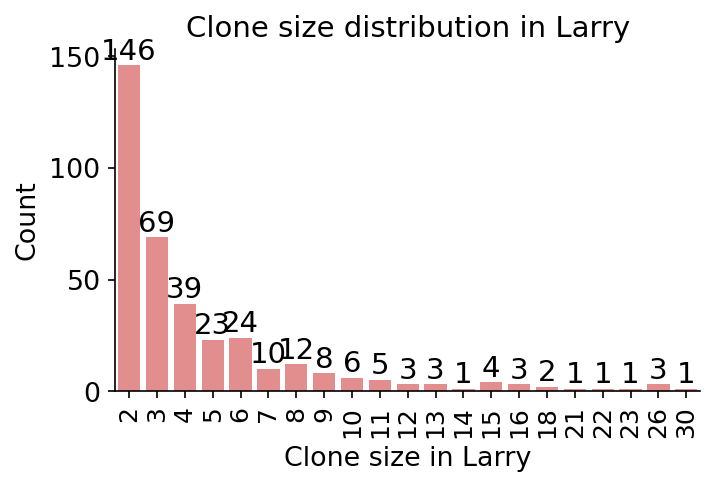

In [89]:
_l_clone_s_df = t_larry_df.groupby(['clone']).size().reset_index(name='Size')
# _l_clone_s_df

tmp_df = _l_clone_s_df['Size'].value_counts().reset_index(name='Count')
tmp_df

fig, ax = plt.subplots(figsize=(5, 3))
# sns.set(font_scale=1)
p = sns.barplot(x='Size', y='Count', data=tmp_df, color='lightcoral', ax=ax)
p.set(title='Clone size distribution in Larry')
p.set(xlabel="Clone size in Larry")
p.set(ylabel='Count')
# ax.tick_params(axis='x', labelrotation=90)
plt.xticks(fontsize=12, rotation=90)

for i in p.containers:
    p.bar_label(i,)

In [90]:
t_adata = adata[adata.obs_names.isin(t_larry_df.barcode)]

t_df_time = pd.DataFrame(data={'time_info': [1] * len(t_adata.obs_names)})
t_df_time.head()
adata_orig = cs.pp.initialize_adata_object(
    X_state=t_adata.layers['counts'],
    gene_names=t_adata.var_names,
    cell_names=t_adata.obs_names,
    time_info=t_df_time["time_info"],
    state_info=t_adata.obs['cell_type'],
    X_emb=t_adata.obsm['X_umap'],
    X_pca =t_adata.obsm['X_pca'],
    data_des="my_data",
)

Create new anndata object
Time points with clonal info: []


In [91]:
df1 = t_adata.obs['cell_type'].to_frame().reset_index().rename(columns={"index":"barcode"})
df2 = t_larry_df
_tar_df1 = pd.merge(df1, df2, how="inner", on="barcode").dropna()
_tar_df2 = _tar_df1.groupby("clone").agg({ "cell_type": lambda x: x.nunique(), "barcode": 'size'})
_l1_clone_size = len(_tar_df2.index)
_l1_clone_size_cell = _tar_df2.barcode.sum()
_l1_clone_ind_cellfate = len(_tar_df2[_tar_df2['cell_type'] <= 1].index)
_l1_clone_ind_cellfate_cell = _tar_df2[_tar_df2['cell_type'] <= 1].barcode.sum()
_l1_clone_size, _l1_clone_size_cell, _l1_clone_ind_cellfate, _l1_clone_ind_cellfate_cell

(365, 1674, 146, 408)

40.0


(0.0, 60.0)

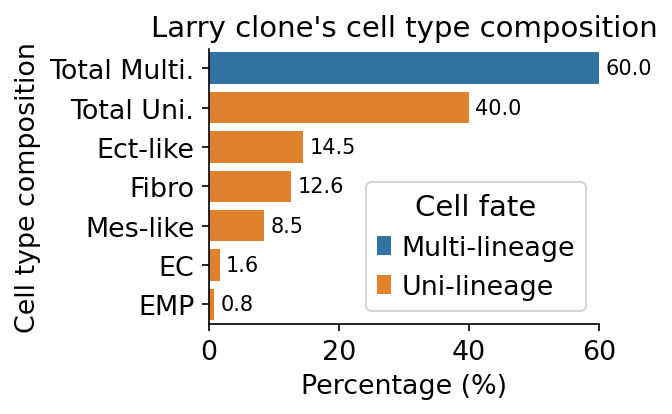

In [92]:
# _tar_df1
_m = {'Mes-like': "ML", "PSC-Ect":"PE", "EC":"EC", "Fibro":"FB", "Mes-PS": "MS", "PSC-like":"PL", "Endoderm":"En", "TB-like":"TL"}
# _tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: _m[x])
_tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: x)
        
new_tar_df1 = _tar_df1.groupby("clone").agg({'cell_type_s': lambda s: "%s" % (",".join(sorted(set(s))))})['cell_type_s'].value_counts().to_frame().reset_index()
new_tar_df1['percentage'] = new_tar_df1['count'].apply(lambda x: x/new_tar_df1['count'].sum() * 100)
new_tar_df1['Cell fate'] = new_tar_df1.cell_type_s.apply(lambda x: 
            "Uni-lineage" if len(set(x.split(','))) == 1 else "Multi-lineage")


_tar_tt =  "Uni-lineage"

_pp_1 = new_tar_df1[new_tar_df1['Cell fate'] == _tar_tt].percentage.sum()
print(_pp_1)
new_tar_df1 = new_tar_df1[new_tar_df1['Cell fate'] ==_tar_tt]
def insert(df, row):
    insert_loc = df.index.max()

    if pd.isna(insert_loc):
        df.loc[0] = row
    else:
        df.loc[insert_loc + 1] = row

new_tar_df1.loc[-1] = ["Total Uni.", 1000, _pp_1, _tar_tt] # adding a row
new_tar_df1.index = new_tar_df1.index + 1  # shifting index
new_tar_df1 = new_tar_df1.sort_index()  # sorting by index



_pp_1 = 100-_pp_1
_tar_tt =  "Multi-lineage"
new_tar_df1.loc[-1] = ["Total Multi.", 1000, _pp_1, _tar_tt] # adding a row
new_tar_df1.index = new_tar_df1.index + 1  # shifting index
new_tar_df1 = new_tar_df1.sort_index()  # sorting by index


fig, ax = plt.subplots( 
    nrows=1,
    ncols=1,
    figsize=(4.5, 3))

# ax = axs[0]
# sns.barplot(new_tar_df1[new_tar_df1['count'] >3], y='cell_type_s', x='count', hue='Cell fate', ax=ax)
sns.barplot(new_tar_df1[new_tar_df1['count'] >=3], y='cell_type_s', x='percentage', hue="Cell fate", ax=ax)
# _tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
# ax.set_title("Cell type composition over Larry clone")
# ax.set_ylabel('Cell type composition')
# ax.locator_params(integer=True)
# ax.legend(loc='center right', bbox_to_anchor=(1.25, 0.5), ncol=1)

ax.set_ylabel('Cell type composition')
ax.set_xlabel('Percentage (%)')
# ax.set_ylabel('Uni-lineage cell type')
# ax.yaxis.set_tick_params(labelsize=8)
ax.bar_label(ax.containers[-1], fmt='%.1f', fontsize=10, padding=3)
ax.bar_label(ax.containers[-2], fmt='%.1f', fontsize=10, padding=3)
ax.set_title("Larry clone's cell type composition")



fig.tight_layout()
plt.xlim(0, 60)

40.0


(0.0, 60.0)

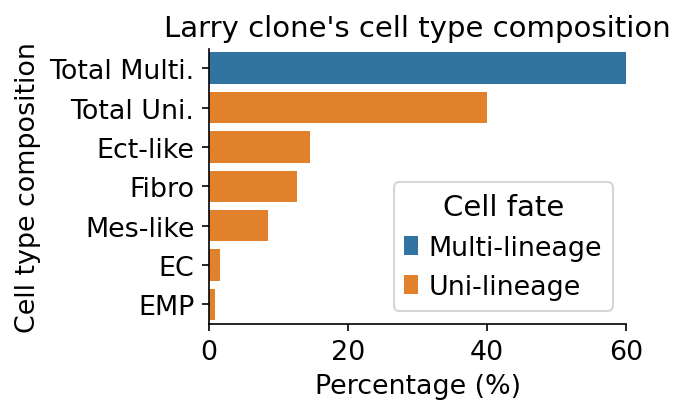

In [93]:
# _tar_df1
_m = {'Mes-like': "ML", "PSC-Ect":"PE", "EC":"EC", "Fibro":"FB", "Mes-PS": "MS", "PSC-like":"PL", "Endoderm":"En", "TB-like":"TL"}
# _tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: _m[x])
_tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: x)
        
new_tar_df1 = _tar_df1.groupby("clone").agg({'cell_type_s': lambda s: "%s" % (",".join(sorted(set(s))))})['cell_type_s'].value_counts().to_frame().reset_index()
new_tar_df1['percentage'] = new_tar_df1['count'].apply(lambda x: x/new_tar_df1['count'].sum() * 100)
new_tar_df1['Cell fate'] = new_tar_df1.cell_type_s.apply(lambda x: 
            "Uni-lineage" if len(set(x.split(','))) == 1 else "Multi-lineage")


_tar_tt =  "Uni-lineage"

_pp_1 = new_tar_df1[new_tar_df1['Cell fate'] == _tar_tt].percentage.sum()
print(_pp_1)
new_tar_df1 = new_tar_df1[new_tar_df1['Cell fate'] ==_tar_tt]
def insert(df, row):
    insert_loc = df.index.max()

    if pd.isna(insert_loc):
        df.loc[0] = row
    else:
        df.loc[insert_loc + 1] = row

new_tar_df1.loc[-1] = ["Total Uni.", 1000, _pp_1, _tar_tt] # adding a row
new_tar_df1.index = new_tar_df1.index + 1  # shifting index
new_tar_df1 = new_tar_df1.sort_index()  # sorting by index



_pp_1 = 100-_pp_1
_tar_tt =  "Multi-lineage"
new_tar_df1.loc[-1] = ["Total Multi.", 1000, _pp_1, _tar_tt] # adding a row
new_tar_df1.index = new_tar_df1.index + 1  # shifting index
new_tar_df1 = new_tar_df1.sort_index()  # sorting by index


fig, ax = plt.subplots( 
    nrows=1,
    ncols=1,
    figsize=(4.5, 3))

# ax = axs[0]
# sns.barplot(new_tar_df1[new_tar_df1['count'] >3], y='cell_type_s', x='count', hue='Cell fate', ax=ax)
sns.barplot(new_tar_df1[new_tar_df1['count'] >=3], y='cell_type_s', x='percentage', hue="Cell fate", ax=ax)
# _tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
# ax.set_title("Cell type composition over Larry clone")
# ax.set_ylabel('Cell type composition')
# ax.locator_params(integer=True)
# ax.legend(loc='center right', bbox_to_anchor=(1.25, 0.5), ncol=1)

ax.set_ylabel('Cell type composition')
ax.set_xlabel('Percentage (%)')
# ax.set_ylabel('Uni-lineage cell type')
# ax.yaxis.set_tick_params(labelsize=8)
# ax.bar_label(ax.containers[-1], fmt='%.1f', fontsize=10, padding=3)
# ax.bar_label(ax.containers[-2], fmt='%.1f', fontsize=10, padding=3)
ax.set_title("Larry clone's cell type composition")



fig.tight_layout()
plt.xlim(0, 60)

In [94]:
# _tar_df1
_m = {'Mes-like': "ML", "PSC-Ect":"PE", "Ect-like":"EL", "EMP":"EMP", "CM-like":"CL", "EC":"EC", "Fibro":"FB", "Mes-PS": "MS", "PSC-like":"PL", "Endoderm":"En", "TB-like":"TL"}
_tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: _m[x])
        
new_tar_df1 = _tar_df1.groupby("clone").agg({'cell_type': lambda s: "%s" % (",".join(sorted(s)))})['cell_type'].value_counts().to_frame().reset_index()
new_tar_df1

,cell_type,count
0,"Ect-like,Ect-like",38
1,"Fibro,Fibro",28
2,"Mes-like,Mes-like",15
3,"Fibro,Mes-like",10
4,"Mes-like,Mes-like,Mes-like",10
...,...,...
169,"EC,EC,EC,Fibro,Mes-like,Mes-like",1
170,"EC,EC,EC,Fibro,Fibro,Fibro,Fibro,Fibro,Fibro,M...",1
171,"EC,Fibro,Fibro,PSC-Ect,PSC-Ect,PSC-Ect,PSC-Ect...",1
172,"CM-like,Fibro",1


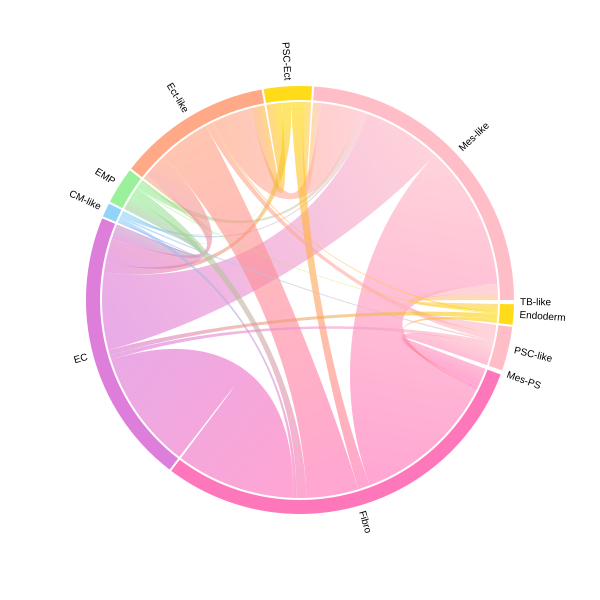

In [95]:
tar_lst = list(_m.keys())
tar_lst_m = {v: i for i, v in enumerate(tar_lst)}
tar_lst_mat = np.zeros((len(tar_lst), len(tar_lst)))

for index, row in new_tar_df1.iterrows():
    _tt1, _tt2 = row['cell_type'], row['count']
    _n_tt1 = list(set(_tt1.split(',')))
    _n_tt1_n = len(_n_tt1)
    if _n_tt1_n > 1:
        for _i in range(_n_tt1_n):
            for _j in range(_n_tt1_n):
                if _i > _j:
                  tar_lst_mat[tar_lst_m[_n_tt1[_i]], tar_lst_m[_n_tt1[_j]]] += (_tt2/_n_tt1_n)
tar_lst_mat = tar_lst_mat + tar_lst_mat.T

import openchord as ocd

adjacency_matrix = tar_lst_mat
labels = tar_lst

fig = ocd.Chord(adjacency_matrix, labels)
fig.plot_area = {"x": -300, "y": -300, "w": 600, "h": 600}
fig.show()

In [96]:
cs.pp.get_X_clone(adata_orig, t_larry_df["barcode"], t_larry_df["clone"])

100%|██████████| 1674/1674 [00:00<00:00, 1917330.67it/s]

reorder clones


Text(0.5, 1.0, 'D8 dataset')

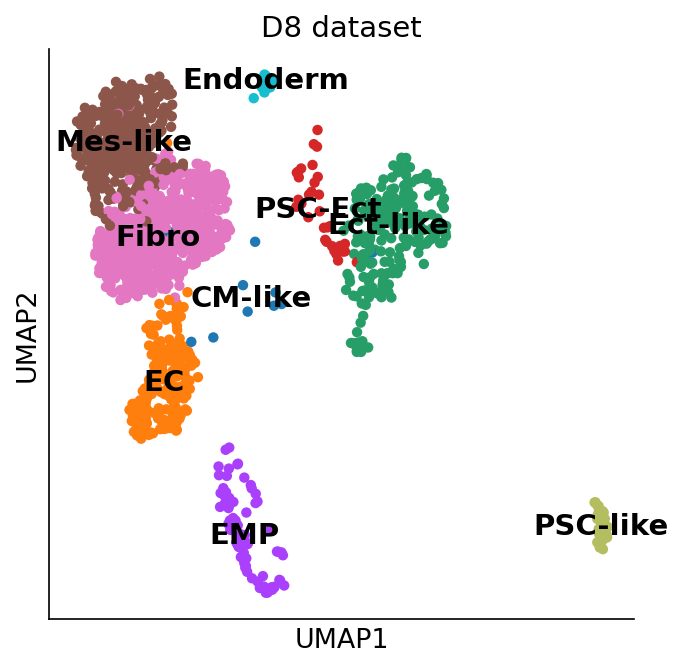

In [97]:
fig, ax = plt.subplots(figsize=(5, 5))
ax = sc.pl.embedding (adata_orig, basis="X_emb",  color="state_info", legend_loc="on data", show=False, ax=ax, size=100)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title('D8 dataset')

Data saved at adata.uns['barcode_heatmap']


<Axes: title={'center': '365 clones'}>

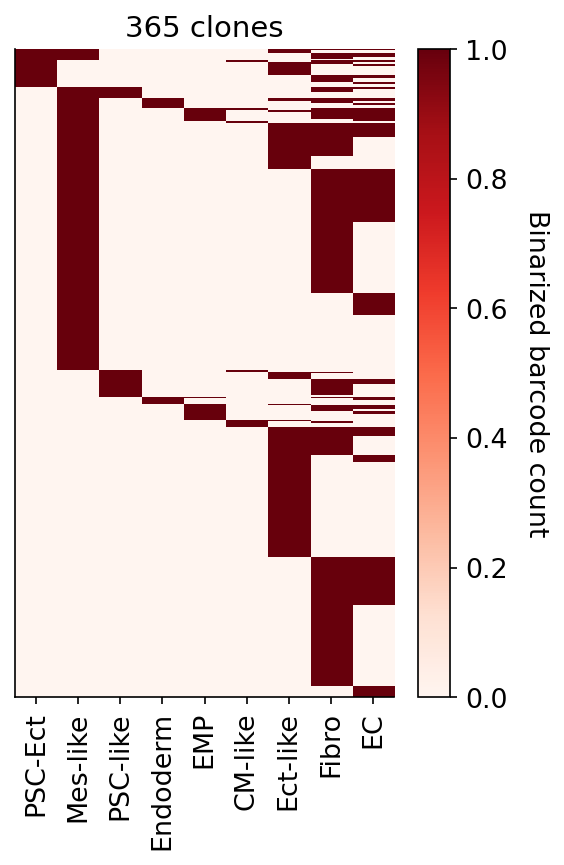

In [98]:
selected_times = None

cs.pl.barcode_heatmap(
    adata_orig,
    color_bar=True,
    log_transform=False,
    binarize=True,
)

normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
Results saved as dictionary at adata.uns['fate_coupling_X_clone']


Text(0.5, 1.0, 'Fate coupling score based on LARRY clone')

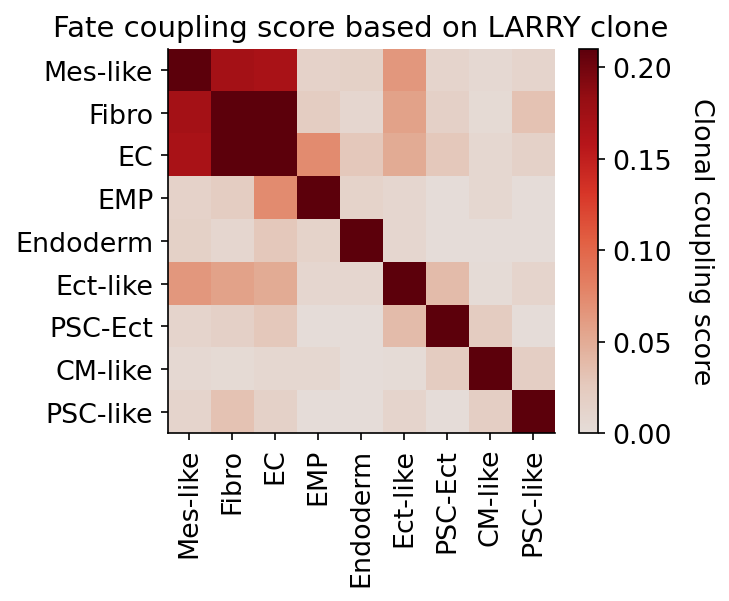

In [99]:
cs.tl.fate_coupling(
    adata_orig, source="X_clone"
)  # compute the fate coupling

fig, ax = plt.subplots(figsize=(5, 4))
cs.pl.fate_coupling(adata_orig, source="X_clone", ax=ax)  # actually plot the coupling
ax.set_title('Fate coupling score based on LARRY clone')

(9, 146) (9, 219)
1e-10
[0 1 2 3 4 5 6 7 8]


Text(0.5, -12.833333333333318, 'Cell type')

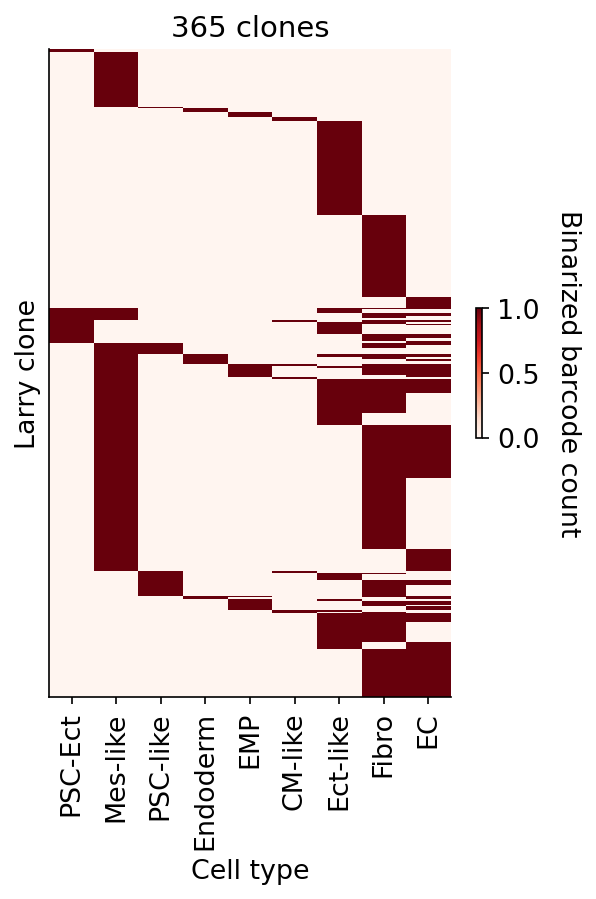

In [100]:
from cospar import tool as tl
from cospar.plotting import _utils as pl_util
from scipy.cluster import hierarchy
color_map_reds = pl_util.darken_cmap(plt.cm.Reds, scale_factor=0.9)
color_map_coolwarm = pl_util.darken_cmap(plt.cm.coolwarm, scale_factor=1)

def heatmap(
    data_matrix,
    order_map_x=True,
    order_map_y=True,
    x_ticks=None,
    y_ticks=None,
    x_tick_style=None,
    y_tick_style=None,
    col_range=[0, 99],
    color_bar_label="",
    log_transform=False,
    color_map=plt.cm.Reds,
    vmin=None,
    vmax=None,
    fig_width=4,
    fig_height=6,
    color_bar=True,
    x_label=None,
    y_label=None,
    x_label_style=None,
    y_label_style=None,
    print_ordered_labels=False,
    pseudo_count=10 ** (-10),
    ax=None,
    semi_triangular=False,
):
    """
    Plot ordered heat map of non-square data_matrix matrix

    Parameters
    ----------
    data_matrix: `np.array`
        The data matrix to be plotted
    order_map_x: `bool`
        Whether to re-order the x coordinate of the matrix or not
    order_map_y: `bool`
        Whether to re-order the y coordinate of the matrix or not
    x_ticks, y_ticks: `list`
        List of variable names for x and y ticks
    color_bar_label: `str`, optional (default: 'cov')
        Color bar label
    data_des: `str`, optional (default: '')
        String to distinguish different saved objects.
    log_transform: `bool`, optional (default: False)
        If true, perform a log transform. This is needed when the data
        matrix has entries varying by several order of magnitude.
    col_range: `tuple`, optional (default: None)
        The default setting is to plot the actual value of the vector.
        If col_range is set within [0,100], it will plot the percentile of the values,
        and the color_bar will show range [0,1]. This re-scaling is useful for
        visualizing gene expression.

    Returns
    ax,
    order_x,
        An integer index for ordered x axis
    order_y,
        An integer index for ordered y axis
    """

    from matplotlib.colors import Normalize as mpl_Normalize

    x_array = np.arange(data_matrix.shape[1])
    y_array = np.arange(data_matrix.shape[0])
    if order_map_x and (data_matrix.shape[1] > 2):
        if data_matrix.shape[0] != data_matrix.shape[1]:
            X = tl.get_normalized_covariance(data_matrix + pseudo_count, method="SW")
            Z = hierarchy.ward(X)
            order_x = hierarchy.leaves_list(hierarchy.optimal_leaf_ordering(Z, X))
        else:
            Z = hierarchy.ward(data_matrix + pseudo_count)
            order_x = hierarchy.leaves_list(
                hierarchy.optimal_leaf_ordering(Z, data_matrix + pseudo_count)
            )
    else:
        order_x = x_array
    print(x_array)

    if order_map_y and (data_matrix.shape[0] > 2):
        if data_matrix.shape[0] != data_matrix.shape[1]:
            order_y = hf.get_hierch_order(data_matrix + pseudo_count)
        else:
            Z = hierarchy.ward(data_matrix + pseudo_count)
            order_y = hierarchy.leaves_list(
                hierarchy.optimal_leaf_ordering(Z, data_matrix + pseudo_count)
            )
    else:
        order_y = y_array

    if log_transform:
        new_data = np.log(data_matrix[order_y][:, order_x] + 1) / np.log(10)
        label_ = " (log10)"
    else:
        new_data = data_matrix[order_y][:, order_x]
        label_ = ""

    col_data = new_data.flatten()
    if vmin is None:
        if col_range is None:
            vmin = np.min(col_data)
        else:
            vmin = np.percentile(col_data, col_range[0])

    if vmax is None:
        if col_range is None:
            vmax = np.max(col_data)
        else:
            vmax = np.percentile(col_data, col_range[1])
            if (vmax == 0) & (np.max(col_data) >= 1):
                vmax = 1
            if (vmax == 0) & (np.max(col_data) <= 1):
                vmax = np.max(col_data)

    if ax is None:
        fig, ax = plt.subplots()
        ax_ = None
    else:
        ax_ = ax

    if semi_triangular:
        upper_triangle_indices = np.triu_indices(new_data.shape[0])
        new_data[upper_triangle_indices] = np.nan

    ax.imshow(
        new_data,
        aspect="auto",
        cmap=color_map,
        vmin=vmin,
        vmax=vmax,
        interpolation="none",
    )

    if x_ticks is None:
        plt.xticks([])
    else:
        plt.xticks(
            x_array,
            np.array(x_ticks)[order_x],
            rotation=90,
            style=x_tick_style,
        )

        if print_ordered_labels:
            x_ticks_print = "','".join(np.array(x_ticks)[order_x])
            print(f"x_order: [{','.join(np.array(order_x).astype(str))}]")
            print(f"x_ticks: ['{x_ticks_print}']")

    if y_ticks is None:
        plt.yticks([])
    else:
        plt.yticks(
            y_array,
            np.array(y_ticks)[order_y],
            style=y_tick_style,
        )

        if print_ordered_labels:
            y_ticks_print = "','".join(np.array(y_ticks)[order_y])
            print(f"y_order: [{','.join(np.array(order_y).astype(str))}]")
            print(f"y_ticks: ['{y_ticks_print}']")

    if x_label is not None:
        ax.set_xlabel(x_label, style=x_label_style)

    if y_label is not None:
        ax.set_ylabel(y_label, style=y_label_style)

    if color_bar:
        norm = mpl_Normalize(vmin=vmin, vmax=vmax)
        cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=color_map), location='right', shrink=0.2)
        cbar.set_label(f"{color_bar_label}{label_}", rotation=270, labelpad=20)
    if ax_ is None:
        plt.gcf().set_size_inches((fig_width, fig_height))
    return ax

def fate_coupling(
    adata,
    source="transition_map",
    color_bar=True,
    rename_fates=None,
    color_map=color_map_reds,
    figure_index="",
    color_bar_label="Clonal coupling score",
    title=None,
    vmax=None,
    semi_triangular=False,
    **kwargs,
):
    """
    Plot fate coupling determined by the transition map.

    The results should be pre-computed from :func:`cospar.tl.fate_coupling`

    Parameters
    ----------
    adata: :class:`~anndata.AnnData` object
        Assume to contain transition maps at adata.uns.
    {source}
    {color_bar}
    {rename_fates}
    {color_map}
    {figure_index}

    Returns
    -------
    ax:
        The axis object of this plot.
    """

    fig_width = 4
    fig_height = 3.5
    fig_point_size = 2


    data_des = adata.uns["data_des"][-1]

    if color_bar:
        fig_width = fig_width + 0.5

    key_word = f"fate_coupling_{source}"
    # available_choices = hf.parse_output_choices(adata, key_word, where="uns")
    X_coupling = adata.uns[key_word]["X_coupling"]
    fate_names = adata.uns[key_word]["fate_names"]
    # rename_fates = hf.rename_list(fate_names, rename_fates)

    if "x_ticks" not in kwargs.keys():
        kwargs["x_ticks"] = rename_fates
    if "y_ticks" not in kwargs.keys():
        kwargs["y_ticks"] = rename_fates

    if vmax is None:
        # vmax = (
        #     np.percentile(X_coupling - np.diag(np.diag(X_coupling)), 95)
        #     + np.percentile(X_coupling - np.diag(np.diag(X_coupling)), 98)
        # ) / 2
        vmax = np.max(X_coupling - np.diag(np.diag(X_coupling)))

    ax = heatmap(
        X_coupling,
        color_bar_label=color_bar_label,
        color_bar=color_bar,
        fig_width=fig_width,
        fig_height=fig_height,
        color_map=color_map,
        vmax=vmax,
        semi_triangular=semi_triangular,
        **kwargs,
    )

    if title is None:
        ax.set_title(f"source: {source}")
    else:
        ax.set_title(title)

    if figure_index != "":
        figure_index == f"_{figure_index}"
    plt.tight_layout()

    return ax

def barcode_heatmap(
    adata,
    selected_times=None,
    selected_fates=None,
    color_bar=True,
    rename_fates=None,
    normalize=False,
    binarize=False,
    log_transform=False,
    fig_width=4,
    fig_height=6,
    figure_index="",
    plot=True,
    pseudocount=10 ** (-10),
    order_map_x=False,
    order_map_y=False,
    fate_normalize_source="X_clone",
    select_clones_with_fates: list = None,
    select_clones_without_fates: list = None,
    select_clones_mode: str = "or",
    **kwargs,
):
    data_des = adata.uns["data_des"][-1]
    data_des = f"{data_des}_clonal"

    coarse_X_clone, mega_cluster_list = tl.coarse_grain_clone_over_cell_clusters(
        adata,
        selected_times=selected_times,
        selected_fates=selected_fates,
        normalize=normalize,
        fate_normalize_source=fate_normalize_source,
        select_clones_with_fates=select_clones_with_fates,
        select_clones_without_fates=select_clones_without_fates,
        select_clones_mode=select_clones_mode,
        **kwargs,
    )
    if rename_fates is None:
        rename_fates = mega_cluster_list

    if len(rename_fates) != len(mega_cluster_list):
        rename_fates = mega_cluster_list

    if "x_ticks" not in kwargs.keys():
        kwargs["x_ticks"] = rename_fates

    coarse_X_clone_new = pl_util.custom_hierachical_ordering(
        np.arange(coarse_X_clone.shape[0]), coarse_X_clone
    )
    ind_ct_t = coarse_X_clone_new[:, (coarse_X_clone_new > 0).sum(0) <= 1]
    # print(ind_ct_t.shape)
    mul_ct_t = coarse_X_clone_new[:, (coarse_X_clone_new > 0).sum(0) > 1]
    print(ind_ct_t.shape, mul_ct_t.shape)
    coarse_X_clone_new = np.concatenate((ind_ct_t, mul_ct_t), axis=1)
    adata.uns["barcode_heatmap"] = {
        "coarse_X_clone": coarse_X_clone,
        "fate_names": rename_fates,
    }
    if plot:
        if binarize:
            final_matrix = coarse_X_clone_new > 0
            color_bar_label = "Binarized barcode count"
        else:
            final_matrix = coarse_X_clone_new
            color_bar_label = "Barcode count"

        if normalize:
            color_bar_label += " (normalized)"

        clone_idx = final_matrix.sum(0) > 0
        print(pseudocount)
        ax = heatmap(
            final_matrix[:, clone_idx].T + pseudocount,
            order_map_x=order_map_x,
            order_map_y=order_map_y,
            color_bar_label=color_bar_label,
            log_transform=log_transform,
            fig_width=fig_width,
            
            fig_height=fig_height,
            color_bar=color_bar,
            **kwargs,
        )
        plt.title(f"{np.sum(clone_idx)} clones")

        # bands = np.array([0, ind_ct_t.shape[1], coarse_X_clone_new.shape[1]])
        # print(bands)
        # bnames = ['H3K4me3', 'H3K9me3']
        # for y, h, bn in zip(bands, np.diff(bands), bnames):
        #     cb = CurlyBrace([990, y+h*0.025], 30, h*.95)
        #     ax.add_patch(cb)
        #     ax.text(1030, y+h/2, bn, va='center')

    

        plt.tight_layout()
        if figure_index != "":
            figure_index == f"_{figure_index}"
    
        return ax

ax = barcode_heatmap(
    adata_orig,
    color_bar=True,
    log_transform=False,
    binarize=True,
)
ax.set_ylabel('Larry clone')
ax.set_xlabel('Cell type')


normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
Results saved as dictionary at adata.uns['fate_coupling_X_clone']
x_order: [0,1,2,3,4,5,6,7,8]
x_ticks: ['PSC-Ect','Mes-like','PSC-like','Endoderm','EMP','CM-like','Ect-like','Fibro','EC']
y_order: [0,1,2,3,4,5,6,7,8]
y_ticks: ['PSC-Ect','Mes-like','PSC-like','Endoderm','EMP','CM-like','Ect-like','Fibro','EC']


Text(0.5, 1.0, 'Fate coupling score based on LARRY clone')

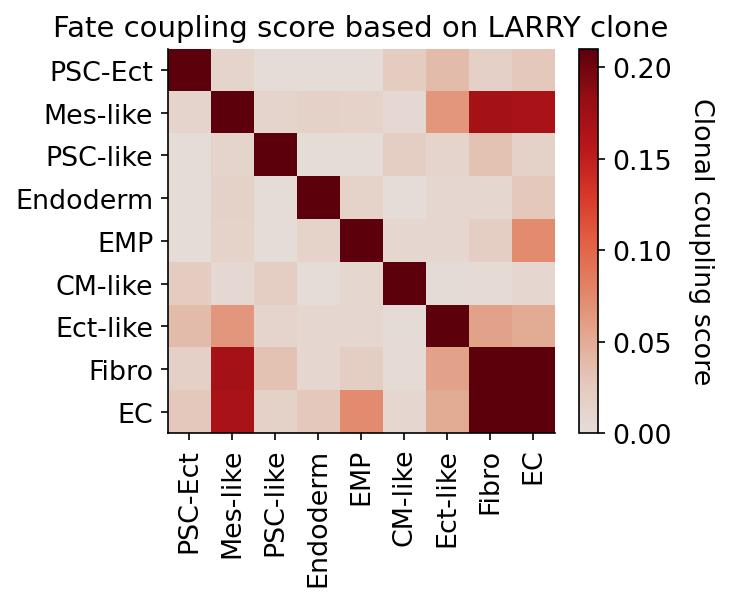

In [101]:
cs.tl.fate_coupling(
    adata_orig, source="X_clone"
)  # compute the fate coupling

fig, ax = plt.subplots(figsize=(5, 4))
cs.pl.fate_coupling(adata_orig, source="X_clone", ax=ax, order_map_x=False, order_map_y=False, print_ordered_labels=True)  # actually plot the coupling
# heatmap(adata_orig.uns["fate_coupling_X_clone"]["X_coupling"], ax=ax, order_map_x=True, order_map_y=True, print_ordered_labels=True)  # actually plot the coupling
ax.set_title('Fate coupling score based on LARRY clone')

In [102]:
cs.tl.fate_hierarchy(
    adata_orig, source="X_clone"
)  # compute the fate hierarchy
cs.pl.fate_hierarchy(adata_orig, source="X_clone")  # actually plot the hierarchy

normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
Results saved as dictionary at adata.uns['fate_hierarchy_X_clone']

            /-CM-like
         /-|
        |   \-PSC-Ect
        |
        |            /-EC
      /-|         /-|
     |  |      /-|   \-Fibro
     |  |     |  |
     |  |   /-|   \-Mes-like
   /-|  |  |  |
  |  |   \-|   \-Ect-like
  |  |     |
--|  |      \-EMP
  |  |
  |   \-P

100%|██████████| 365/365 [00:00<00:00, 609.09it/s]


Data saved at adata.uns['clonal_fate_bias']


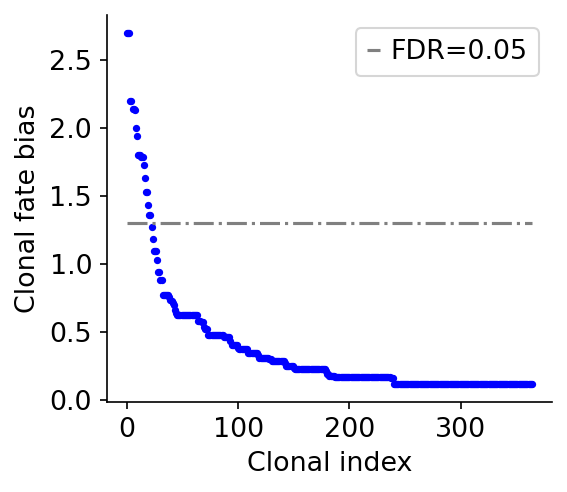

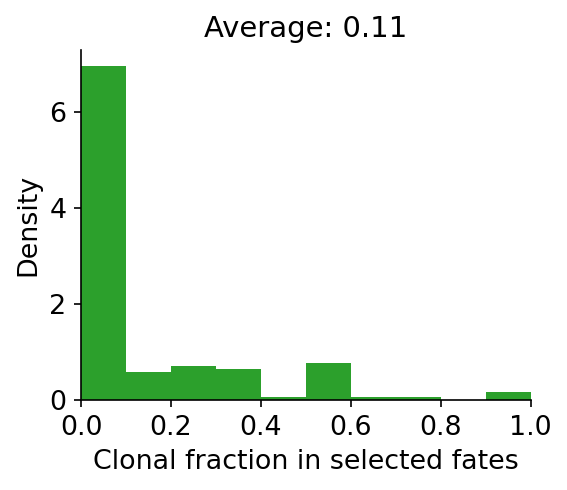

In [120]:
cs.tl.clonal_fate_bias(
    # adata_orig, selected_fate="mes-like", alternative="two-sided"
    adata_orig, selected_fate="EC", alternative="two-sided"
)  # compute the fate hierarchy
cs.pl.clonal_fate_bias(adata_orig)  # actually plot the hierarchy

In [121]:
result = adata_orig.uns["clonal_fate_bias"]
result

,clone_id,clone_size,P_value,clonal_fraction_in_target_fate,Fate_bias
177,177,3.0,0.001978,1.000000,2.703840
116,116,3.0,0.001978,1.000000,2.703840
256,256,3.0,0.001978,1.000000,2.703840
122,122,7.0,0.006307,0.571429,2.200151
130,130,7.0,0.006307,0.571429,2.200151
...,...,...,...,...,...
173,173,2.0,0.763731,0.000000,0.117060
169,169,2.0,0.763731,0.000000,0.117060
226,226,2.0,0.763731,0.000000,0.117060
223,223,2.0,0.763731,0.000000,0.117060


In [122]:
# result[result['P_value'] < 0.001].shape

In [123]:
from cospar import settings
from cospar import help_functions as hf
from matplotlib import pyplot as plt
from cospar.plotting import _utils as pl_util
import os
import numpy as np
# settings.fig_width

In [124]:

def clones_on_manifold(
    adata,
    selected_clone_list=[0],
    color_list=["red", "blue", "purple", "green", "cyan", "black"],
    selected_annotation_key="time_info",
    selected_annotation_info=None,
    title=None,
    clone_markersize=12,
    clone_markeredgewidth=1,
    markeredgecolor="black",
    **kwargs,
):
    """
    Plot clones on top of state embedding.

    Parameters
    ----------
    adata: :class:`~anndata.AnnData` object
    selected_clone_list: `list`
        List of selected clone ID's.
    color_list: `list`, optional (default: ['red','blue','purple','green','cyan','black'])
        The list of color that defines color at respective time points.
    selected_annotation_info: `list`, optional (default: all)
        Select time points to show corresponding states. If set to be [], use all states.
    title: None
        Default, show the clone id as panel title. Otherwise, show the text string from input 'title'
    clone_markersize: `int`, optional (default: 12)
        Clone marker size
    clone_markeredgewidth: `int`, optional (default: 1)
        Edige size for clone marker
    """

    fig_width = settings.fig_width
    fig_height = settings.fig_height
    point_size = settings.fig_point_size
    x_emb = adata.obsm["X_emb"][:, 0]
    y_emb = adata.obsm["X_emb"][:, 1]
    data_des = adata.uns["data_des"][-1]
    # data_path=settings.data_path
    figure_path = settings.figure_path
    X_clone = adata.obsm["X_clone"]
    time_info = np.array(adata.obs[selected_annotation_key])

    # use only valid time points
    sp_idx = hf.selecting_cells_by_time_points(time_info, selected_annotation_info)
    selected_annotation_info = np.sort(list(set(time_info[sp_idx])))

    selected_clone_list = np.array(selected_clone_list)
    full_id_list = np.arange(X_clone.shape[1])
    valid_idx = np.in1d(full_id_list, selected_clone_list)
    if np.sum(valid_idx) < len(selected_clone_list):
        logg.error(
            f"Valid id range is (0,{X_clone.shape[1]-1}). Please use a smaller ID!"
        )
        selected_clone_list = full_id_list[valid_idx]

    if len(selected_clone_list) == 0:
        logg.error("No valid states selected.")
    else:
        # using all data
        for my_id in selected_clone_list:
            fig = plt.figure(figsize=(fig_width, fig_height))
            ax = plt.subplot(1, 1, 1)
            idx_t = np.zeros(len(time_info), dtype=bool)
            for j, xx in enumerate(selected_annotation_info):
                idx_t0 = time_info == selected_annotation_info[j]
                idx_t = idx_t0 | idx_t

            pl_util.customized_embedding(
                x_emb[idx_t],
                y_emb[idx_t],
                np.zeros(len(y_emb[idx_t])),
                ax=ax,
                point_size=point_size,
            )
            for j, xx in enumerate(selected_annotation_info):
                idx_t = time_info == selected_annotation_info[j]
                idx_clone = X_clone[:, my_id].toarray().flatten() > 0
                # idx = idx_t & idx_clone
                idx = idx_clone
                ax.plot(
                    x_emb[idx],
                    y_emb[idx],
                    ".",
                    color=color_list[j % len(color_list)],
                    markersize=clone_markersize,
                    markeredgecolor=markeredgecolor,
                    markeredgewidth=clone_markeredgewidth,
                    **kwargs,
                )

                if title is None:
                    ax.set_title(f"ID: {my_id}")
                else:
                    ax.set_title(title)

            fig.savefig(
                os.path.join(
                    figure_path,
                    f"{data_des}_different_clones_{my_id}.{settings.file_format_figs}",
                )
            )
    return ax


# # ids = result["clone_id"][:5]
# ids = result["clone_id"][-10:]

# clones_on_manifold(
#     adata_orig,
#     selected_clone_list=ids,
#     color_list=["red", "blue", "black"],
#     clone_markersize=15,
# )

<Axes: title={'center': 'ID: 130'}, xlabel='x', ylabel='y'>

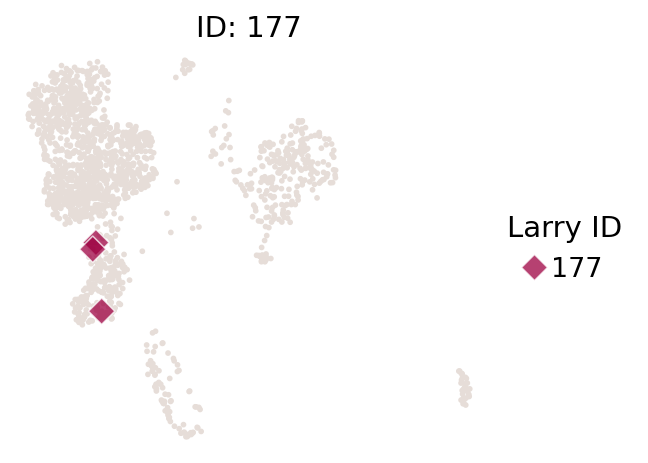

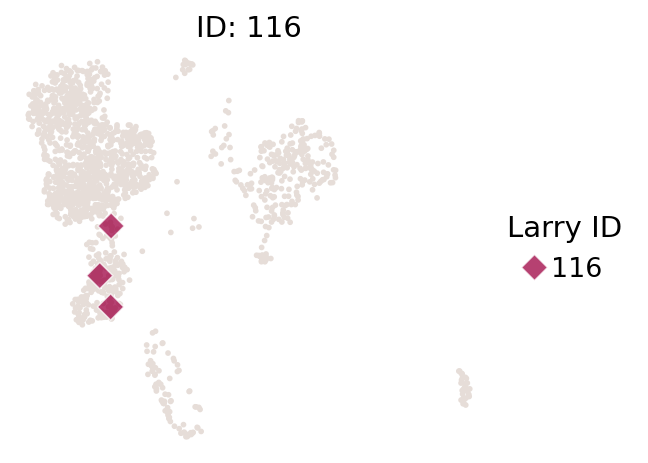

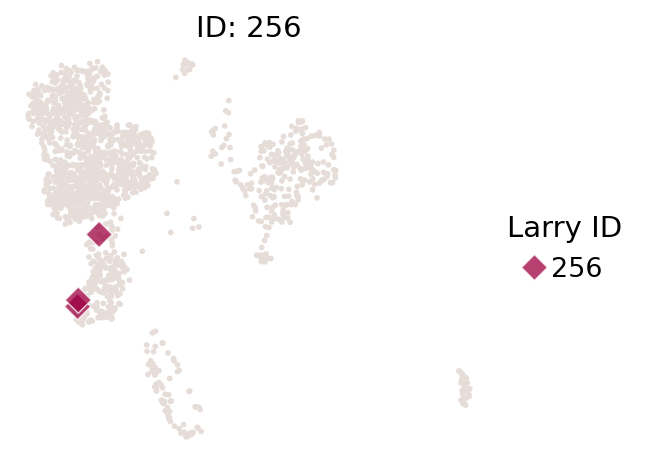

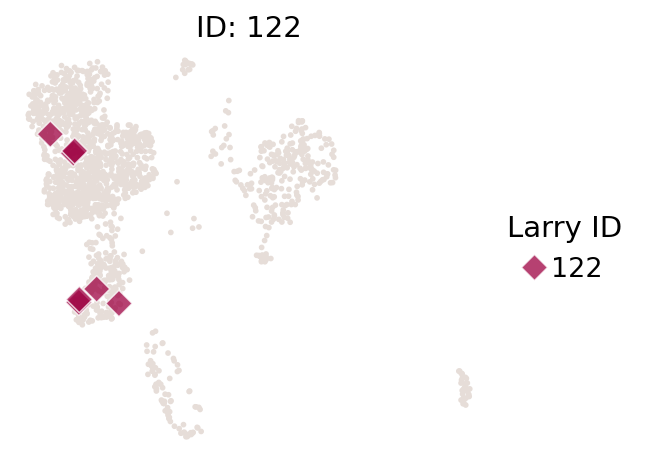

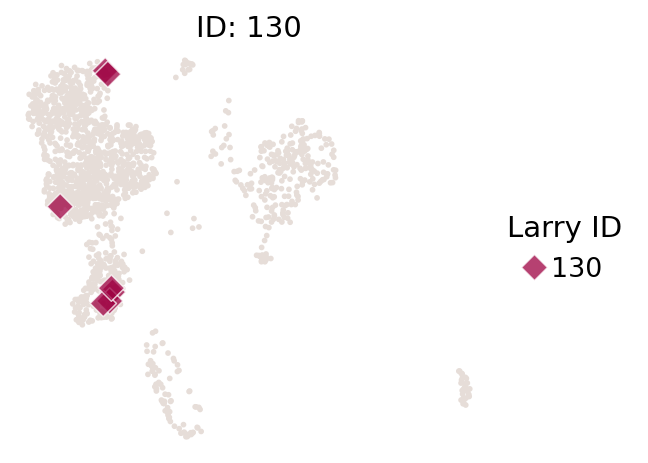

In [126]:

def clones_on_manifold(
    adata,
    selected_clone_list=[0],
    color_list=["red", "blue", "purple", "green", "cyan", "black"],
    selected_annotation_key="time_info",
    selected_annotation_info=None,
    title=None,
    clone_markersize=12,
    clone_markeredgewidth=1,
    markeredgecolor="black",
    **kwargs,
):
    """
    Plot clones on top of state embedding.

    Parameters
    ----------
    adata: :class:`~anndata.AnnData` object
    selected_clone_list: `list`
        List of selected clone ID's.
    color_list: `list`, optional (default: ['red','blue','purple','green','cyan','black'])
        The list of color that defines color at respective time points.
    selected_annotation_info: `list`, optional (default: all)
        Select time points to show corresponding states. If set to be [], use all states.
    title: None
        Default, show the clone id as panel title. Otherwise, show the text string from input 'title'
    clone_markersize: `int`, optional (default: 12)
        Clone marker size
    clone_markeredgewidth: `int`, optional (default: 1)
        Edige size for clone marker
    """

    fig_width = settings.fig_width
    fig_height = settings.fig_height
    point_size = settings.fig_point_size
    x_emb = adata.obsm["X_emb"][:, 0]
    y_emb = adata.obsm["X_emb"][:, 1]
    data_des = adata.uns["data_des"][-1]
    # data_path=settings.data_path
    figure_path = settings.figure_path
    X_clone = adata.obsm["X_clone"]
    time_info = np.array(adata.obs[selected_annotation_key])

    # use only valid time points
    sp_idx = hf.selecting_cells_by_time_points(time_info, selected_annotation_info)
    selected_annotation_info = np.sort(list(set(time_info[sp_idx])))

    selected_clone_list = np.array(selected_clone_list)
    full_id_list = np.arange(X_clone.shape[1])
    valid_idx = np.in1d(full_id_list, selected_clone_list)
    if np.sum(valid_idx) < len(selected_clone_list):
        logg.error(
            f"Valid id range is (0,{X_clone.shape[1]-1}). Please use a smaller ID!"
        )
        selected_clone_list = full_id_list[valid_idx]

    if len(selected_clone_list) == 0:
        logg.error("No valid states selected.")
    else:
        # using all data
        for my_id in selected_clone_list:
            fig = plt.figure(figsize=(fig_width, fig_height))
            ax = plt.subplot(1, 1, 1)
            idx_t = np.zeros(len(time_info), dtype=bool)
            for j, xx in enumerate(selected_annotation_info):
                idx_t0 = time_info == selected_annotation_info[j]
                idx_t = idx_t0 | idx_t

            pl_util.customized_embedding(
                x_emb[idx_t],
                y_emb[idx_t],
                np.zeros(len(y_emb[idx_t])),
                ax=ax,
                point_size=point_size,
            )
            for j, xx in enumerate(selected_annotation_info):
                idx_t = time_info == selected_annotation_info[j]
                idx_clone = X_clone[:, my_id].toarray().flatten() > 0
                # idx = idx_t & idx_clone
                idx = idx_clone

                tmp_d = pd.DataFrame(data={'x':x_emb[idx], 'y':y_emb[idx]})
                tmp_d['Larry ID'] = my_id
                # print(tmp_d)
                # sns.scatterplot(data=tmp_d, x='x', y='y', hue='Larry ID', palette= sns.color_palette("Spectral", as_cmap=True), ax=ax)
                sns.scatterplot(data=tmp_d, x='x', y='y', style='Larry ID', hue='Larry ID', palette= sns.color_palette("Spectral", as_cmap=True), s=80,alpha=0.75, 
                                ax=ax, markers={my_id:'D'})

                
                ax.spines[['top', 'right']].set_visible(False)
                sns.move_legend(ax, bbox_to_anchor=(1, 0.5), loc='center left', frameon=False)

                # ax.plot(
                #     x_emb[idx],
                #     y_emb[idx],
                #     ".",
                #     color=color_list[j % len(color_list)],
                #     label="Larry clone: %s" % (my_id),
                #     markersize=clone_markersize,
                #     markeredgecolor=markeredgecolor,
                #     markeredgewidth=clone_markeredgewidth,
                #     **kwargs,
                # )


                # ax.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
                if title is None:
                    ax.set_title(f"ID: {my_id}")
                else:
                    ax.set_title(title)

            fig.savefig(
                os.path.join(
                    figure_path,
                    f"{data_des}_different_clones_{my_id}.{settings.file_format_figs}",
                )
            )
    return ax


ids = result["clone_id"][:5]
# ids = result["clone_id"][-10:]

clones_on_manifold(
    adata_orig,
    selected_clone_list=ids,
    color_list=["red", "blue", "black"],
    clone_markersize=15,
)

<Axes: title={'center': 'ID: 71'}, xlabel='x', ylabel='y'>

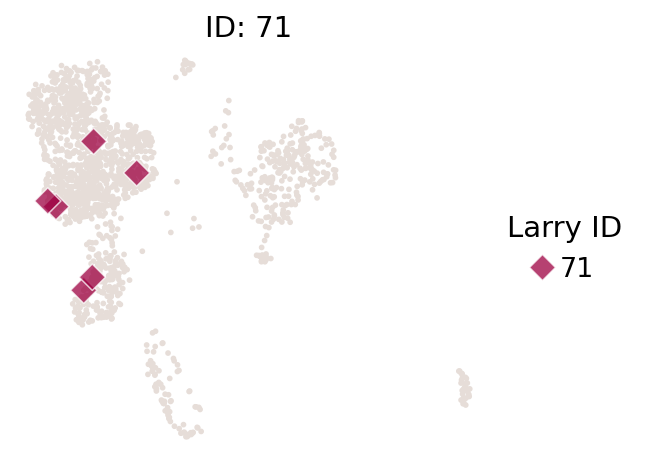

In [127]:
ids = [71]

clones_on_manifold(
    adata_orig,
    selected_clone_list=ids,
    color_list=["red", "blue", "black"],
    clone_markersize=15,
)

In [128]:
l_b = pd.DataFrame(data={"barcode":adata_orig.obs_names})
adata_orig.uns['maester_info'] = pd.merge(l_b, tmp_merge_o, how='left', on='barcode')

In [129]:
# adata_orig.uns['maester_info']

In [130]:
# adata_orig.uns['maester_info']['7402C>T'].apply(lambda x: 1 if x>0.01 else 0)

In [131]:
from matplotlib.patches import Patch

def clones_on_manifold(
    adata,
    selected_clone_list=[0],
    color_list=["red", "blue", "purple", "green", "cyan", "black"],
    selected_annotation_key="time_info",
    selected_annotation_info=None,
    title=None,
    clone_markersize=12,
    clone_markeredgewidth=1,
    markeredgecolor="black",
    **kwargs,
):
    """
    Plot clones on top of state embedding.

    Parameters
    ----------
    adata: :class:`~anndata.AnnData` object
    selected_clone_list: `list`
        List of selected clone ID's.
    color_list: `list`, optional (default: ['red','blue','purple','green','cyan','black'])
        The list of color that defines color at respective time points.
    selected_annotation_info: `list`, optional (default: all)
        Select time points to show corresponding states. If set to be [], use all states.
    title: None
        Default, show the clone id as panel title. Otherwise, show the text string from input 'title'
    clone_markersize: `int`, optional (default: 12)
        Clone marker size
    clone_markeredgewidth: `int`, optional (default: 1)
        Edige size for clone marker
    """

    fig_width = settings.fig_width
    fig_height = settings.fig_height
    point_size = settings.fig_point_size
    x_emb = adata.obsm["X_emb"][:, 0]
    y_emb = adata.obsm["X_emb"][:, 1]
    data_des = adata.uns["data_des"][-1]
    # data_path=settings.data_path
    figure_path = settings.figure_path
    X_clone = adata.obsm["X_clone"]
    time_info = np.array(adata.obs[selected_annotation_key])

    # use only valid time points
    sp_idx = hf.selecting_cells_by_time_points(time_info, selected_annotation_info)
    selected_annotation_info = np.sort(list(set(time_info[sp_idx])))

    selected_clone_list = np.array(selected_clone_list)
    full_id_list = np.arange(X_clone.shape[1])
    valid_idx = np.in1d(full_id_list, selected_clone_list)
    if np.sum(valid_idx) < len(selected_clone_list):
        logg.error(
            f"Valid id range is (0,{X_clone.shape[1]-1}). Please use a smaller ID!"
        )
        selected_clone_list = full_id_list[valid_idx]

    if len(selected_clone_list) == 0:
        logg.error("No valid states selected.")
    else:
        # using all data
        for my_id in selected_clone_list:
            fig = plt.figure(figsize=(fig_width, fig_height))
            ax = plt.subplot(1, 1, 1)
            idx_t = np.zeros(len(time_info), dtype=bool)
            for j, xx in enumerate(selected_annotation_info):
                idx_t0 = time_info == selected_annotation_info[j]
                idx_t = idx_t0 | idx_t

            pl_util.customized_embedding(
                x_emb[idx_t],
                y_emb[idx_t],
                np.zeros(len(y_emb[idx_t])),
                ax=ax,
                point_size=point_size,
            )
            for j, xx in enumerate(selected_annotation_info):
                idx_t = time_info == selected_annotation_info[j]
                idx_clone = X_clone[:, my_id].toarray().flatten() > 0
                # idx = idx_t & idx_clone
                idx = idx_clone
                print(my_id)
                tar_m_col = 'clone'
                tmp_d = pd.DataFrame(data={'x':x_emb[idx], 'y':y_emb[idx], 'MAESTER %s' % (tar_m_col):adata_orig.uns['maester_info'].loc[idx_clone, tar_m_col]})
                tmp_d['Larry ID'] = my_id
                __x = adata.uns['maester_info'].loc[idx_clone]["barcode"]
                print(adata.obs.loc[__x.values])
                # print(tmp_d)
                # oi = sorted(tmp_d['MAESTER %s' % (tar_m_col)].unique().tolist(), key = lambda x : int(x[-1])),  
                sns.scatterplot(data=tmp_d, x='x', y='y', style='Larry ID', hue='MAESTER %s' % (tar_m_col), s=100,alpha=0.75, 
                                ax=ax, markers={my_id:'D'})

                ax.spines[['top', 'right']].set_visible(False)
                sns.move_legend(ax, bbox_to_anchor=(1, 0.5), loc='center left', frameon=False)

                # ax.plot(
                #     x_emb[idx],
                #     y_emb[idx],
                #     ".",
                #     color=color_list[j % len(color_list)],
                #     label="Larry clone: %s" % (my_id),
                #     markersize=clone_markersize,
                #     markeredgecolor=markeredgecolor,
                #     markeredgewidth=clone_markeredgewidth,
                #     **kwargs,
                # )


                # ax.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
                if title is None:
                    ax.set_title(f"ID: {my_id}")
                else:
                    ax.set_title(title)

            fig.savefig(
                os.path.join(
                    figure_path,
                    f"{data_des}_different_clones_{my_id}.{settings.file_format_figs}",
                )
            )
    # return ax
    return __x

l_b = pd.DataFrame(data={"barcode":adata_orig.obs_names})
adata_orig.uns['maester_info'] = pd.merge(l_b, tmp_merge_o, how='left', on='barcode')

# # ids = result["clone_id"][:5]
# ids = result["clone_id"][-10:]

# clones_on_manifold(
#     adata_orig,
#     selected_clone_list=ids,
#     color_list=["red", "blue", "black"],
#     clone_markersize=15,
# )

71
                   time_info state_info
ATCGTGATCCGGACTG-1         1         EC
ATTTCTGAGAAACCAT-1         1         EC
CGGAATTAGGTAGACC-1         1      Fibro
CTCAATTGTGTCTAAC-1         1      Fibro
GCTCAAATCTAGCCTC-1         1      Fibro
TTGTTGTGTTGCACGC-1         1      Fibro


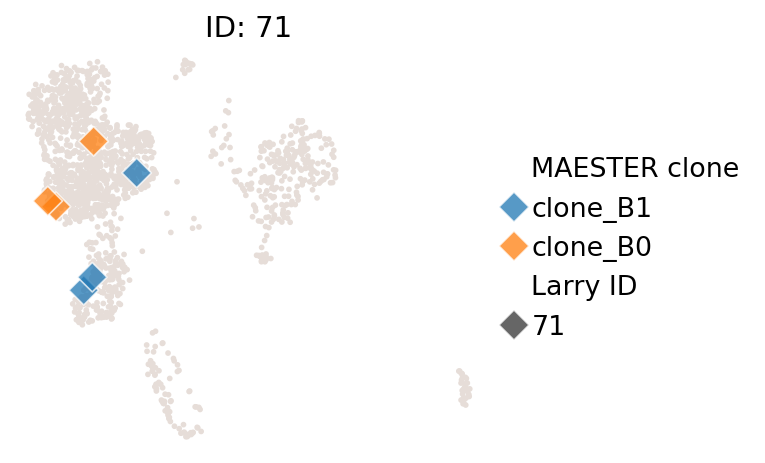

In [132]:
__x = clones_on_manifold(
    adata_orig,
    selected_clone_list=[71],
    color_list=["red", "blue", "black"],
    clone_markersize=15,
)

In [133]:
# _t_df = t_larry_df[t_larry_df['clone'] == adata_orig.uns['clone_id'][17]]
# pd.merge(_t_df, tmp_merge_o, how='left', on='barcode')

In [134]:
# tmp_merge_o

In [135]:
import scvelo as scv

scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

_loom_f = "/autofs/bal31/jhsu/home/projects/sc/data/hemo_paper_larry/larry-maester-d7/larry_barcode/sc/2_bam/velocyto/2_bam.loom"
_loom_f = "/home/jhsu/project/sc/hemo_paper_larry/d8/2_bam.loom"

ldata = sc.read(_loom_f, cache=True)
# adata = scv.utils.merge(_adata, ldata)

Normalized count data: X, spliced, unspliced.
computing neighbors


/var/tmp/pbs.43777.hpc-hn001/ipykernel_12805/802452827.py:4: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(vadata)
/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(


    finished (0:00:14) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


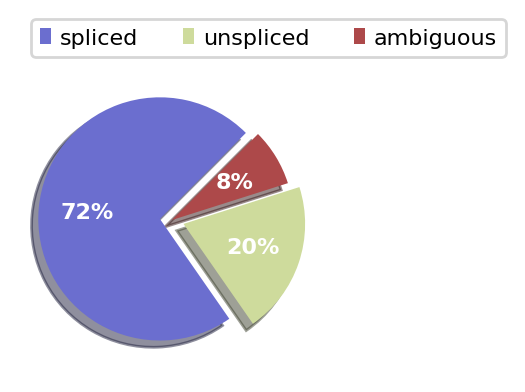

In [136]:
_adata_orig = adata_orig
vadata = scv.utils.merge(_adata_orig, ldata)
scv.pp.filter_and_normalize(vadata, log=False)
scv.pp.moments(vadata)
scv.pl.proportions(vadata)

computing velocities


/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/48 cores)


  0%|          | 0/1674 [00:00<?, ?cells/s]

/home/jhsu/yes/envs/scanpy/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=12805) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:00:17) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_emb', embedded velocity vectors (adata.obsm)


/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/plotting/utils.py:6

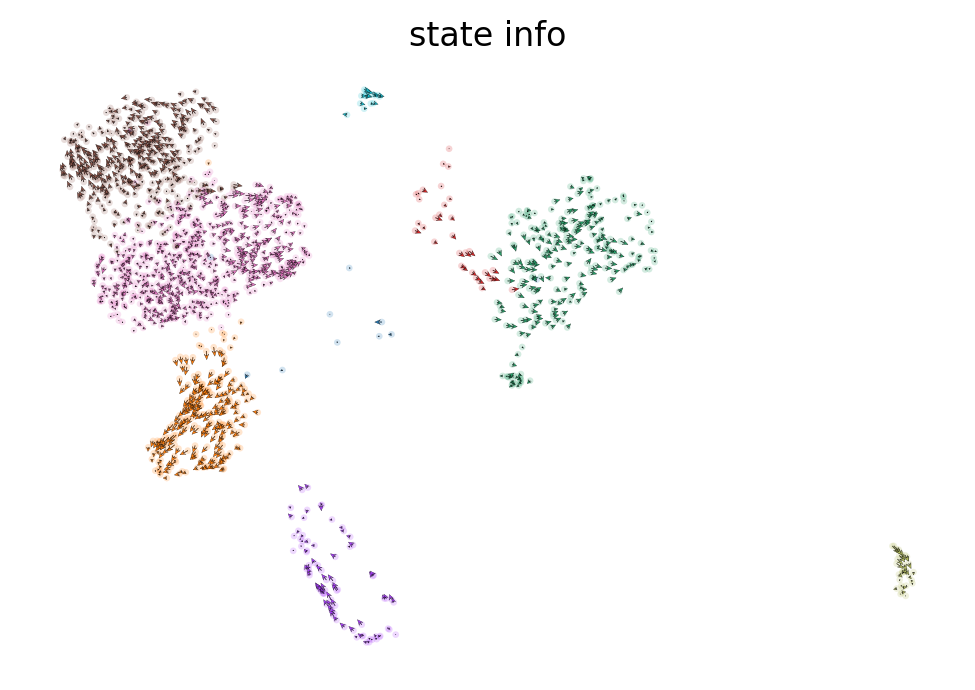

In [137]:
scv.tl.velocity(vadata, mode='stochastic')
scv.tl.velocity_graph(vadata)
scv.pl.velocity_embedding(vadata, basis='X_emb', color="state_info")

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

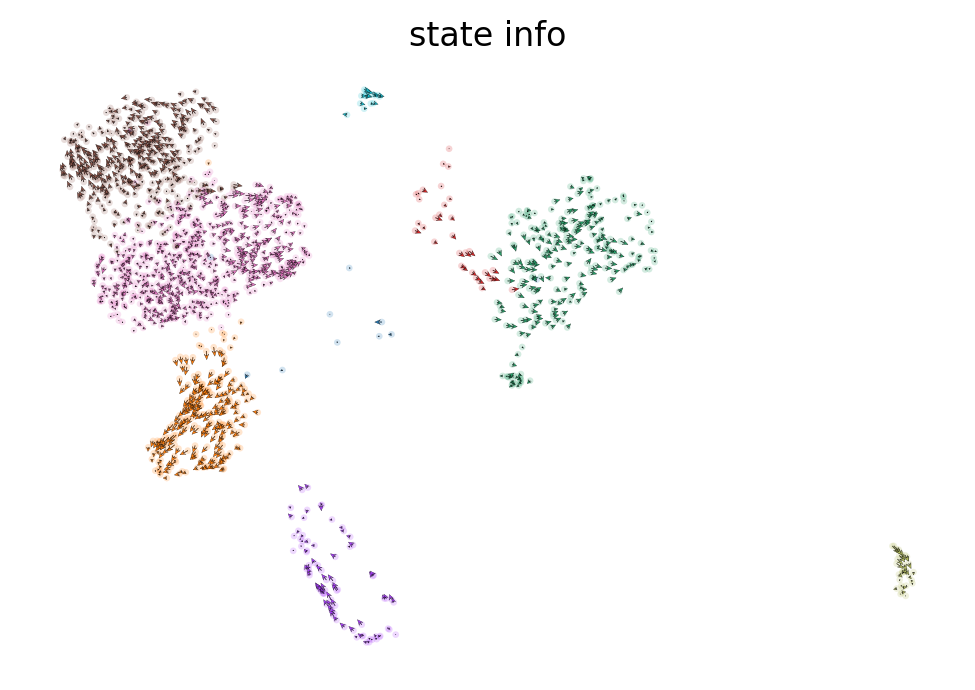

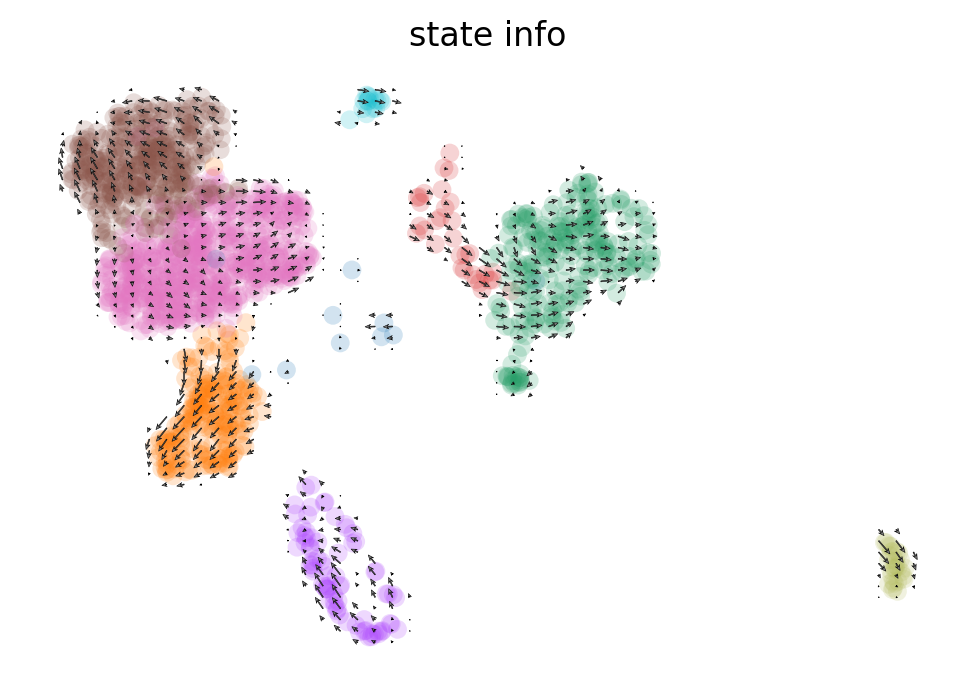

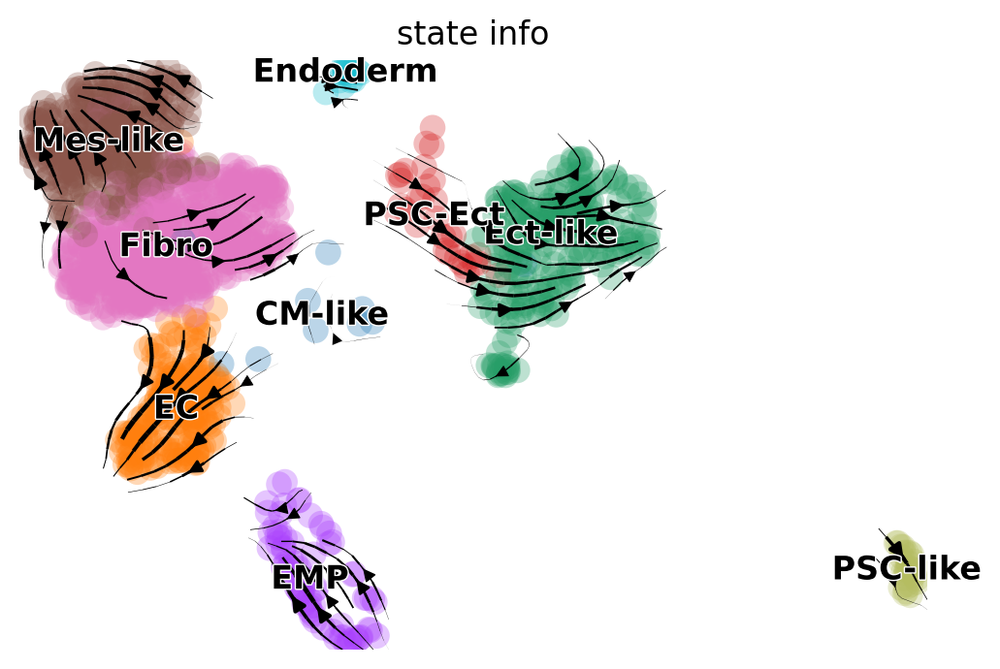

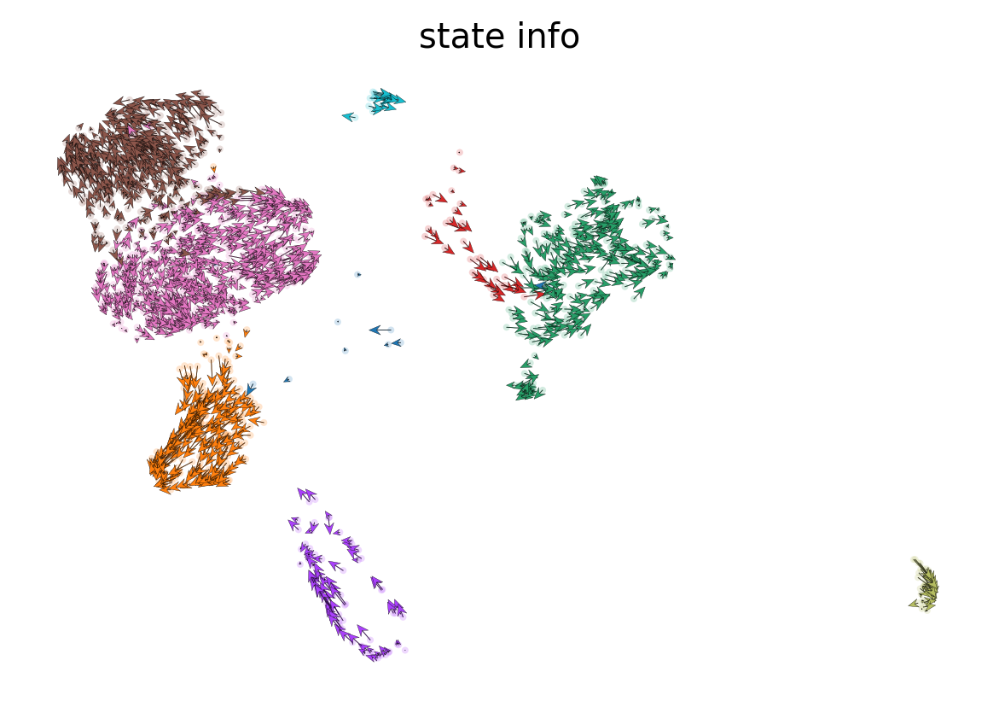

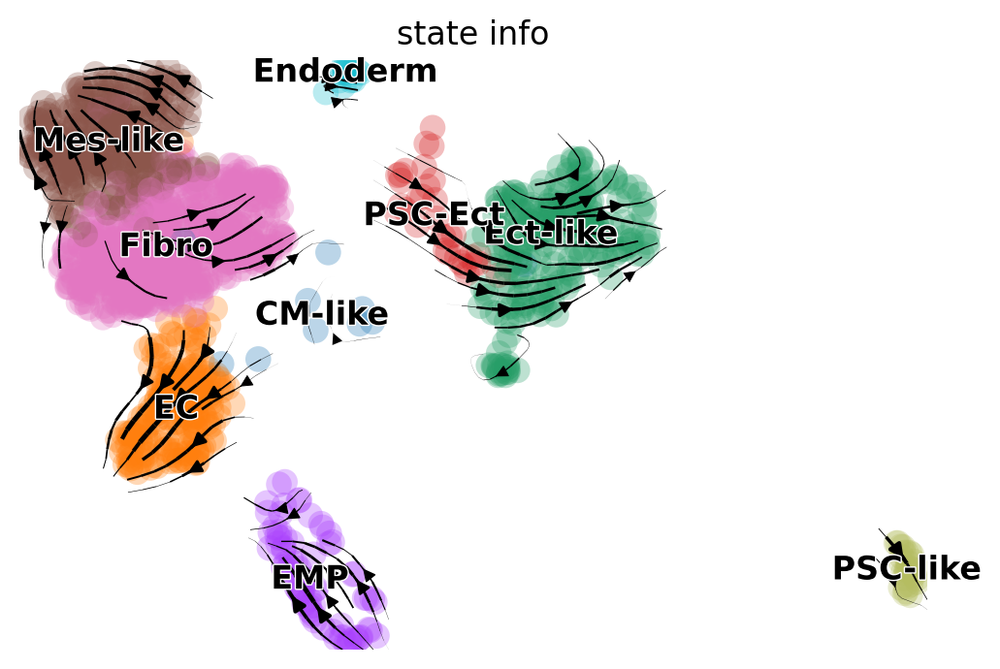

computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


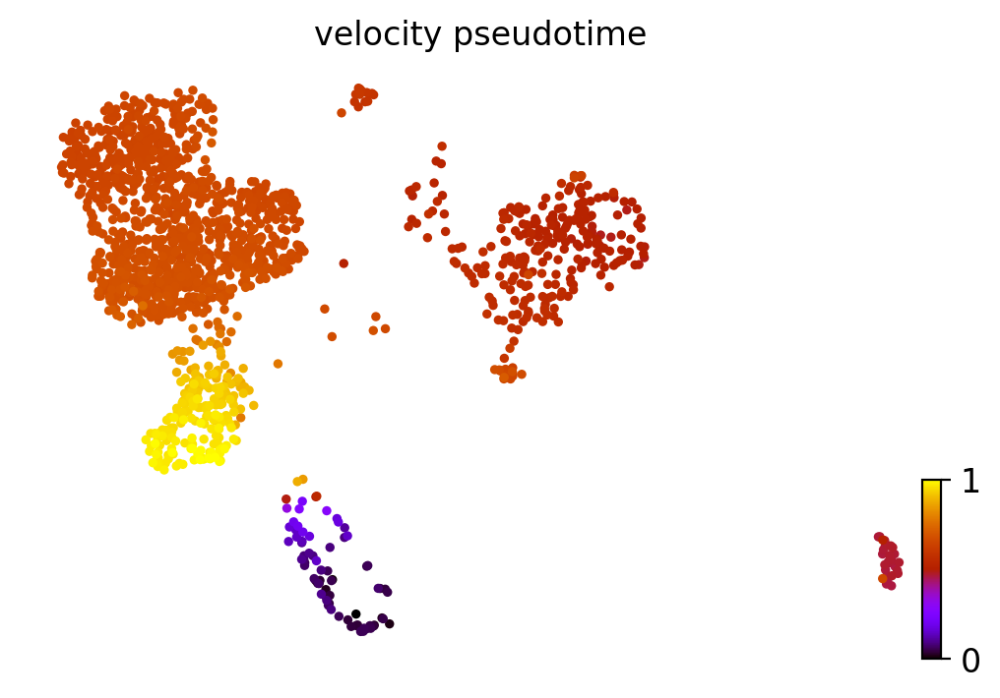

In [138]:
scv.pl.velocity_embedding(vadata, basis='X_emb', color="state_info")
scv.pl.velocity_embedding_grid(vadata, basis='X_emb', color="state_info")
scv.pl.velocity_embedding_stream(vadata, basis='X_emb', color="state_info")
scv.pl.velocity_embedding(vadata, arrow_length=3, arrow_size=2, dpi=120, basis='X_emb', color="state_info")
scv.pl.velocity_embedding_stream(vadata, basis='X_emb', color="state_info")
scv.tl.velocity_pseudotime(vadata)
scv.pl.scatter(vadata, color='velocity_pseudotime', cmap='gnuplot', basis='X_emb', )

In [139]:
# tar_l = ['3085A>G', '3955G>A', '1380G>A', '2501C>A', '1526T>A', '2349G>A', '2352T>A', '1525C>A', '1521T>A', '1522T>A']
tar_l = af_columns
_tmp_af = af_df[tar_l].copy()

_tmp_af[_tmp_af>=0.1] = 1
_tmp_af[_tmp_af<0.1] = 0
_tmp_af = _tmp_af.astype('int')
_tmp_af['barcode'] = af_df['barcode']
_tmp_af.head()

,7402C>T,8628C>T,7116C>T,8829C>T,8177G>A,15016C>A,4216C>T,6300G>A,1380G>A,7635T>C,12115C>T,15374G>A,2571G>A,15070C>A,7244C>T,3860G>A,1868G>A,1352C>T,1123C>A,1526T>A,7312T>C,12090T>G,2502C>A,2702G>A,1389G>A,2349G>A,3174T>A,1525C>A,6848C>T,barcode
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,AAACCCACAAGACAAT-1
1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,AAACCCAGTACAGTTC-1
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,AAACGAACAAGTCCCG-1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,AAACGAACAATTCGTG-1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,AAACGCTCAGCTGAGA-1


In [140]:
m_df = pd.merge(t_larry_df, _tmp_af, how='left', on='barcode').dropna()
m_df.head()

,barcode,clone,7402C>T,8628C>T,7116C>T,8829C>T,8177G>A,15016C>A,4216C>T,6300G>A,1380G>A,7635T>C,12115C>T,15374G>A,2571G>A,15070C>A,7244C>T,3860G>A,1868G>A,1352C>T,1123C>A,1526T>A,7312T>C,12090T>G,2502C>A,2702G>A,1389G>A,2349G>A,3174T>A,1525C>A,6848C>T
0,AAACCCAGTACAGTTC-1,CGTCTGGCCACACGCGACACAGGAACCGGTGATCAGAGAC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,AAACGAACAAGTCCCG-1,CCGCTGACAACATTAAACGTATGACGATGTACCCAGGCAA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,AAACGCTGTTCGTGCG-1,TCCTTGCCGACAACAGACTGTAGACCTAGTTTGGAGCCTA,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,AAAGAACAGCTAGATA-1,AATTTGCATACACCCGACTGTGGATATGGTAAAGAGTAAT-ATAAT...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,AAAGAACCACTCTCGT-1,ATATTGGGCTCACGTGACAACCGATTGAGTCAATAGGTAC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [141]:
t_larry_df.shape, _tmp_af.shape, m_df.shape

((1674, 2), (4172, 30), (1594, 31))

In [142]:
_gy = m_df.groupby(['clone'], as_index=False)
m_cnt_t = _gy.agg({s: 'sum' for s in tar_l})

m_cnt_t['count'] = _gy.size().reset_index()['size']
print(m_cnt_t.shape)
m_cnt_t.head()

(363, 31)


,clone,7402C>T,8628C>T,7116C>T,8829C>T,8177G>A,15016C>A,4216C>T,6300G>A,1380G>A,7635T>C,12115C>T,15374G>A,2571G>A,15070C>A,7244C>T,3860G>A,1868G>A,1352C>T,1123C>A,1526T>A,7312T>C,12090T>G,2502C>A,2702G>A,1389G>A,2349G>A,3174T>A,1525C>A,6848C>T,count
0,AAAATGAGGCCATGCCACTCAAGAAAAGGTATCCAGTCGG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,10
1,AAAATGTGCTCAGGTGACGGCAGAGCTGGTATACAGTAAG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
2,AAAATGTTAGCAAAGTACAAGTGAAATCGTTTCCAGTGAA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12
3,AAAATGTTTACATCAGACGCCTGAAAAAGTCCGCAGCGTA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,AAACTGGAACCAGATCACTGCTGATAAAGTAAAAAGTTTG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


In [143]:
# tar_l = ['3085A>G', '3955G>A', '1380G>A', '2501C>A', '1526T>A', '2349G>A', '2352T>A', '1525C>A', '1521T>A', '1522T>A']
tar_l = af_columns
_tmp_af = af_df[tar_l].copy()

_tmp_af[_tmp_af>=0.1] = 1
_tmp_af[_tmp_af<0.1] = 0
_tmp_af = _tmp_af.astype('int')
_tmp_af['barcode'] = af_df['barcode']
_tmp_af['m_clone'] = tmp_merge_o['clone']
m_df = pd.merge(t_larry_df, _tmp_af, how='left', on='barcode').dropna()
tar_l = tmp_merge_o['clone'].unique().tolist()
for i in tar_l:
    m_df[i] = m_df.apply(lambda x: 1 if x['m_clone'] == i else 0, axis=1)
m_df.head()

,barcode,clone,7402C>T,8628C>T,7116C>T,8829C>T,8177G>A,15016C>A,4216C>T,6300G>A,1380G>A,7635T>C,12115C>T,15374G>A,2571G>A,15070C>A,7244C>T,3860G>A,1868G>A,1352C>T,1123C>A,1526T>A,7312T>C,12090T>G,2502C>A,2702G>A,1389G>A,2349G>A,3174T>A,1525C>A,6848C>T,m_clone,clone_B0,clone_B2,clone_B1,clone_B3
0,AAACCCAGTACAGTTC-1,CGTCTGGCCACACGCGACACAGGAACCGGTGATCAGAGAC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,clone_B2,0,1,0,0
1,AAACGAACAAGTCCCG-1,CCGCTGACAACATTAAACGTATGACGATGTACCCAGGCAA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,clone_B0,1,0,0,0
2,AAACGCTGTTCGTGCG-1,TCCTTGCCGACAACAGACTGTAGACCTAGTTTGGAGCCTA,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,clone_B0,1,0,0,0
3,AAAGAACAGCTAGATA-1,AATTTGCATACACCCGACTGTGGATATGGTAAAGAGTAAT-ATAAT...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,clone_B0,1,0,0,0
4,AAAGAACCACTCTCGT-1,ATATTGGGCTCACGTGACAACCGATTGAGTCAATAGGTAC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,clone_B1,0,0,1,0


In [144]:
tmp_merge_o['clone'].unique().tolist()

['clone_B0', 'clone_B2', 'clone_B1', 'clone_B3']

In [145]:
_gy = m_df.groupby(['clone'], as_index=False)
m_cnt_t = _gy.agg({s: 'sum' for s in tar_l})

m_cnt_t['count'] = _gy.size().reset_index()['size']
print(m_cnt_t.shape)
m_cnt_t.head()

(363, 6)


,clone,clone_B0,clone_B2,clone_B1,clone_B3,count
0,AAAATGAGGCCATGCCACTCAAGAAAAGGTATCCAGTCGG,0,0,7,3,10
1,AAAATGTGCTCAGGTGACGGCAGAGCTGGTATACAGTAAG,1,0,1,0,2
2,AAAATGTTAGCAAAGTACAAGTGAAATCGTTTCCAGTGAA,12,0,0,0,12
3,AAAATGTTTACATCAGACGCCTGAAAAAGTCCGCAGCGTA,0,2,1,0,3
4,AAACTGGAACCAGATCACTGCTGATAAAGTAAAAAGTTTG,2,0,0,0,2


In [146]:
def check_conflict(x, tar_l):
    _mis_m, _m = 0, 0
    for i in tar_l:
        if x[i] == 0:
            continue
        else:
            if x[i] == x['count']:
                _m += 1
            else:
                _mis_m += 1
    if _mis_m == 0:
        return True
    elif _m > 1:
    # elif _m > _mis_m:
        return True
    return False
n_m_cnt_t = m_cnt_t.loc[m_cnt_t.apply(lambda x: check_conflict(x, tar_l), axis=1)]

In [147]:
pd.options.display.max_columns = None

print(n_m_cnt_t.shape)
n_m_cnt_t.head()

(260, 6)


,clone,clone_B0,clone_B2,clone_B1,clone_B3,count
2,AAAATGTTAGCAAAGTACAAGTGAAATCGTTTCCAGTGAA,12,0,0,0,12
4,AAACTGGAACCAGATCACTGCTGATAAAGTAAAAAGTTTG,2,0,0,0,2
5,AAAGTGAAGACAATACACAATCGAGTTAGTCCCTAGAGCT,0,0,26,0,26
6,AAAGTGGGTCCACGCTACATGTGAATCCGTAAGTAGAAAC,0,4,0,0,4
7,AAAGTGTCCCCACCCAACGGCGGACGGGGTGTGAAGACCT,0,5,0,0,5


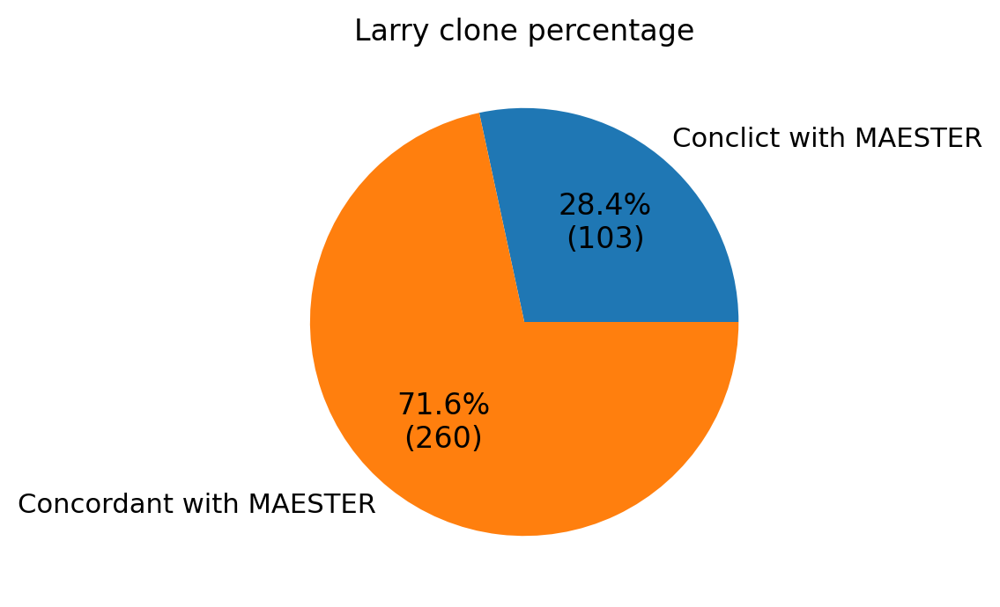

In [148]:
_t1, _t2 = m_cnt_t.shape[0] - n_m_cnt_t.shape[0], n_m_cnt_t.shape[0]
_tmp_p_tb = pd.DataFrame({'number': [_t1, _t2]},
                  index=['Conclict with MAESTER', 'Concordant with MAESTER'])

def autopct_format(values):
    def my_format(pct):
        total = values.sum().values[0]
        val = int(round(pct*total/100.0))
        return '{:.1f}%\n({v:d})'.format(pct, v=val)
    return my_format

# plt.pie(mydata,labels = mylabels, autopct=autopct_format(mydata))

fig, ax = plt.subplots( 
    nrows=1,
    ncols=1,
    figsize=(4, 4)
)
_tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
ax.set_title("Larry clone percentage")
ax.set_ylabel('')
ax.get_legend().remove()

In [149]:
new_tt = m_cnt_t.copy()
new_tt['Cell-fate'] = new_tt.apply(lambda x: "Uni-celltype" if x['clone'] in _tar_df2[_tar_df2['cell_type'] <= 1].index else "Multi-celltype", axis=1)
new_tt['SNP'] =  new_tt.apply(lambda x: "Uni-SNP-clone"if check_conflict(x, tar_l) else "Multi-SNP-clone", axis=1)
new_tt[new_tt['count'] == 1]
new_tt[new_tt['clone'] == "TTGTTGAAGCCAGACCACAGGTGACCGTGTCACAAGCGAC"]
new_tt

,clone,clone_B0,clone_B2,clone_B1,clone_B3,count,Cell-fate,SNP
0,AAAATGAGGCCATGCCACTCAAGAAAAGGTATCCAGTCGG,0,0,7,3,10,Multi-celltype,Multi-SNP-clone
1,AAAATGTGCTCAGGTGACGGCAGAGCTGGTATACAGTAAG,1,0,1,0,2,Multi-celltype,Multi-SNP-clone
2,AAAATGTTAGCAAAGTACAAGTGAAATCGTTTCCAGTGAA,12,0,0,0,12,Multi-celltype,Uni-SNP-clone
3,AAAATGTTTACATCAGACGCCTGAAAAAGTCCGCAGCGTA,0,2,1,0,3,Multi-celltype,Multi-SNP-clone
4,AAACTGGAACCAGATCACTGCTGATAAAGTAAAAAGTTTG,2,0,0,0,2,Uni-celltype,Uni-SNP-clone
...,...,...,...,...,...,...,...,...
358,TTCTTGCCCCCATGTTACCTTCGATTACGTGGAAAGACAA,0,0,4,0,4,Uni-celltype,Uni-SNP-clone
359,TTGCTGTATACAAGAAACAGAAGATAACGTAATGAGATGC,0,0,6,0,6,Multi-celltype,Uni-SNP-clone
360,TTTCTGGTGACACGGAACATGGGAAGATGTAGAAAGGTTT,1,0,0,1,2,Multi-celltype,Multi-SNP-clone
361,TTTGTGAAGACAACGGACCCAAGACAGTGTCCCCAGCCAG,1,1,0,0,2,Uni-celltype,Multi-SNP-clone


In [150]:
new_tt[['Cell-fate']].value_counts(), new_tt[['SNP']].value_counts()

(Cell-fate     
 Multi-celltype    219
 Uni-celltype      144
 Name: count, dtype: int64,
 SNP            
 Uni-SNP-clone      260
 Multi-SNP-clone    103
 Name: count, dtype: int64)

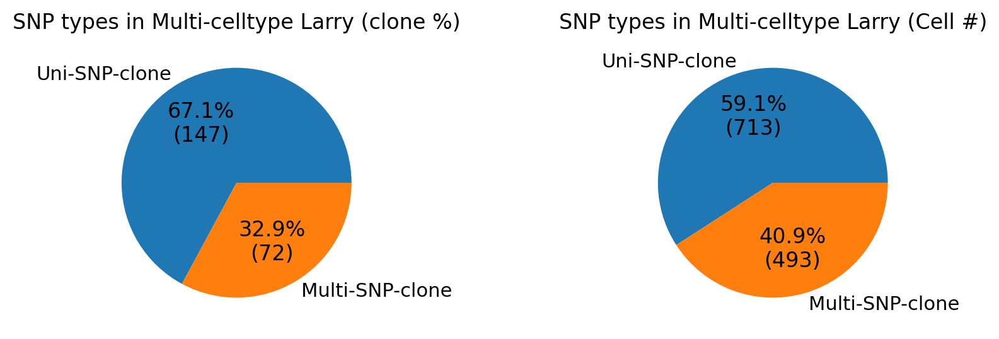

In [151]:

def autopct_format(values):
    def my_format(pct):
        total = values.sum().values[0]
        val = int(round(pct*total/100.0))
        return '{:.1f}%\n({v:d})'.format(pct, v=val)
    return my_format

# plt.pie(mydata,labels = mylabels, autopct=autopct_format(mydata))

fig, axs = plt.subplots( 
    nrows=1,
    ncols=2,
    figsize=(10, 3)
)

ax = axs[0]

_t1 = new_tt[(new_tt['Cell-fate'] == "Multi-celltype") & (new_tt['SNP'] == "Uni-SNP-clone")].shape[0]
_t2 = new_tt[(new_tt['Cell-fate'] == "Multi-celltype") & (new_tt['SNP'] == "Multi-SNP-clone")].shape[0]
_tmp_p_tb = pd.DataFrame({'number': [_t1, _t2]},
                  index=['Uni-SNP-clone', 'Multi-SNP-clone'])


_tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
ax.set_title("SNP types in Multi-celltype Larry (clone %)")
ax.set_ylabel('')
ax.get_legend().remove()

ax = axs[1]

_t1 = new_tt[(new_tt['Cell-fate'] == "Multi-celltype") & (new_tt['SNP'] == "Uni-SNP-clone")]['count'].sum()
_t2 = new_tt[(new_tt['Cell-fate'] == "Multi-celltype") & (new_tt['SNP'] == "Multi-SNP-clone")]['count'].sum()
_tmp_p_tb = pd.DataFrame({'number': [_t1, _t2]},
                  index=['Uni-SNP-clone', 'Multi-SNP-clone'])


_tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
ax.set_title("SNP types in Multi-celltype Larry (Cell #)")
ax.set_ylabel('')
ax.get_legend().remove()

In [152]:
_mm_larry_df = m_df[['barcode', 'clone']]
n_larry_df = _mm_larry_df[_mm_larry_df['clone'].isin(n_m_cnt_t.clone)]

In [153]:
df1 = t_adata.obs['cell_type'].to_frame().reset_index().rename(columns={"index":"barcode"})
df2 = n_larry_df
_tar_df1 = pd.merge(df1, df2, how="inner", on="barcode").dropna()
_tar_df2 = _tar_df1.groupby("clone").agg({ "cell_type": lambda x: x.nunique(), "barcode": 'size'})
_l2_clone_size = len(_tar_df2.index)
_l2_clone_size_cell = _tar_df2.barcode.sum()
_l2_clone_ind_cellfate = len(_tar_df2[_tar_df2['cell_type'] <= 1].index)
_l2_clone_ind_cellfate_cell = _tar_df2[_tar_df2['cell_type'] <= 1].barcode.sum()
_l2_clone_size, _l2_clone_size_cell, _l2_clone_ind_cellfate, _l2_clone_ind_cellfate_cell

(260, 998, 121, 296)

In [154]:
_cmb_df = pd.DataFrame({"": ["Larry only", "Larry with MAESTER"], 
              "Clone number": [_mm_larry_df['clone'].nunique(), _l2_clone_size], 
              "Clones with Ind cell fate": [new_tt[new_tt['Cell-fate'] == "Uni-celltype"].shape[0], _l2_clone_ind_cellfate], 
              "Cell number": [new_tt['count'].sum(), _l2_clone_size_cell], 
              "Cells with Ind cell fate": [new_tt[new_tt['Cell-fate'] == "Uni-celltype"]['count'].sum(), _l2_clone_ind_cellfate_cell]})
_cmb_df['Clones with Ind cell fate %'] = _cmb_df['Clones with Ind cell fate'] / _cmb_df['Clone number'] * 100
_cmb_df['Cells with Ind cell fate %'] = _cmb_df['Cells with Ind cell fate'] / _cmb_df['Cell number'] * 100
_cmb_df

,,Clone number,Clones with Ind cell fate,Cell number,Cells with Ind cell fate,Clones with Ind cell fate %,Cells with Ind cell fate %
0,Larry only,363,144,1594,388,39.669421,24.341280
1,Larry with MAESTER,260,121,998,296,46.538462,29.659319


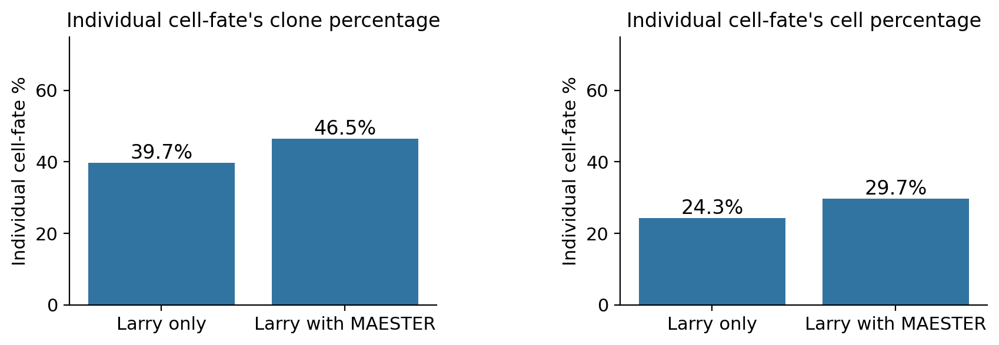

In [155]:
fig, axs = plt.subplots( 
    nrows=1,
    ncols=2,
    figsize=(10, 3)
)

ax = axs[0]
sns.barplot(_cmb_df, y='Clones with Ind cell fate %', x="", ax=ax)

# _tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
ax.set_title("Individual cell-fate's clone percentage")
ax.set_ylabel('Individual cell-fate %')
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%')

ax.set(ylim=(0, 75))

ax = axs[1]
sns.barplot(_cmb_df, y='Cells with Ind cell fate %', x="", ax=ax)

# _tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
ax.set_title("Individual cell-fate's cell percentage")
ax.set_ylabel('Individual cell-fate %')
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%')

ax.set(ylim=(0, 75))

fig.subplots_adjust(wspace=0.5)


46.53846153846154


(0.0, 60.0)

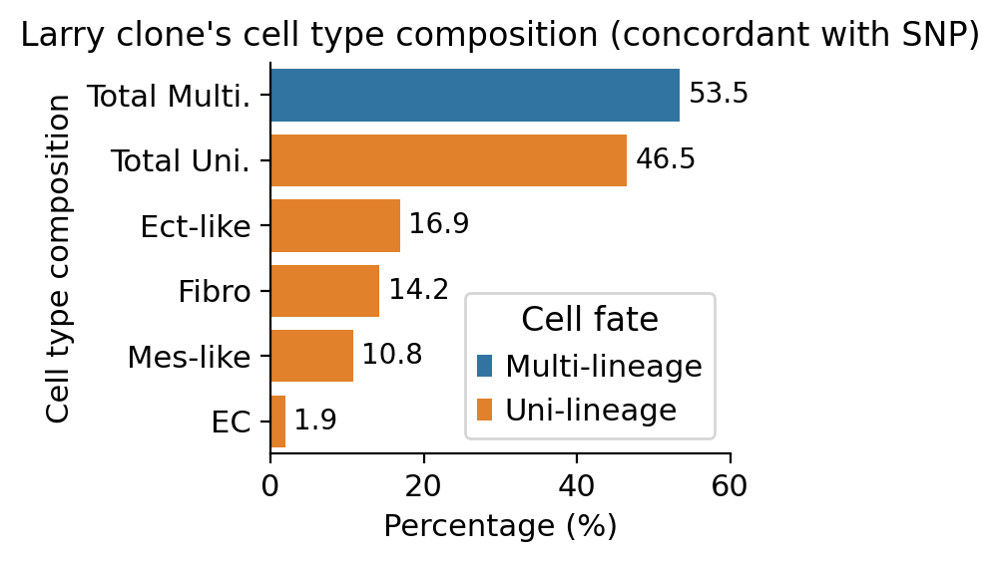

In [156]:
# _tar_df1
_m = {'Mes-like': "ML", "PSC-Ect":"PE", "EC":"EC", "Fibro":"FB", "Mes-PS": "MS", "PSC-like":"PL", "Endoderm":"En", "TB-like":"TL"}
# _tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: _m[x])
_tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: x)
        
new_tar_df1 = _tar_df1.groupby("clone").agg({'cell_type_s': lambda s: "%s" % (",".join(sorted(set(s))))})['cell_type_s'].value_counts().to_frame().reset_index()
new_tar_df1['percentage'] = new_tar_df1['count'].apply(lambda x: x/new_tar_df1['count'].sum() * 100)
new_tar_df1['Cell fate'] = new_tar_df1.cell_type_s.apply(lambda x: 
            "Uni-lineage" if len(set(x.split(','))) == 1 else "Multi-lineage")


_tar_tt =  "Uni-lineage"

_pp_1 = new_tar_df1[new_tar_df1['Cell fate'] == _tar_tt].percentage.sum()
print(_pp_1)
new_tar_df1 = new_tar_df1[new_tar_df1['Cell fate'] ==_tar_tt]
def insert(df, row):
    insert_loc = df.index.max()

    if pd.isna(insert_loc):
        df.loc[0] = row
    else:
        df.loc[insert_loc + 1] = row

new_tar_df1.loc[-1] = ["Total Uni.", 1000, _pp_1, _tar_tt] # adding a row
new_tar_df1.index = new_tar_df1.index + 1  # shifting index
new_tar_df1 = new_tar_df1.sort_index()  # sorting by index



_pp_1 = 100-_pp_1
_tar_tt =  "Multi-lineage"
new_tar_df1.loc[-1] = ["Total Multi.", 1000, _pp_1, _tar_tt] # adding a row
new_tar_df1.index = new_tar_df1.index + 1  # shifting index
new_tar_df1 = new_tar_df1.sort_index()  # sorting by index


fig, ax = plt.subplots( 
    nrows=1,
    ncols=1,
    figsize=(4, 3))

# ax = axs[0]
# sns.barplot(new_tar_df1[new_tar_df1['count'] >3], y='cell_type_s', x='count', hue='Cell fate', ax=ax)
sns.barplot(new_tar_df1[new_tar_df1['count'] >=3], y='cell_type_s', x='percentage', hue="Cell fate", ax=ax)
# _tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
# ax.set_title("Cell type composition over Larry clone")
# ax.set_ylabel('Cell type composition')
# ax.locator_params(integer=True)
# ax.legend(loc='center right', bbox_to_anchor=(1.25, 0.5), ncol=1)

ax.set_ylabel('Cell type composition')
ax.set_xlabel('Percentage (%)')
# ax.set_ylabel('Uni-lineage cell type')
# ax.yaxis.set_tick_params(labelsize=8)
ax.bar_label(ax.containers[-1], fmt='%.1f', fontsize=10, padding=3)
ax.bar_label(ax.containers[-2], fmt='%.1f', fontsize=10, padding=3)

ax.set_title("Larry clone's cell type composition (concordant with SNP)")



fig.tight_layout()
plt.xlim(0, 60)

46.53846153846154


(0.0, 60.0)

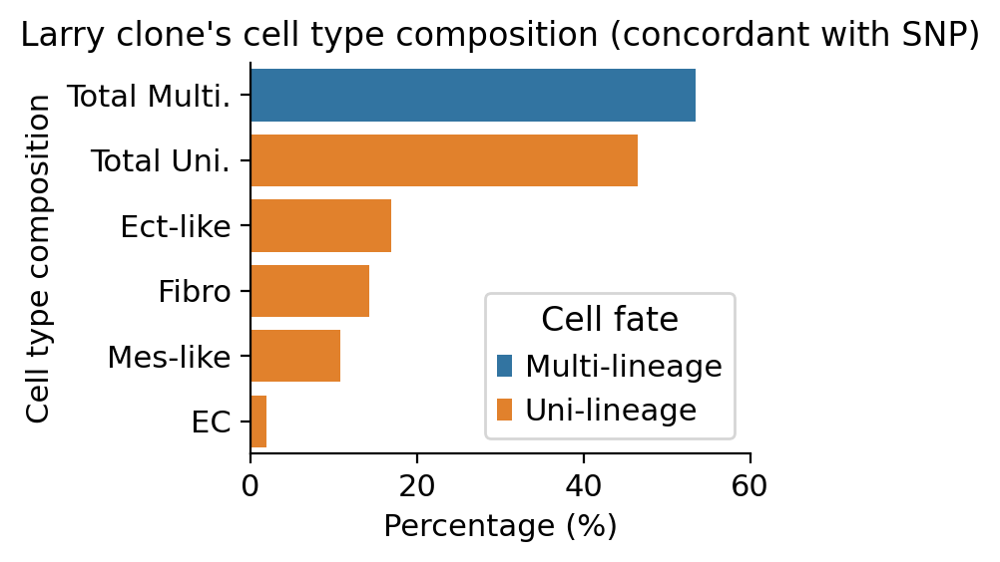

In [157]:
# _tar_df1
_m = {'Mes-like': "ML", "PSC-Ect":"PE", "EC":"EC", "Fibro":"FB", "Mes-PS": "MS", "PSC-like":"PL", "Endoderm":"En", "TB-like":"TL"}
# _tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: _m[x])
_tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: x)
        
new_tar_df1 = _tar_df1.groupby("clone").agg({'cell_type_s': lambda s: "%s" % (",".join(sorted(set(s))))})['cell_type_s'].value_counts().to_frame().reset_index()
new_tar_df1['percentage'] = new_tar_df1['count'].apply(lambda x: x/new_tar_df1['count'].sum() * 100)
new_tar_df1['Cell fate'] = new_tar_df1.cell_type_s.apply(lambda x: 
            "Uni-lineage" if len(set(x.split(','))) == 1 else "Multi-lineage")


_tar_tt =  "Uni-lineage"

_pp_1 = new_tar_df1[new_tar_df1['Cell fate'] == _tar_tt].percentage.sum()
print(_pp_1)
new_tar_df1 = new_tar_df1[new_tar_df1['Cell fate'] ==_tar_tt]
def insert(df, row):
    insert_loc = df.index.max()

    if pd.isna(insert_loc):
        df.loc[0] = row
    else:
        df.loc[insert_loc + 1] = row

new_tar_df1.loc[-1] = ["Total Uni.", 1000, _pp_1, _tar_tt] # adding a row
new_tar_df1.index = new_tar_df1.index + 1  # shifting index
new_tar_df1 = new_tar_df1.sort_index()  # sorting by index



_pp_1 = 100-_pp_1
_tar_tt =  "Multi-lineage"
new_tar_df1.loc[-1] = ["Total Multi.", 1000, _pp_1, _tar_tt] # adding a row
new_tar_df1.index = new_tar_df1.index + 1  # shifting index
new_tar_df1 = new_tar_df1.sort_index()  # sorting by index


fig, ax = plt.subplots( 
    nrows=1,
    ncols=1,
    figsize=(4, 3))

# ax = axs[0]
# sns.barplot(new_tar_df1[new_tar_df1['count'] >3], y='cell_type_s', x='count', hue='Cell fate', ax=ax)
sns.barplot(new_tar_df1[new_tar_df1['count'] >=3], y='cell_type_s', x='percentage', hue="Cell fate", ax=ax)
# _tmp_p_tb.plot(kind='pie', y='number', autopct=autopct_format(_tmp_p_tb), ax=ax)
# ax.set_title("Cell type composition over Larry clone")
# ax.set_ylabel('Cell type composition')
# ax.locator_params(integer=True)
# ax.legend(loc='center right', bbox_to_anchor=(1.25, 0.5), ncol=1)

ax.set_ylabel('Cell type composition')
ax.set_xlabel('Percentage (%)')
# ax.set_ylabel('Uni-lineage cell type')
# ax.yaxis.set_tick_params(labelsize=8)
# ax.bar_label(ax.containers[-1], fmt='%.1f', fontsize=10, padding=3)
# ax.bar_label(ax.containers[-2], fmt='%.1f', fontsize=10, padding=3)

ax.set_title("Larry clone's cell type composition (concordant with SNP)")



fig.tight_layout()
plt.xlim(0, 60)

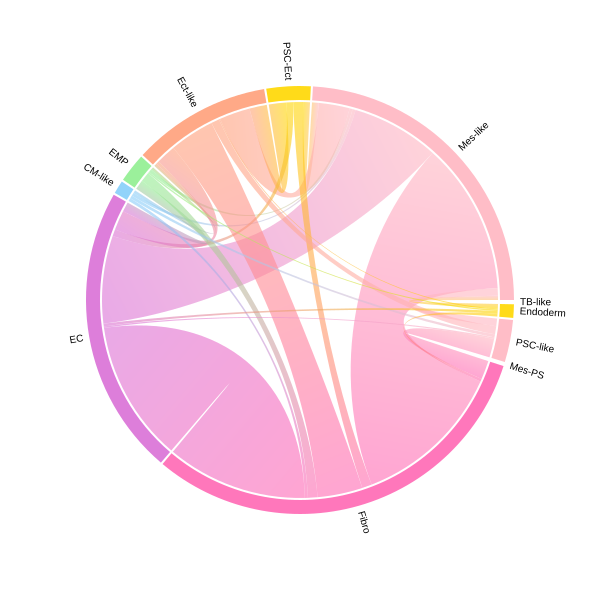

In [158]:
# _tar_df1
# _m = {'Mes-like': "ML", "PSC-Ect":"PE", "EC":"EC", "Fibro":"FB", "Mes-PS": "MS", "PSC-like":"PL", "Endoderm":"En", "TB-like":"TL"}
_m = {'Mes-like': "ML", "PSC-Ect":"PE", "Ect-like":"EL", "EMP":"EMP", "CM-like":"CL", "EC":"EC", "Fibro":"FB", "Mes-PS": "MS", "PSC-like":"PL", "Endoderm":"En", "TB-like":"TL"}
_tar_df1['cell_type_s'] = _tar_df1.cell_type.apply(lambda x: _m[x])
        
new_tar_df1 = _tar_df1.groupby("clone").agg({'cell_type': lambda s: "%s" % (",".join(sorted(s)))})['cell_type'].value_counts().to_frame().reset_index()
tar_lst = list(_m.keys())
tar_lst_m = {v: i for i, v in enumerate(tar_lst)}
tar_lst_mat = np.zeros((len(tar_lst), len(tar_lst)))

for index, row in new_tar_df1.iterrows():
    _tt1, _tt2 = row['cell_type'], row['count']
    _n_tt1 = list(set(_tt1.split(',')))
    _n_tt1_n = len(_n_tt1)
    if _n_tt1_n > 1:
        for _i in range(_n_tt1_n):
            for _j in range(_n_tt1_n):
                if _i > _j:
                  tar_lst_mat[tar_lst_m[_n_tt1[_i]], tar_lst_m[_n_tt1[_j]]] += (_tt2/_n_tt1_n)
tar_lst_mat = tar_lst_mat + tar_lst_mat.T

import openchord as ocd

adjacency_matrix = tar_lst_mat
labels = tar_lst

fig = ocd.Chord(adjacency_matrix, labels)
fig.plot_area = {"x": -300, "y": -300, "w": 600, "h": 600}
fig.show()

In [159]:
new_tt[(new_tt['Cell-fate'] == "Multi-celltype") & (new_tt['SNP'] == "Uni-SNP-clone")]['clone']

2      AAAATGTTAGCAAAGTACAAGTGAAATCGTTTCCAGTGAA
5      AAAGTGAAGACAATACACAATCGAGTTAGTCCCTAGAGCT
6      AAAGTGGGTCCACGCTACATGTGAATCCGTAAGTAGAAAC
10     AAATTGTAGACAGCCAACCATGGAAAATGTTATCAGAAAT
11     AAATTGTTAGCAACACACGGTCGAACAAGTAGACAGTCAA
                         ...                   
352    TTACTGTACGCAGGCTACTGTCGACGGTGTACCCAGGAGG
354    TTATTGACTACAGACAACCATGGACCATGTATCCAGAATC
357    TTCATGTCACCAGCTTACAATTGATAGAGTTCCTAGACAC
359    TTGCTGTATACAAGAAACAGAAGATAACGTAATGAGATGC
362    TTTGTGCACACACGATACGACAGACATTGTGATCAGCCAA
Name: clone, Length: 147, dtype: object

In [160]:
_tar_df1

,barcode,cell_type,clone,cell_type_s
0,AAACGAACAAGTCCCG-1,PSC-Ect,CCGCTGACAACATTAAACGTATGACGATGTACCCAGGCAA,PE
1,AAACGCTGTTCGTGCG-1,Mes-like,TCCTTGCCGACAACAGACTGTAGACCTAGTTTGGAGCCTA,ML
2,AAAGAACCACTCTCGT-1,Fibro,ATATTGGGCTCACGTGACAACCGATTGAGTCAATAGGTAC,FB
3,AAAGAACTCCCAATAG-1,Fibro,AAATTGTAGACAGCCAACCATGGAAAATGTTATCAGAAAT,FB
4,AAAGGATCAACCTAAC-1,Mes-like,CCAATGCCAACAACCCACCTGTGAAAACGTTATGAGACAA,ML
...,...,...,...,...
993,TTTCCTCAGGTGCTTT-1,EC,GGGGTGAGAGCATCACACCGAAGACGGGGTCCGCAGCAGG,EC
994,TTTCCTCGTTGTGTTG-1,Mes-like,AACTTGGTCACACCGGACAAAGGACTCCGTTCCTAGCGCC,ML
995,TTTCGATCAGCCTTCT-1,EC,GGTGTGACTACATAATACTCTAGAGTAAGTCTTGAGATAG,EC
996,TTTGGAGTCGATTGAC-1,Fibro,AAAGTGAAGACAATACACAATCGAGTTAGTCCCTAGAGCT,FB


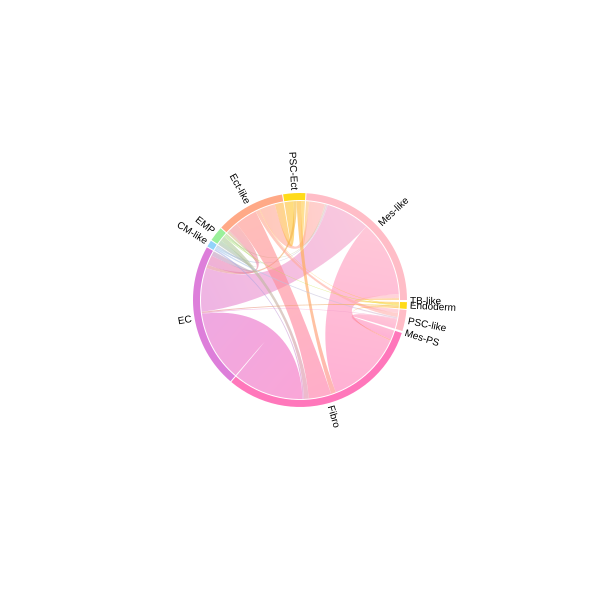

In [161]:
# _tar_df1
# _m = {'Mes-like': "ML", "PSC-Ect":"PE", "EC":"EC", "Fibro":"FB", "Mes-PS": "MS", "PSC-like":"PL", "Endoderm":"En", "TB-like":"TL"}
_m = {'Mes-like': "ML", "PSC-Ect":"PE", "Ect-like":"EL", "EMP":"EMP", "CM-like":"CL", "EC":"EC", "Fibro":"FB", "Mes-PS": "MS", "PSC-like":"PL", "Endoderm":"En", "TB-like":"TL"}
__tar_df1 = _tar_df1[_tar_df1['clone'].isin(new_tt[(new_tt['Cell-fate'] == "Multi-celltype") & (new_tt['SNP'] == "Uni-SNP-clone")]['clone'])]
__tar_df1['cell_type_s'] = __tar_df1.cell_type.apply(lambda x: _m[x])
        
new_tar_df1 = __tar_df1.groupby("clone").agg({'cell_type': lambda s: "%s" % (",".join(sorted(s)))})['cell_type'].value_counts().to_frame().reset_index()
tar_lst = list(_m.keys())
tar_lst_m = {v: i for i, v in enumerate(tar_lst)}
tar_lst_mat = np.zeros((len(tar_lst), len(tar_lst)))

for index, row in new_tar_df1.iterrows():
    _tt1, _tt2 = row['cell_type'], row['count']
    _n_tt1 = list(set(_tt1.split(',')))
    _n_tt1_n = len(_n_tt1)
    if _n_tt1_n > 1:
        for _i in range(_n_tt1_n):
            for _j in range(_n_tt1_n):
                if _i > _j:
                  tar_lst_mat[tar_lst_m[_n_tt1[_i]], tar_lst_m[_n_tt1[_j]]] += (_tt2/_n_tt1_n)
tar_lst_mat = tar_lst_mat + tar_lst_mat.T

import openchord as ocd

adjacency_matrix = tar_lst_mat
labels = tar_lst

fig = ocd.Chord(adjacency_matrix, labels)
fig.radius = 100

fig.plot_area = {"x": -300, "y": -300, "w": 600, "h": 600}
fig.show()

In [162]:
_tar_df1[_tar_df1['clone'].isin(new_tt[(new_tt['Cell-fate'] == "Multi-celltype") & (new_tt['SNP'] == "Uni-SNP-clone")]['clone'])]

,barcode,cell_type,clone,cell_type_s
0,AAACGAACAAGTCCCG-1,PSC-Ect,CCGCTGACAACATTAAACGTATGACGATGTACCCAGGCAA,PE
1,AAACGCTGTTCGTGCG-1,Mes-like,TCCTTGCCGACAACAGACTGTAGACCTAGTTTGGAGCCTA,ML
3,AAAGAACTCCCAATAG-1,Fibro,AAATTGTAGACAGCCAACCATGGAAAATGTTATCAGAAAT,FB
6,AAAGGATGTTTACCAG-1,Fibro,CATGTGCCAGCAATGAACTAGTGAATCCGTACCTAGACGC,FB
7,AAAGGGCAGAGCAAGA-1,Fibro,ACTTTGAGTCCAGCACACTGCTGAGAAAGTATGAAGTCCC,FB
...,...,...,...,...
993,TTTCCTCAGGTGCTTT-1,EC,GGGGTGAGAGCATCACACCGAAGACGGGGTCCGCAGCAGG,EC
994,TTTCCTCGTTGTGTTG-1,Mes-like,AACTTGGTCACACCGGACAAAGGACTCCGTTCCTAGCGCC,ML
995,TTTCGATCAGCCTTCT-1,EC,GGTGTGACTACATAATACTCTAGAGTAAGTCTTGAGATAG,EC
996,TTTGGAGTCGATTGAC-1,Fibro,AAAGTGAAGACAATACACAATCGAGTTAGTCCCTAGAGCT,FB


In [163]:
_tar_df1

,barcode,cell_type,clone,cell_type_s
0,AAACGAACAAGTCCCG-1,PSC-Ect,CCGCTGACAACATTAAACGTATGACGATGTACCCAGGCAA,PE
1,AAACGCTGTTCGTGCG-1,Mes-like,TCCTTGCCGACAACAGACTGTAGACCTAGTTTGGAGCCTA,ML
2,AAAGAACCACTCTCGT-1,Fibro,ATATTGGGCTCACGTGACAACCGATTGAGTCAATAGGTAC,FB
3,AAAGAACTCCCAATAG-1,Fibro,AAATTGTAGACAGCCAACCATGGAAAATGTTATCAGAAAT,FB
4,AAAGGATCAACCTAAC-1,Mes-like,CCAATGCCAACAACCCACCTGTGAAAACGTTATGAGACAA,ML
...,...,...,...,...
993,TTTCCTCAGGTGCTTT-1,EC,GGGGTGAGAGCATCACACCGAAGACGGGGTCCGCAGCAGG,EC
994,TTTCCTCGTTGTGTTG-1,Mes-like,AACTTGGTCACACCGGACAAAGGACTCCGTTCCTAGCGCC,ML
995,TTTCGATCAGCCTTCT-1,EC,GGTGTGACTACATAATACTCTAGAGTAAGTCTTGAGATAG,EC
996,TTTGGAGTCGATTGAC-1,Fibro,AAAGTGAAGACAATACACAATCGAGTTAGTCCCTAGAGCT,FB


In [164]:
t_adata = adata[adata.obs_names.isin(n_larry_df.barcode)]

t_df_time = pd.DataFrame(data={'time_info': [1] * len(t_adata.obs_names)})
t_df_time.head()
n_adata_orig = cs.pp.initialize_adata_object(
    X_state=t_adata.layers['counts'],
    gene_names=t_adata.var_names,
    cell_names=t_adata.obs_names,
    time_info=t_df_time["time_info"],
    state_info=t_adata.obs['cell_type'],
    X_emb=t_adata.obsm['X_umap'],
    X_pca =t_adata.obsm['X_pca'],
    data_des="my_data",
)

Create new anndata object
Time points with clonal info: []


In [165]:
cs.pp.get_X_clone(n_adata_orig, n_larry_df["barcode"], n_larry_df["clone"])

100%|██████████| 998/998 [00:00<00:00, 1869546.85it/s]

reorder clones


Text(0.5, 1.0, 'D8 dataset, concordant cell in LARRY and MAESTER')

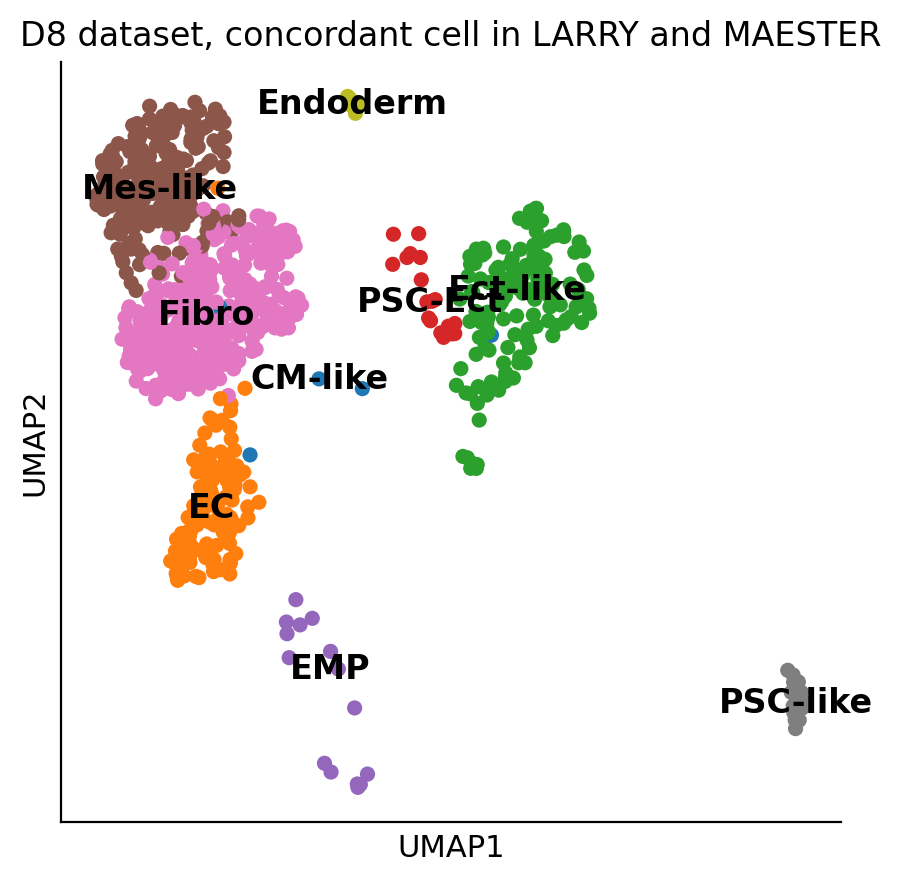

In [168]:
fig, ax = plt.subplots(figsize=(5, 5))
ax = sc.pl.embedding (n_adata_orig, basis="X_emb",  color="state_info", legend_loc="on data", show=False, ax=ax, size=120)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title('D8 dataset, concordant cell in LARRY and MAESTER')

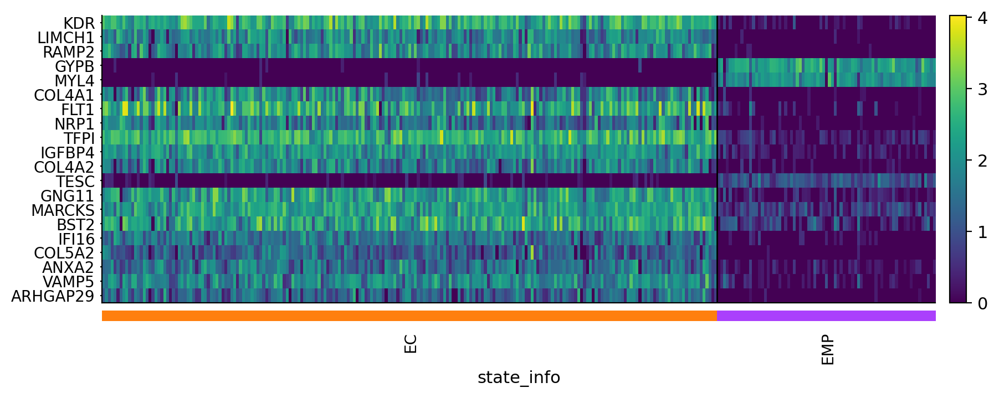

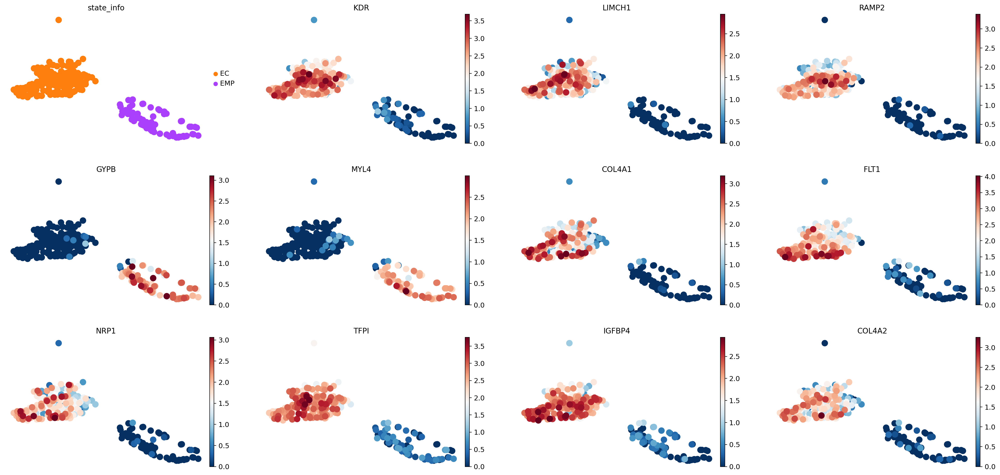

In [169]:

# Create a clean subset without any dimension-dependent data
clean_sub = vadata.copy()

# Remove all neighborhood-related data
for key in ['neighbors', 'umap', 'pca']:
    if key in clean_sub.uns:
        del clean_sub.uns[key]
        
for key in list(clean_sub.obsp.keys()):
    del clean_sub.obsp[key]


_tg = ['EC','EMP']
adata_sub = clean_sub[clean_sub.obs['state_info'].isin(_tg)].copy()

    
sc.tl.rank_genes_groups(adata_sub, groupby='state_info', groups=[_tg[1]], reference=_tg[0], method='wilcoxon')

degs = sc.get.rank_genes_groups_df(adata_sub, group=_tg[1])
df = degs
df['-log10(pvals_adj)'] = -np.log10(df['pvals_adj'])
# Get the top 20 DEGs (by absolute log fold change or by adjusted p-value) for example
top_genes = df.sort_values('pvals_adj').head(20)['names'].tolist()

sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)

# Now plot the heatmap for the top genes
sc.pl.heatmap(adata_sub, var_names=top_genes, groupby='state_info', cmap='viridis', dendrogram=False, swap_axes=True, use_raw=False)

sc.pl.embedding(
    adata_sub,
    basis='X_emb',
    color=['state_info'] + top_genes[:11],
    ncols=4,
    color_map='RdBu_r',
    use_raw=False,
    frameon=False,
)


In [174]:
# save result
results_file = filedir + "/rst_d8_f.h5ad"
print(results_file)
t_adata.write(results_file, compression="gzip")

/home/jhsu/project/sc/hemo_paper_larry/d8//rst_d8_f.h5ad


Data saved at adata.uns['barcode_heatmap']


<Axes: title={'center': '260 clones'}>

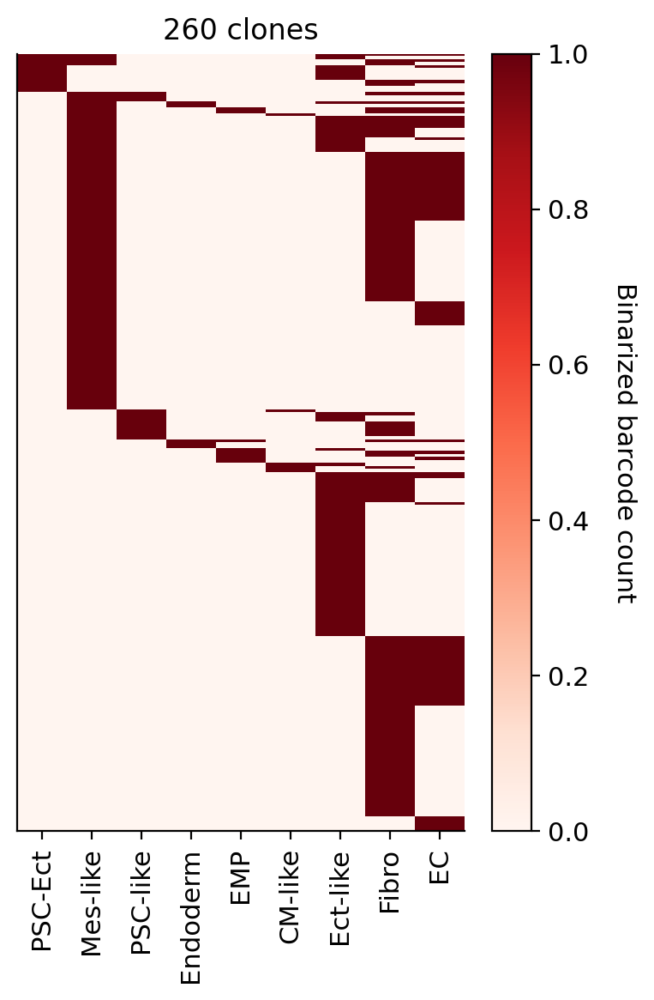

In [170]:
selected_times = None

cs.pl.barcode_heatmap(
    n_adata_orig,
    color_bar=True,
    log_transform=False,
    binarize=True,
)

normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
Results saved as dictionary at adata.uns['fate_coupling_X_clone']


Text(0.5, 1.0, 'Fate coupling score based on LARRY clone')

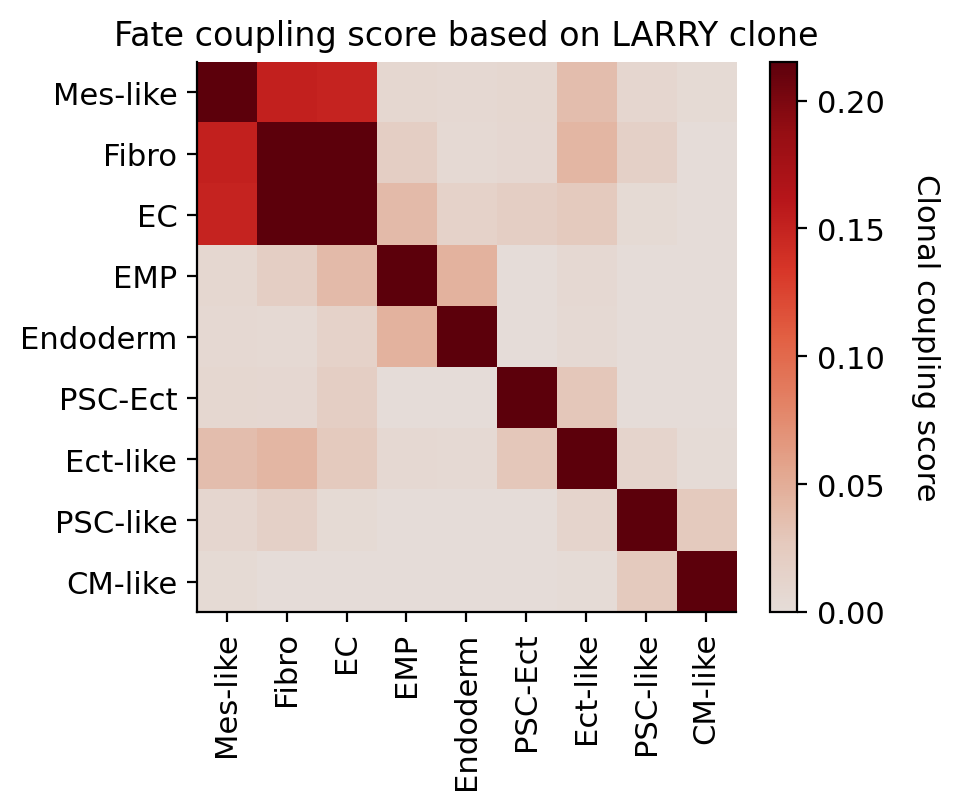

In [171]:
cs.tl.fate_coupling(
    n_adata_orig, source="X_clone"
)  # compute the fate coupling

fig, ax = plt.subplots(figsize=(5, 4))
cs.pl.fate_coupling(n_adata_orig, source="X_clone", ax=ax)  # actually plot the coupling
ax.set_title('Fate coupling score based on LARRY clone')

(9, 121) (9, 139)
1e-10
[0 1 2 3 4 5 6 7 8]


Text(0.5, -4.40277777777777, 'Cell type')

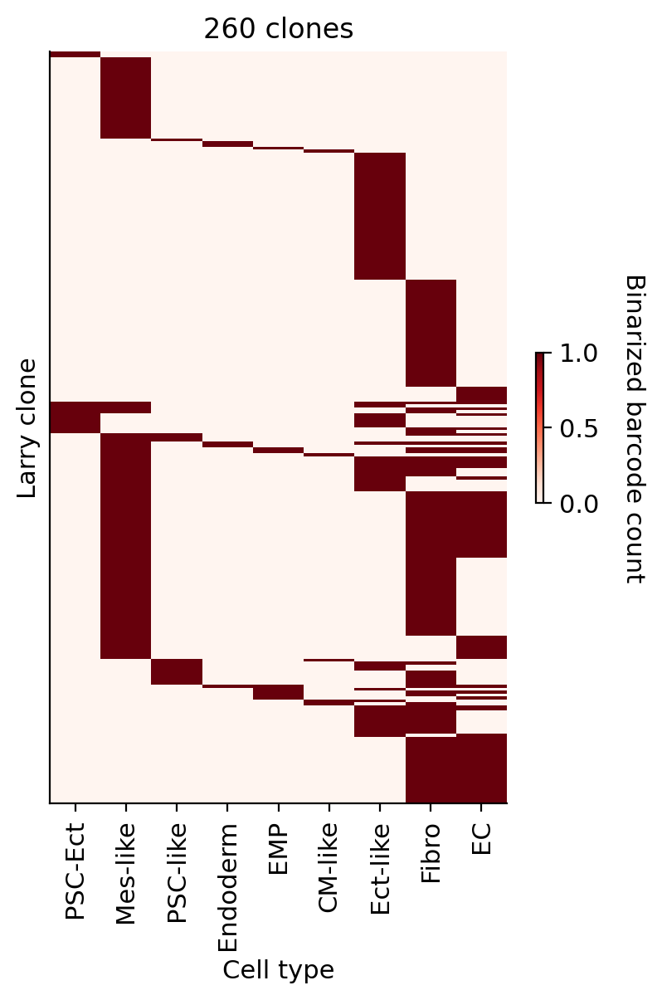

In [172]:
ax = barcode_heatmap(
    n_adata_orig,
    color_bar=True,
    log_transform=False,
    binarize=True,
)
ax.set_ylabel('Larry clone')
ax.set_xlabel('Cell type')

normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
Results saved as dictionary at adata.uns['fate_coupling_X_clone']
x_order: [0,1,2,3,4,5,6,7,8]
x_ticks: ['PSC-Ect','Mes-like','PSC-like','Endoderm','EMP','CM-like','Ect-like','Fibro','EC']
y_order: [0,1,2,3,4,5,6,7,8]
y_ticks: ['PSC-Ect','Mes-like','PSC-like','Endoderm','EMP','CM-like','Ect-like','Fibro','EC']


Text(0.5, 1.0, 'Fate coupling score based on LARRY clone')

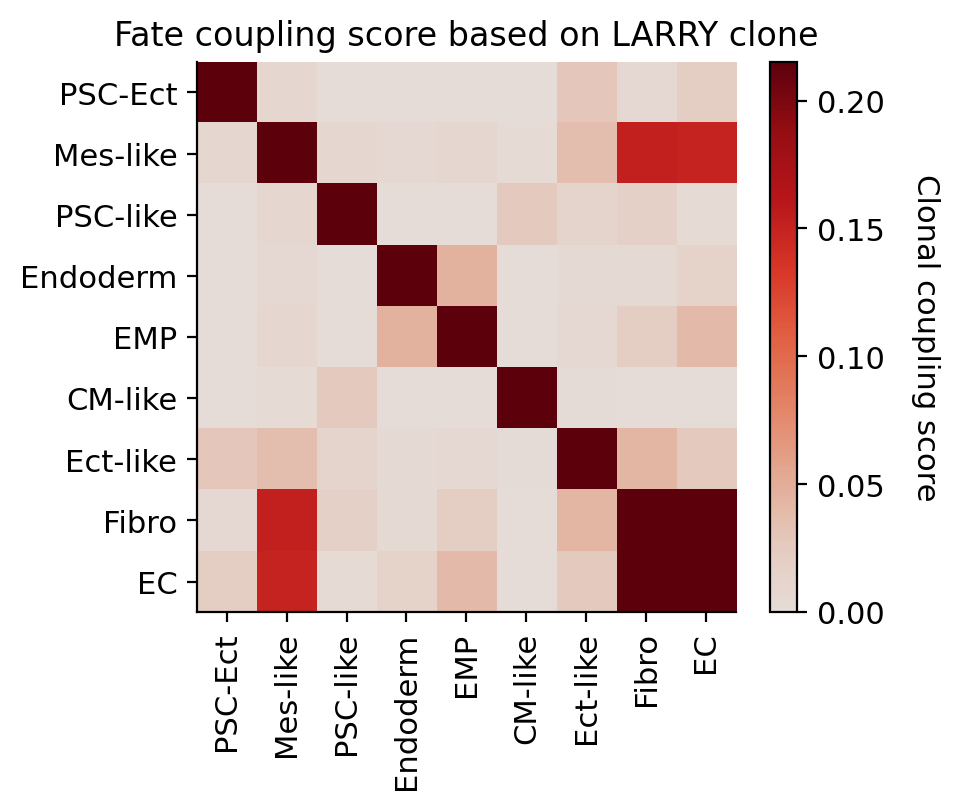

In [173]:
cs.tl.fate_coupling(
    n_adata_orig, source="X_clone"
)  # compute the fate coupling

fig, ax = plt.subplots(figsize=(5, 4))
cs.pl.fate_coupling(n_adata_orig, source="X_clone", ax=ax, order_map_x=False, order_map_y=False, print_ordered_labels=True)  # actually plot the coupling
# heatmap(adata_orig.uns["fate_coupling_X_clone"]["X_coupling"], ax=ax, order_map_x=True, order_map_y=True, print_ordered_labels=True)  # actually plot the coupling
ax.set_title('Fate coupling score based on LARRY clone')

In [154]:
cs.tl.fate_hierarchy(
    n_adata_orig, source="X_clone"
)  # compute the fate hierarchy
cs.pl.fate_hierarchy(n_adata_orig, source="X_clone")  # actually plot the hierarchy

normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
normalize by X_clone
each selected cluster has a unique time point. Normalize per time point
Results saved as dictionary at adata.uns['fate_hierarchy_X_clone']

                  /-Fibro
               /-|
            /-|   \-EC
           |  |
         /-|   \-Mes-like
        |  |
      /-|   \-Ect-like
     |  |
     |  |   /-Endoderm
   /-|   \-|
  |  |      \-EMP
  |  |
--|  |   /-PSC-like
  |   \-|
  |      \-CM-like
  |
   \-PSC-Ec

In [155]:
_n_adata_orig = n_adata_orig
vadata = scv.utils.merge(_n_adata_orig, ldata)
scv.pp.filter_and_normalize(vadata, log=False)
scv.pp.moments(vadata)

Normalized count data: X, spliced, unspliced.
computing neighbors


/var/tmp/pbs.43488.hpc-hn001/ipykernel_45134/3475590343.py:4: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(vadata)
/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(


    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


computing velocities


/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/48 cores)


  0%|          | 0/998 [00:00<?, ?cells/s]

/home/jhsu/yes/envs/scanpy/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=45134) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:00:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_emb', embedded velocity vectors (adata.obsm)


/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/jhsu/yes/envs/scanpy/lib/python3.12/site-packages/scvelo/plotting/utils.py:6

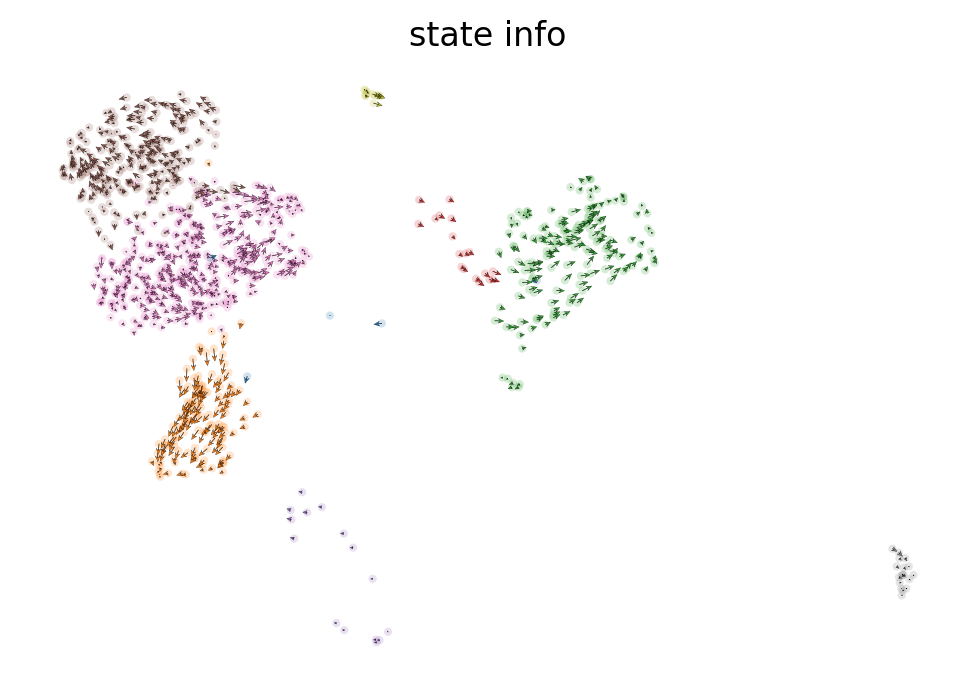

In [156]:
scv.tl.velocity(vadata, mode='stochastic')
scv.tl.velocity_graph(vadata)
scv.pl.velocity_embedding(vadata, basis='X_emb', color="state_info")
import warnings
warnings.filterwarnings("ignore")

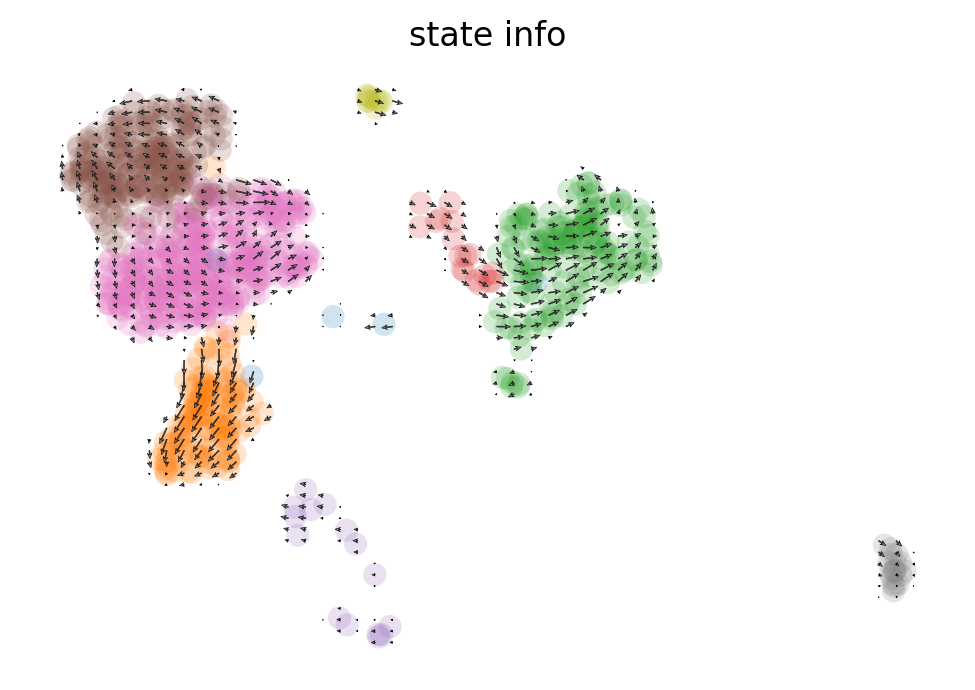

In [157]:
scv.pl.velocity_embedding_grid(vadata, basis='X_emb', color="state_info")
# scv.pl.velocity_embedding_stream(vadata, basis='X_emb', color="state_info")

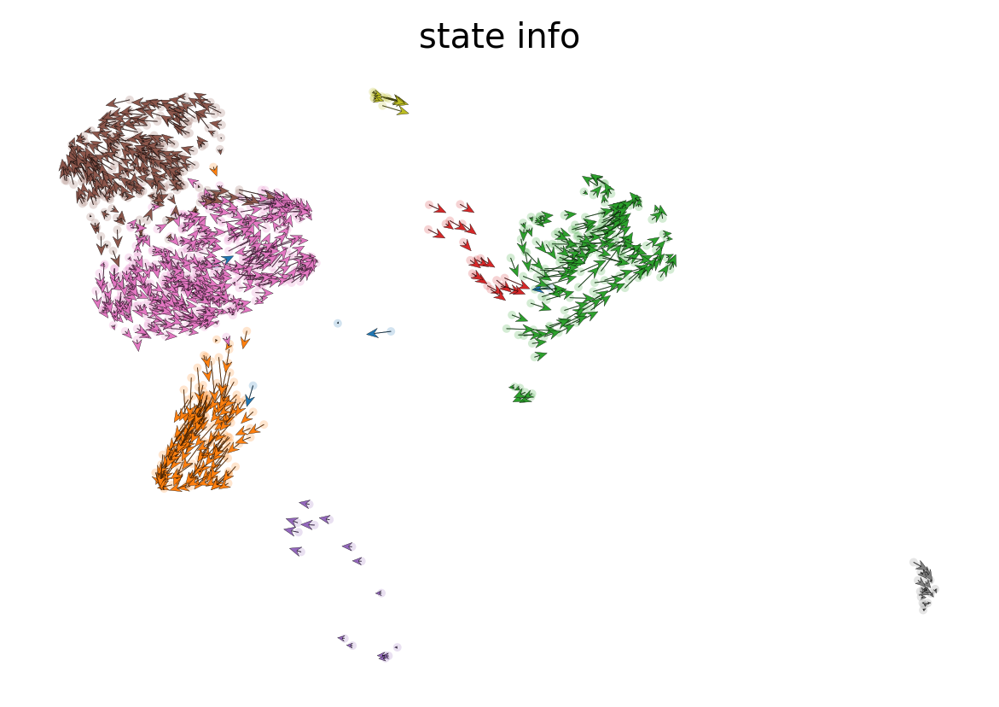

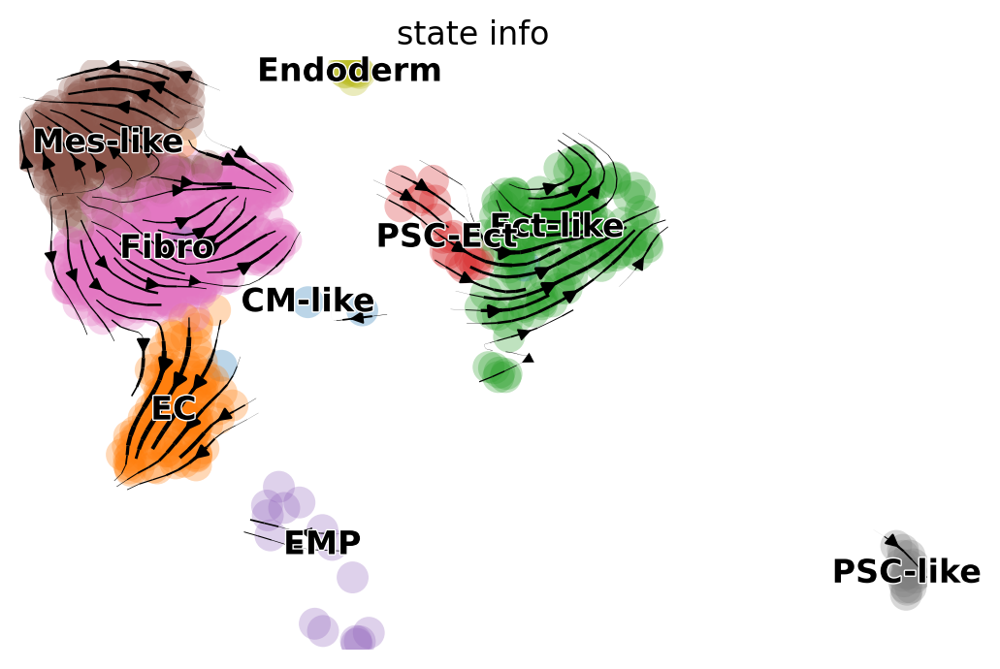

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


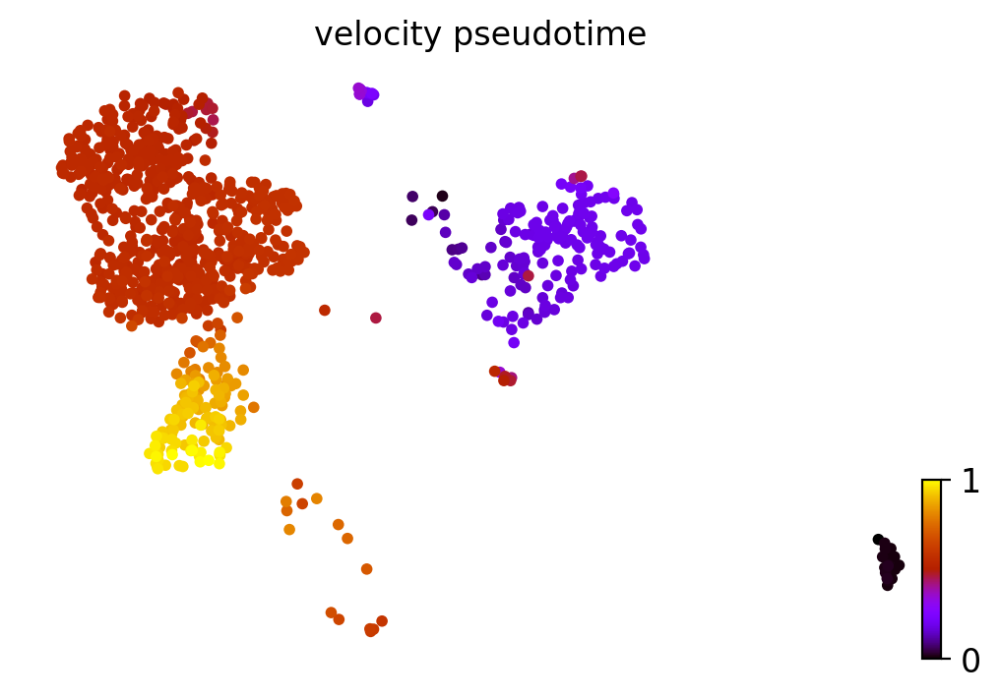

In [158]:
scv.pl.velocity_embedding(vadata, arrow_length=3, arrow_size=2, dpi=120, basis='X_emb', color="state_info")
scv.pl.velocity_embedding_stream(vadata, basis='X_emb', color="state_info")
scv.tl.velocity_pseudotime(vadata)
scv.pl.scatter(vadata, color='velocity_pseudotime', cmap='gnuplot', basis='X_emb', )

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


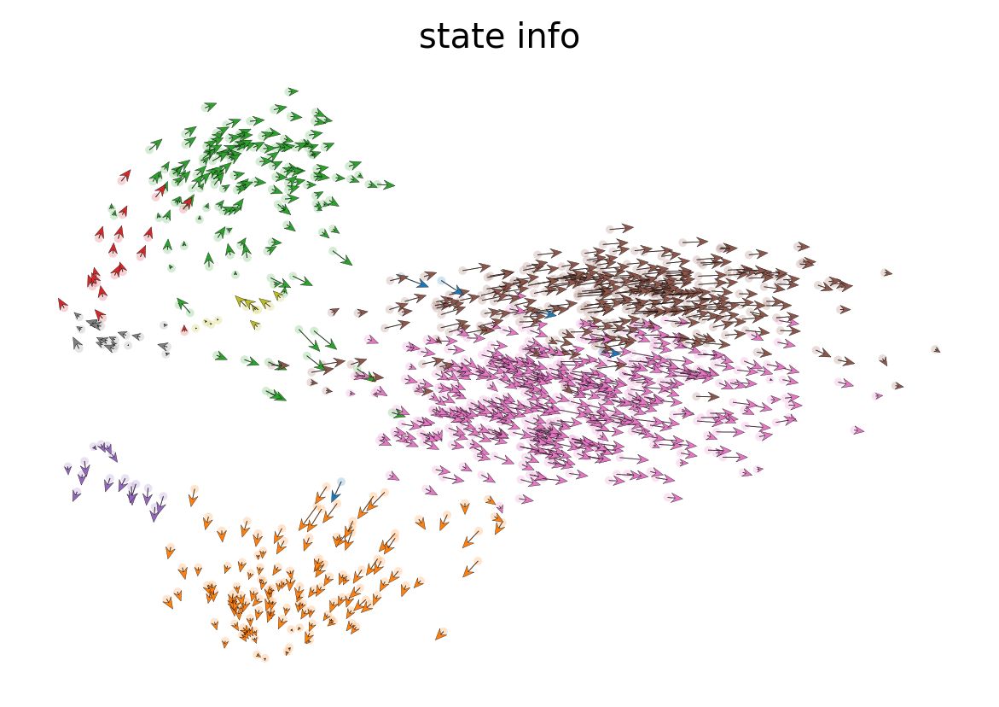

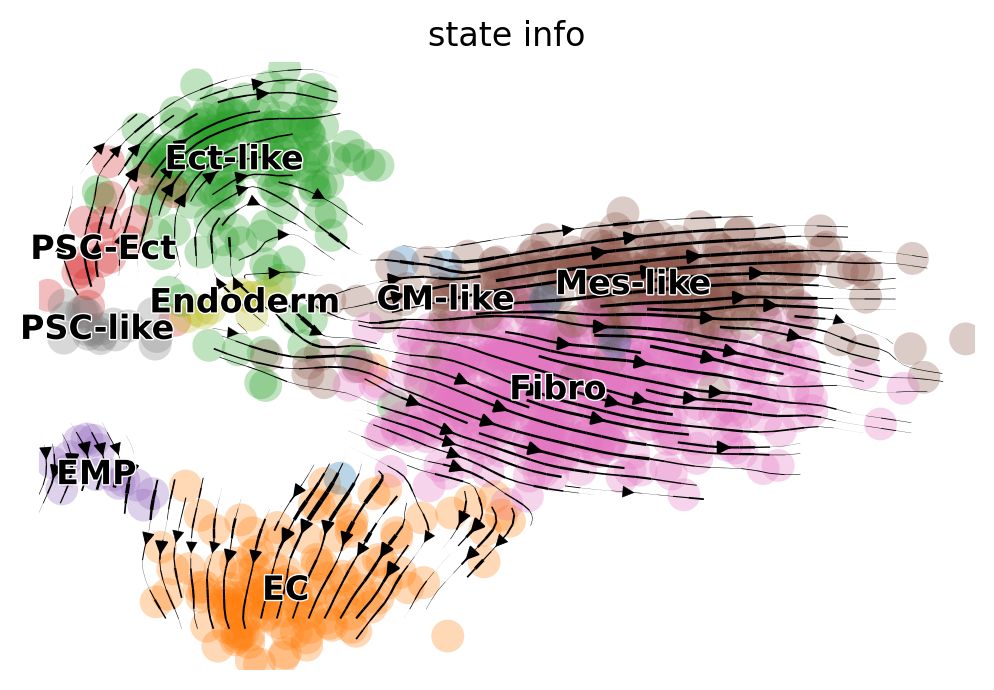

In [159]:
scv.pl.velocity_embedding(vadata, arrow_length=3, arrow_size=2, dpi=120, basis='pca', color="state_info")
scv.pl.velocity_embedding_stream(vadata, basis='pca', color="state_info")
# scv.tl.velocity_pseudotime(vadata)
# scv.pl.scatter(vadata, color='velocity_pseudotime', cmap='gnuplot')

In [161]:
# this is needed due to a current bug - bugfix is coming soon.
vadata.uns['neighbors']['distances'] = vadata.obsp['distances']
vadata.uns['neighbors']['connectivities'] = vadata.obsp['connectivities']

In [162]:
scv.tl.paga(vadata, groups='state_info')
# df = scv.get_df(vadata, 'paga/transitions_confidence', precision=2).T
# df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


<Axes: >

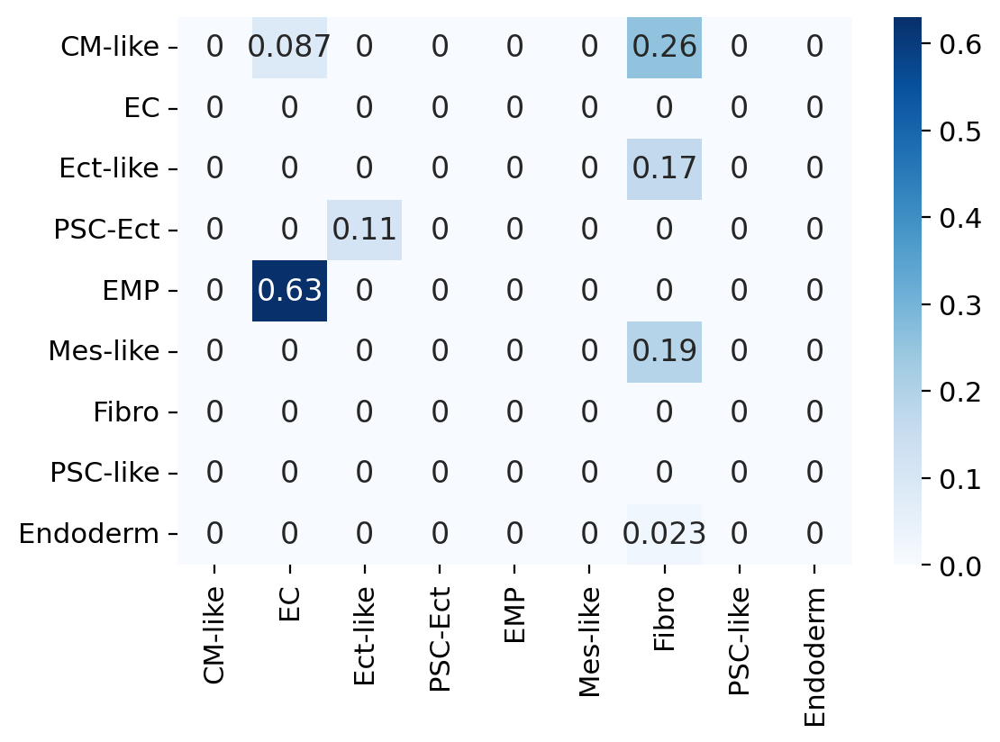

In [163]:
df = scv.get_df(vadata, 'paga/transitions_confidence', precision=2).T
sns.heatmap(df, annot=True, cmap='Blues')

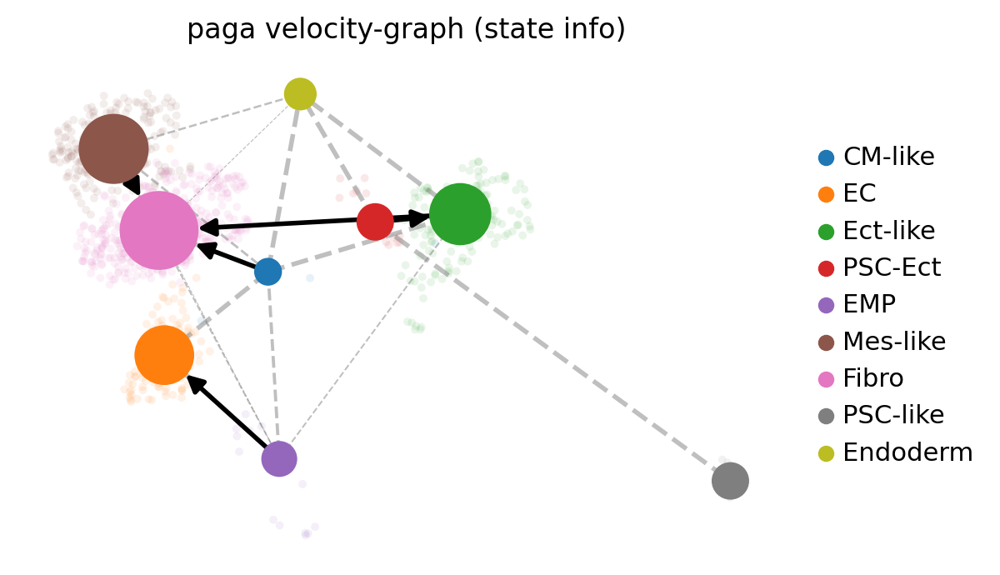

In [164]:
scv.pl.paga(vadata, basis='emb', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

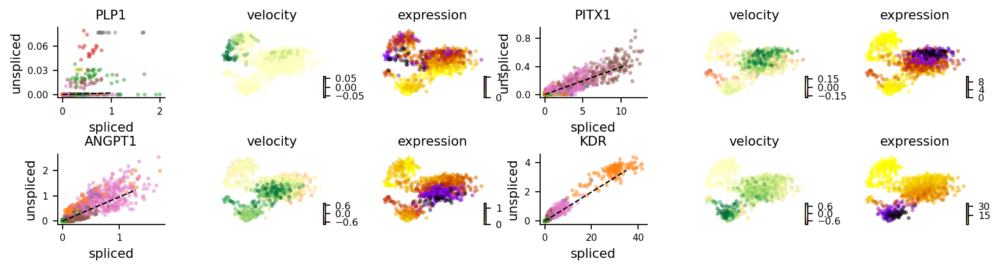

In [165]:
scv.pl.velocity(vadata, ['PLP1',  'PITX1', 'ANGPT1', 'KDR'], ncols=2, color="state_info")


In [141]:
scv.tl.rank_velocity_genes(vadata, groupby='state_info', min_corr=.3)

df = pd.DataFrame(vadata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:09) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,CM-like,EC,Ect-like,PSC-Ect,EMP,Mes-like,Fibro,PSC-like,Endoderm
0,NDC80,ZNF521,MYO5B,MTCL1,RUNX1,PRDM6,AC068587.4,OSBPL3,GNRH2
1,RAP2C,THSD1,CCBE1,ACADL,IKZF1,BNC2,PRRX1,LRRC23,CUBN
2,CAP1,SP100,PATJ,DOCK3,BMP2K,SH3RF2,RBMS3,CDH4,RASSF6
3,KIF14,GDPD5,TMTC2,GRIK5,CR1L,NAV2,ZEB2,NAV3,SYTL5
4,GABRB3,CDK17,ADAM28,AIF1L,TIMP3,PLCE1,NRP1,BCL11B,AL121578.3


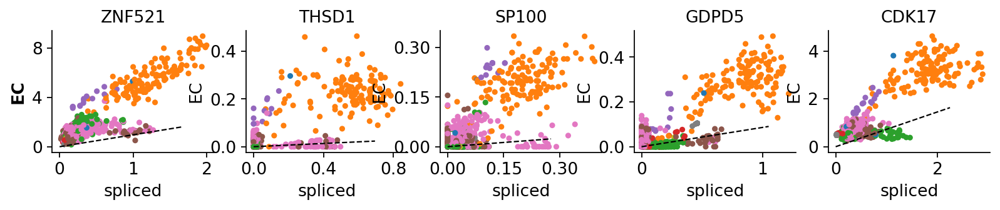

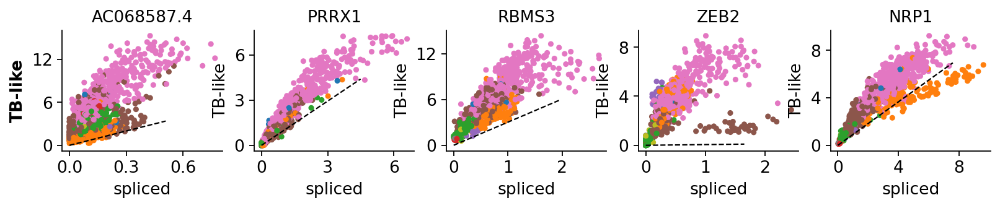

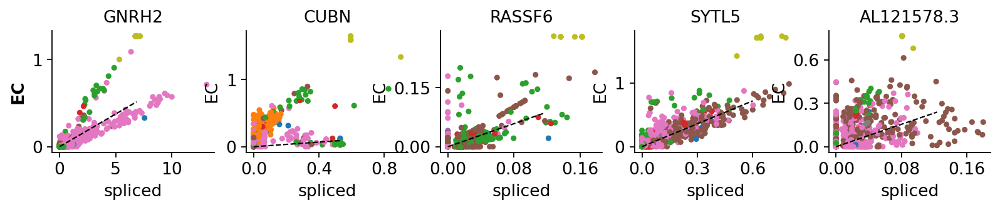

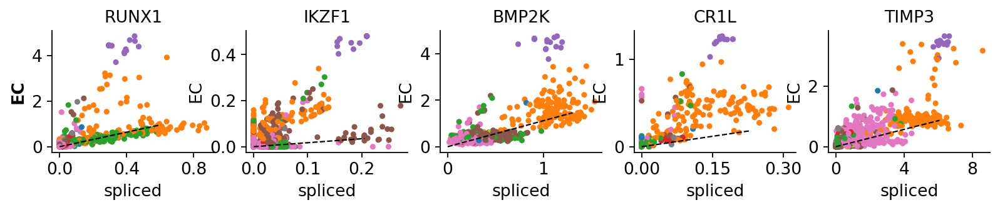

In [142]:
# kwargs = dict(frameon=False, size=10, linewidth=1.5,
#               add_outline='TB-like, EC')

scv.pl.scatter(vadata, df['EC'][:5], ylabel='EC', color='state_info')
scv.pl.scatter(vadata, df['Fibro'][:5], ylabel='TB-like', color='state_info')
scv.pl.scatter(vadata, df['Endoderm'][:5], ylabel='EC', color='state_info')
scv.pl.scatter(vadata, df['EMP'][:5], ylabel='EC', color='state_info')

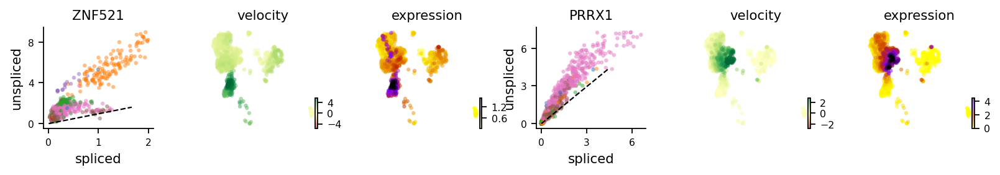

In [143]:
scv.pl.velocity(vadata, ['ZNF521',  'PRRX1'], basis='emb', ncols=2, color="state_info")